# Librairies

In [3]:
# Basic librairies (all the librairies used for the machine learning are imported in the tools.py file)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Data importation
data = pd.read_sas("datas/total_red.sas7bdat")

In [4]:
from DreamLib.linear_models import *
from DreamLib.processing_datas import *
import datas.selected_columns_24 as cl

# Models Formulas


## Linear Regression
LinearRegression fits a linear model with coefficients $w = (w_1, ..., w_p)$ to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation. Mathematically it solves a problem of the form:

$$
\underset{\omega}{\text{min}}||X{\omega}-y||_{2}^{2}
$$

## Ridge Regression
Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients. The ridge coefficients minimize a penalized residual sum of squares:
$$\min_{w} || X w - y||_2^2 + \alpha ||w||_2^2$$

The complexity parameter 
α
≥
0
 controls the amount of shrinkage: the larger the value of $\alpha>0$, the greater the amount of shrinkage and thus the coefficients become more robust to collinearity.

## Lasso
The Lasso is a linear model that estimates sparse coefficients. It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent. For this reason, Lasso and its variants are fundamental to the field of compressed sensing. Under certain conditions, it can recover the exact set of non-zero coefficients.

Mathematically, it consists of a linear model with an added regularization term. The objective function to minimize is:

$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha ||w||_1}$$

## Elastic Net
ElasticNet is a linear regression model trained with both $\ell_1$ and $\ell_2$-norm regularization of the coefficients. This combination allows for learning a sparse model where few of the weights are non-zero like Lasso, while still maintaining the regularization properties of Ridge. We control the convex combination of $\ell_1$ and $\ell_2$ using the l1_ratio parameter.

Elastic-net is useful when there are multiple features that are correlated with one another. Lasso is likely to pick one of these at random, while elastic-net is likely to pick both.

A practical advantage of trading-off between Lasso and Ridge is that it allows Elastic-Net to inherit some of Ridge’s stability under rotation.

The objective function to minimize is in this case:
$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha \rho ||w||_1 +
\frac{\alpha(1-\rho)}{2} ||w||_2 ^ 2}$$

The class ElasticNetCV can be used to set the parameters alpha ($\alpha$) and l1_ratio ($\rho$) by cross-validation.

# Focus on Chronique CHR2

In [4]:
chronique=b'CHR2'
start = 1
period = 12
norm = "MinMax"
split = 0.2
# Useful to plot the model 
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train, X_test], axis=1).index

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

### Correlation Features

In [9]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
DecisionTreeRegressor,0.000231,5.333333e-08,0.000200,-0.699115
CatBoostRegressor,0.000255,6.501442e-08,0.000228,-1.071256
Ridge,0.000272,7.397786e-08,0.000206,-1.356817
KNeighborsRegressor,0.000322,1.038667e-07,0.000273,-2.309027
LinearRegression,0.000374,1.398241e-07,0.000299,-3.454572
LinearSVR,0.000381,1.450980e-07,0.000325,-3.622591


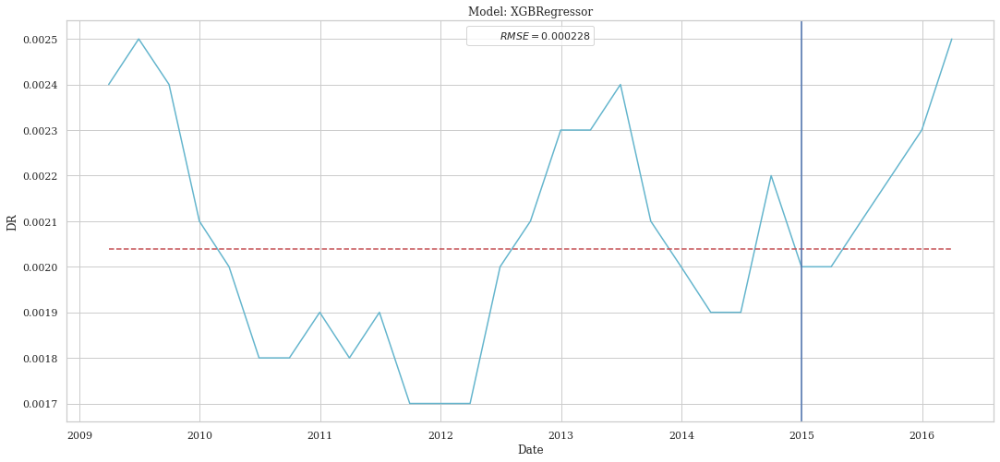

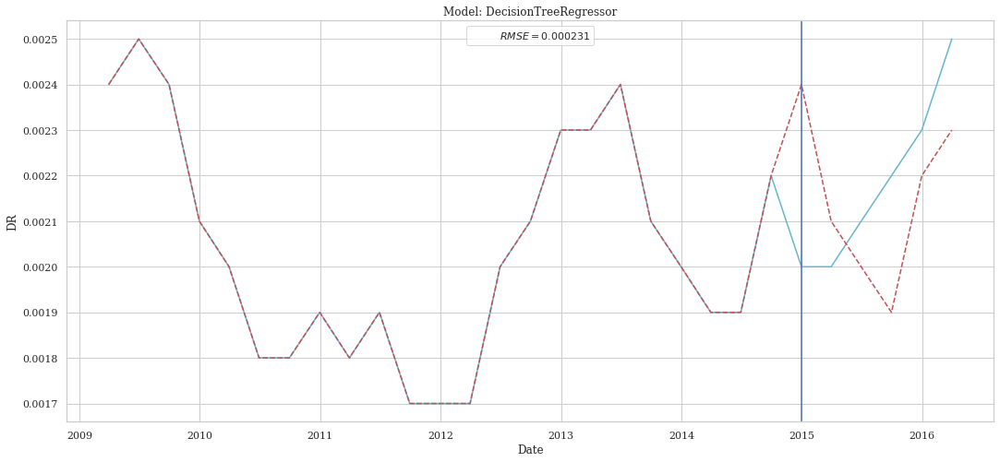

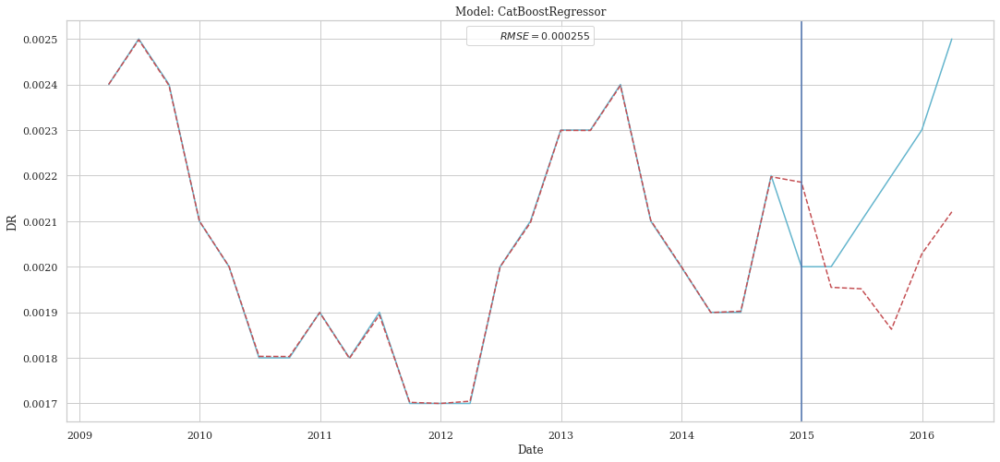

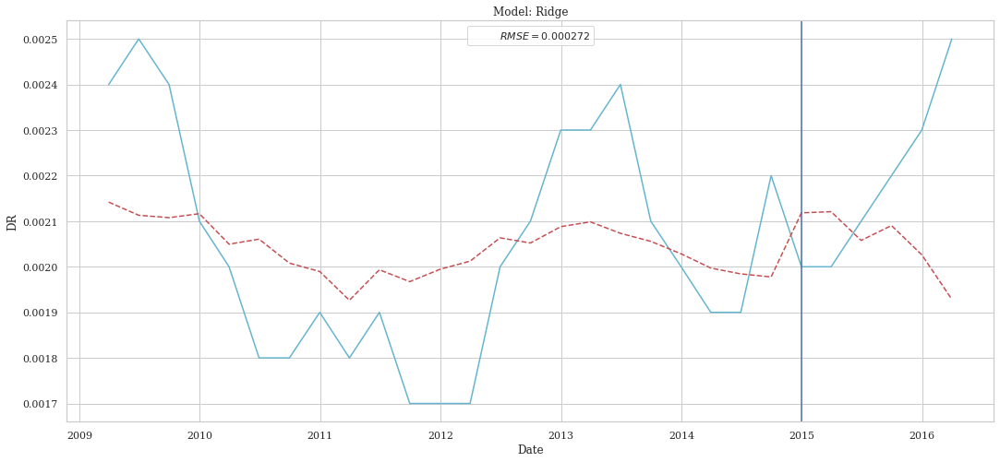

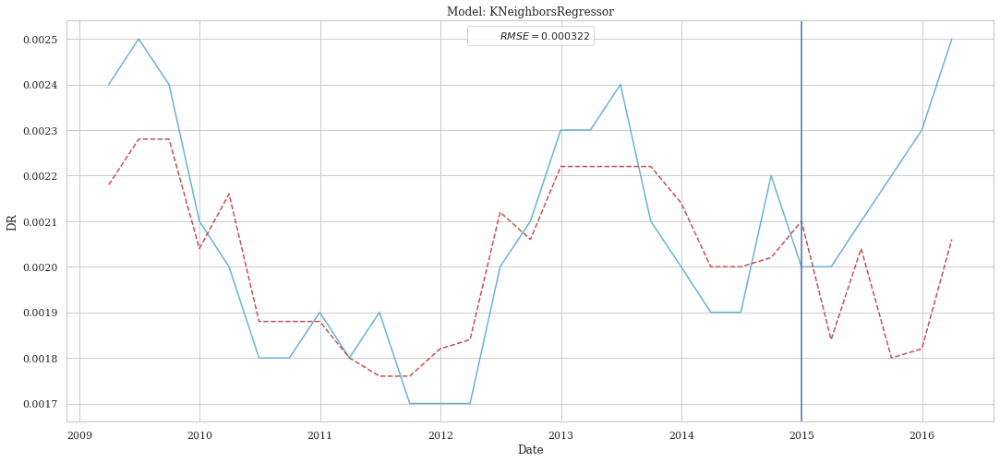

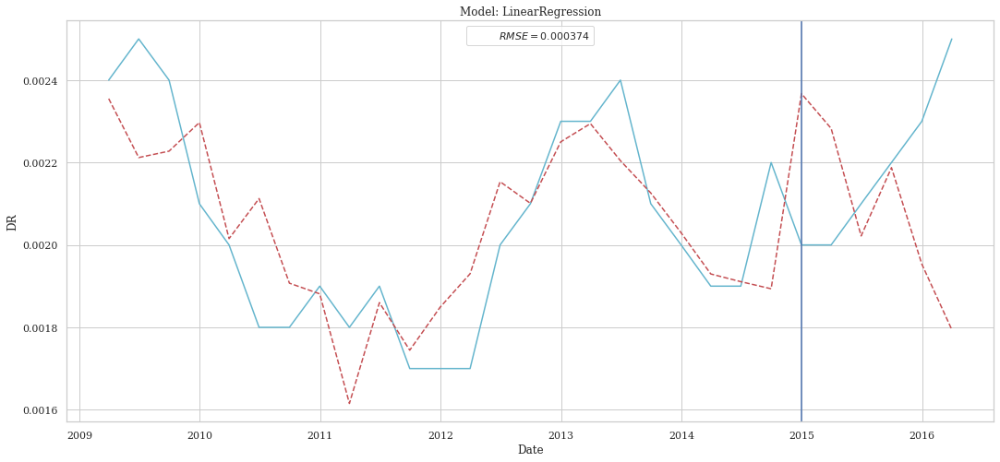

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


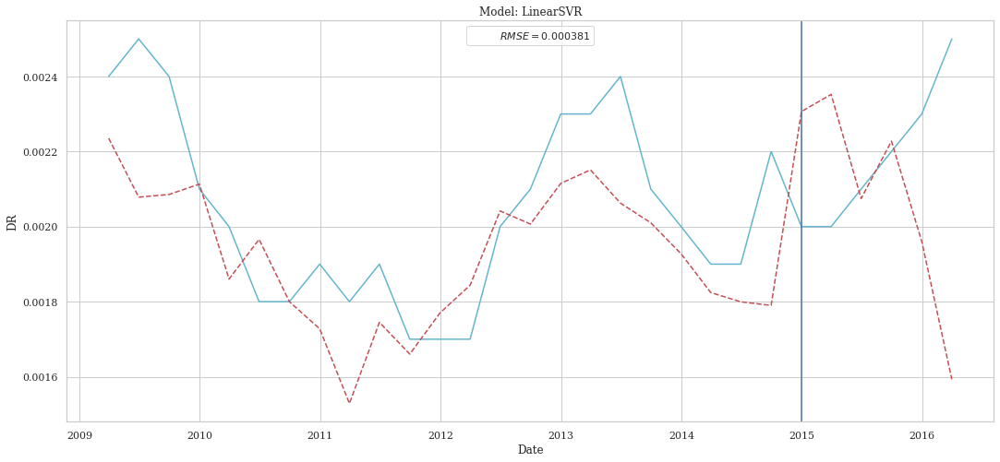

In [10]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [11]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000224,5.030068e-08,0.000181,-0.602500
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
DecisionTreeRegressor,0.000297,8.833333e-08,0.000283,-1.814159
Ridge,0.000302,9.129713e-08,0.000233,-1.908581
LinearRegression,0.000339,1.147915e-07,0.000331,-2.657075
KNeighborsRegressor,0.000348,1.214000e-07,0.000310,-2.867611
LinearSVR,0.000435,1.892981e-07,0.000339,-5.030736


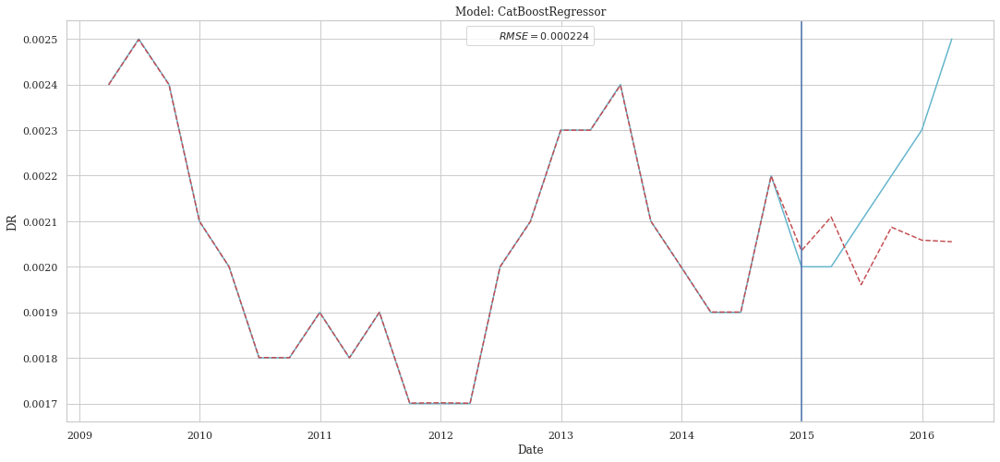

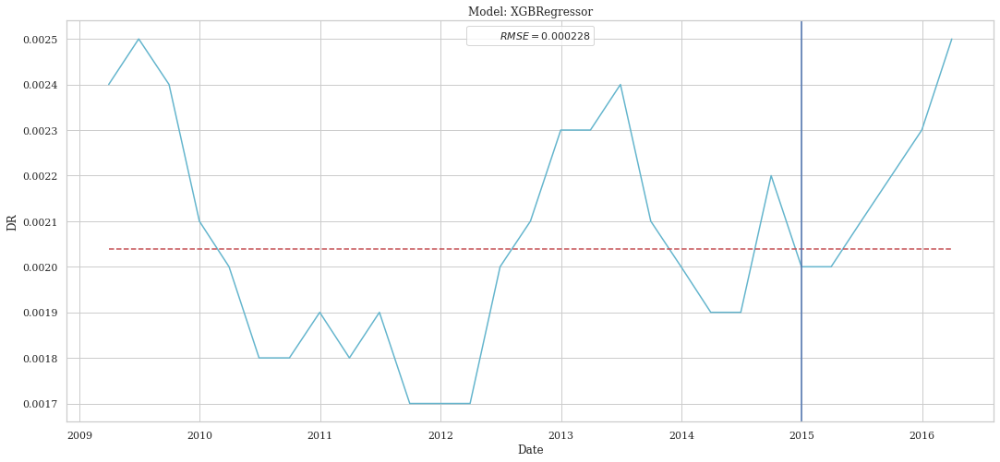

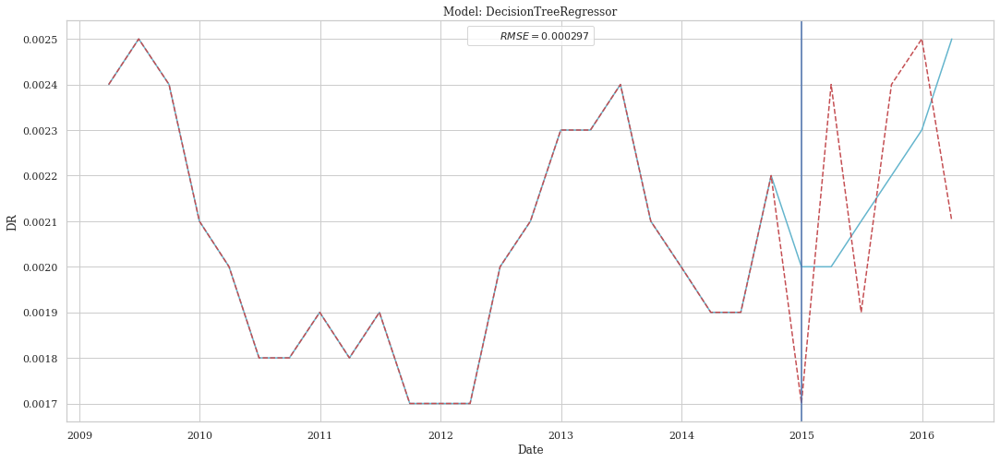

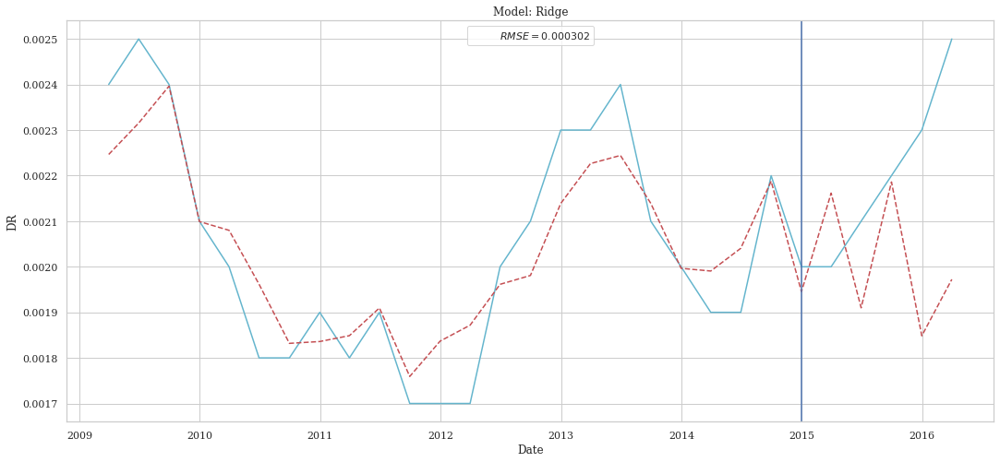

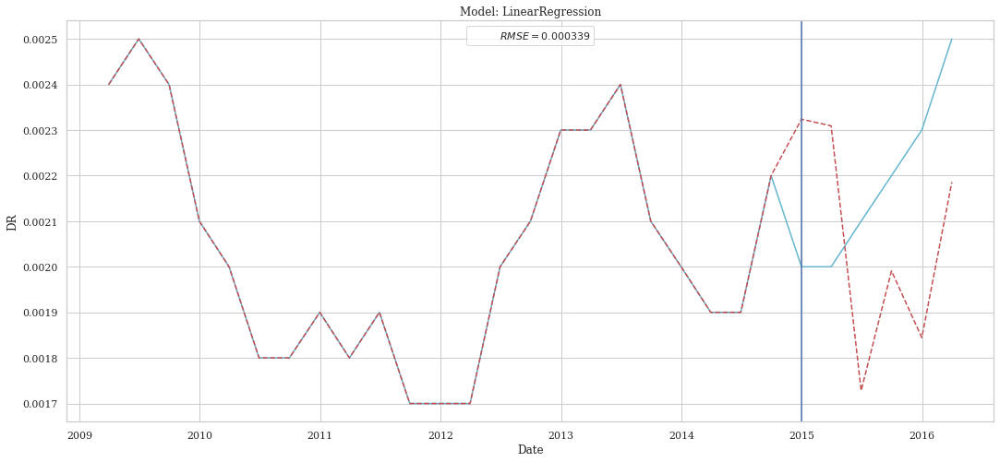

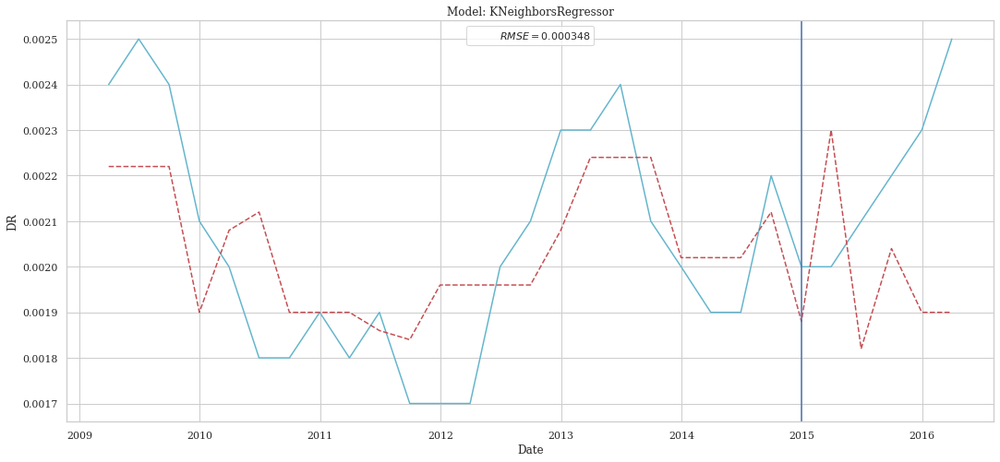

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


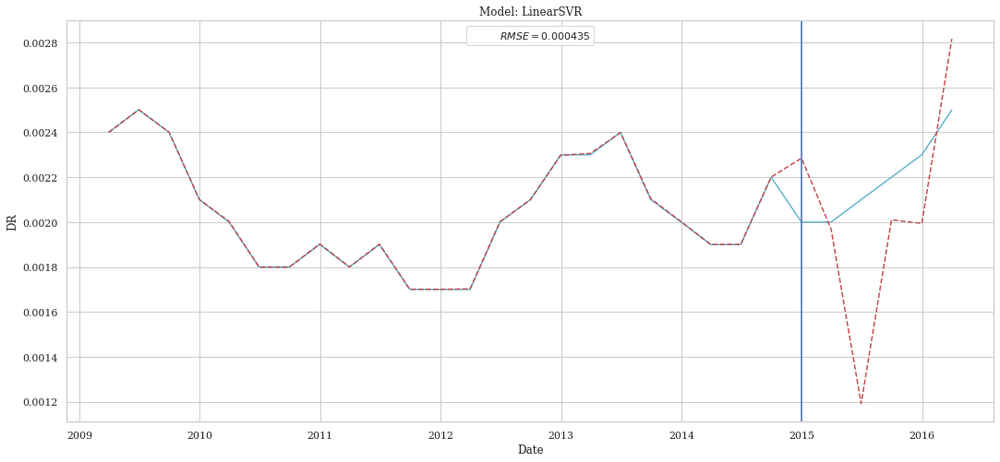

In [12]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [13]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
Ridge,0.000248,6.156911e-08,0.000200,-0.961494
CatBoostRegressor,0.000261,6.821754e-08,0.000204,-1.173302
DecisionTreeRegressor,0.000370,1.366667e-07,0.000333,-3.353982
KNeighborsRegressor,0.000388,1.508000e-07,0.000347,-3.804248
LinearSVR,0.000947,8.974021e-07,0.000893,-27.589801
LinearRegression,0.003043,9.262377e-06,0.002011,-294.084575


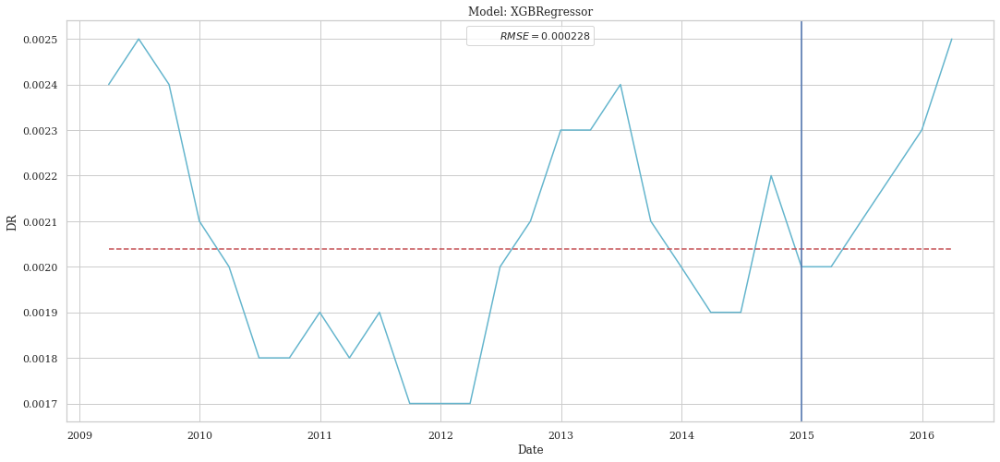

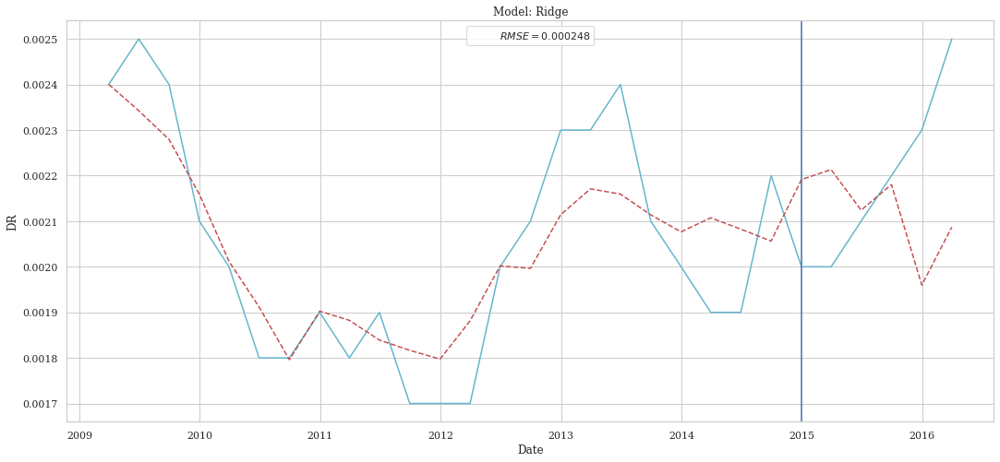

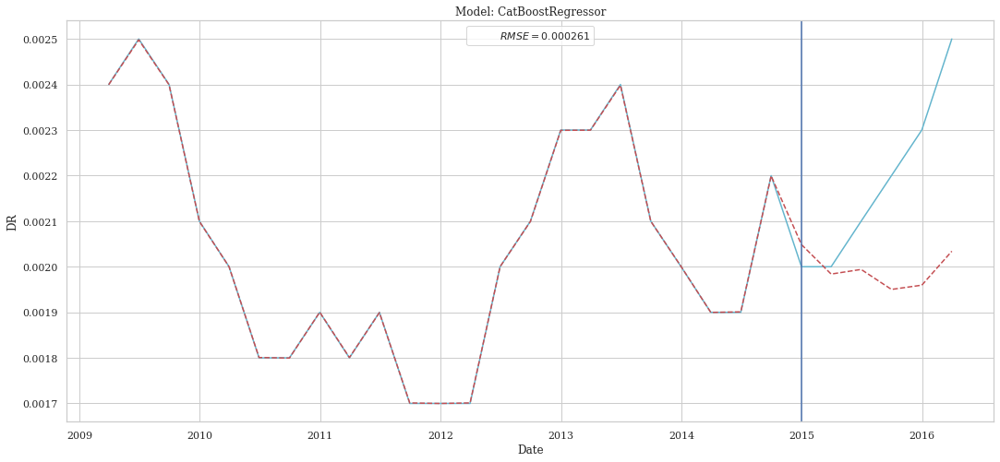

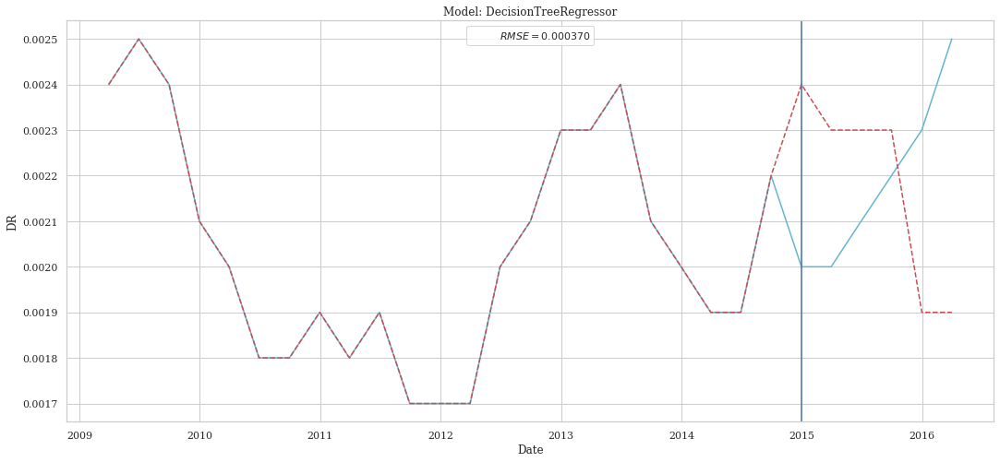

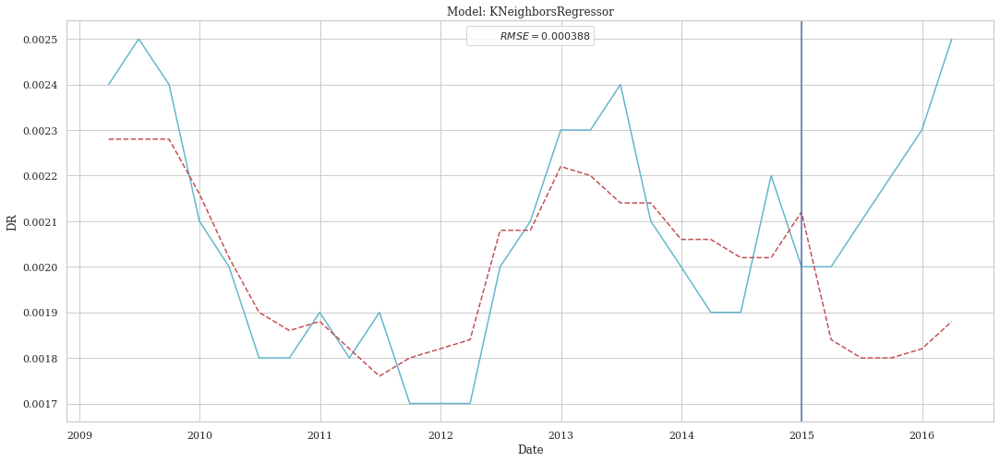

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


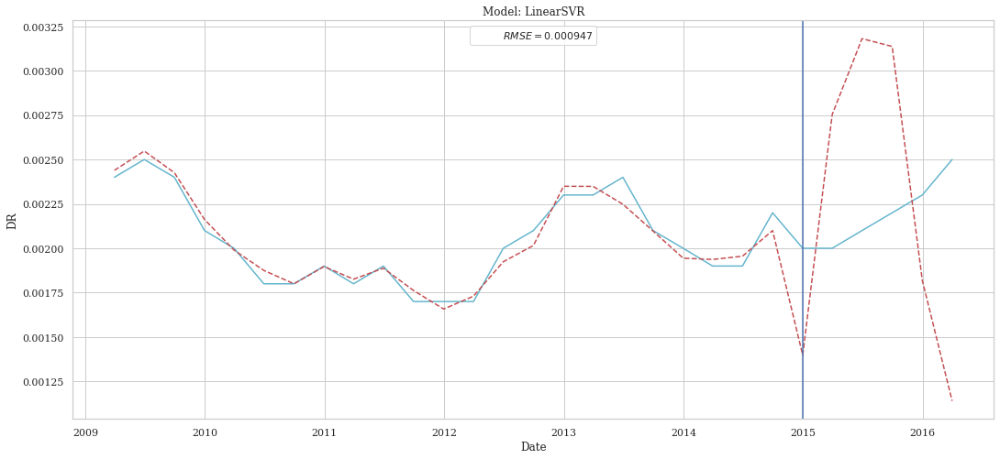

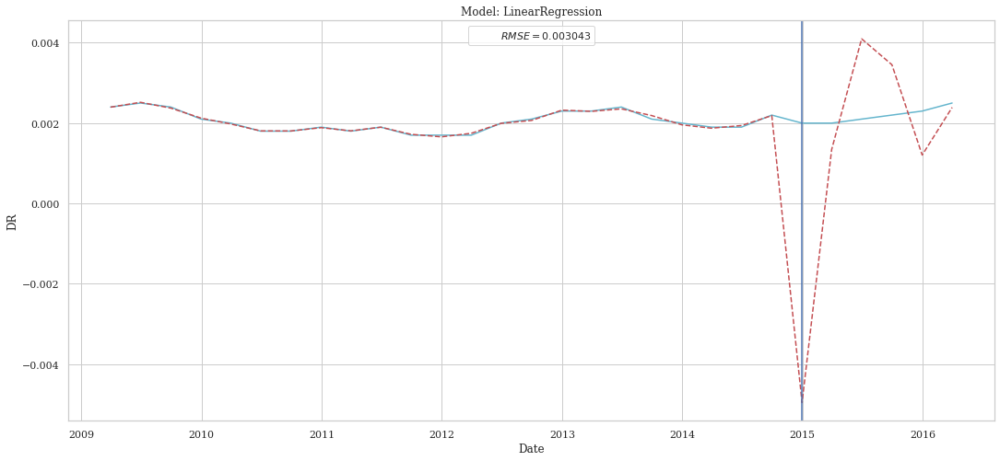

In [14]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [15]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.000204,4.166667e-08,0.000150,-0.327434
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000236,5.587913e-08,0.000187,-0.780220
Ridge,0.000314,9.854961e-08,0.000277,-2.139634
KNeighborsRegressor,0.000319,1.016000e-07,0.000253,-2.236814
LinearRegression,0.000461,2.122429e-07,0.000406,-5.761722
LinearSVR,0.000925,8.548730e-07,0.000869,-26.234892


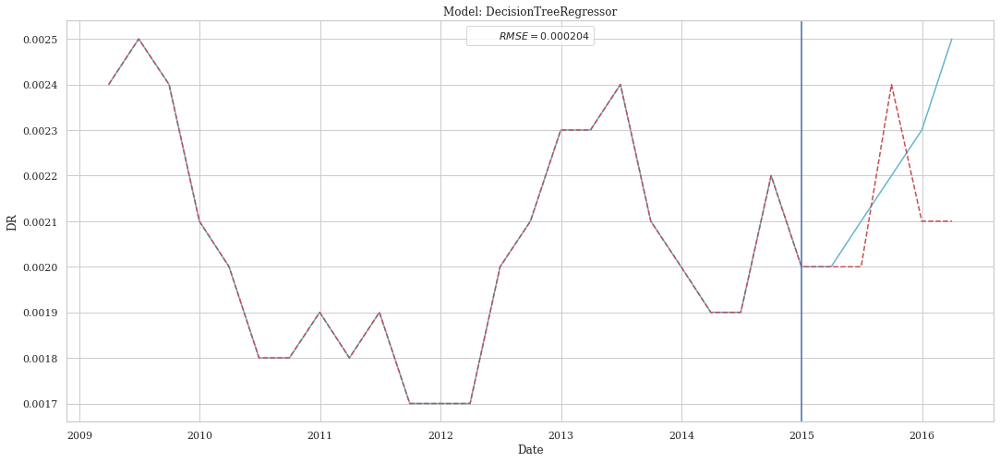

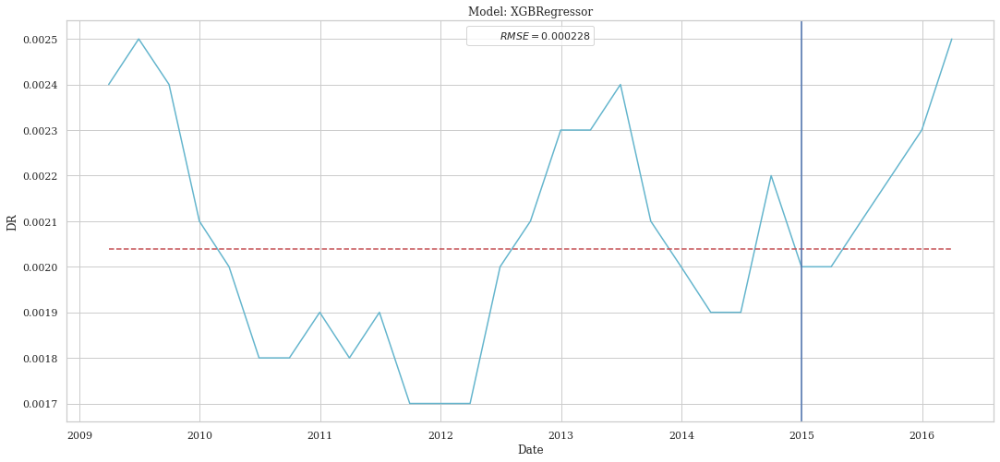

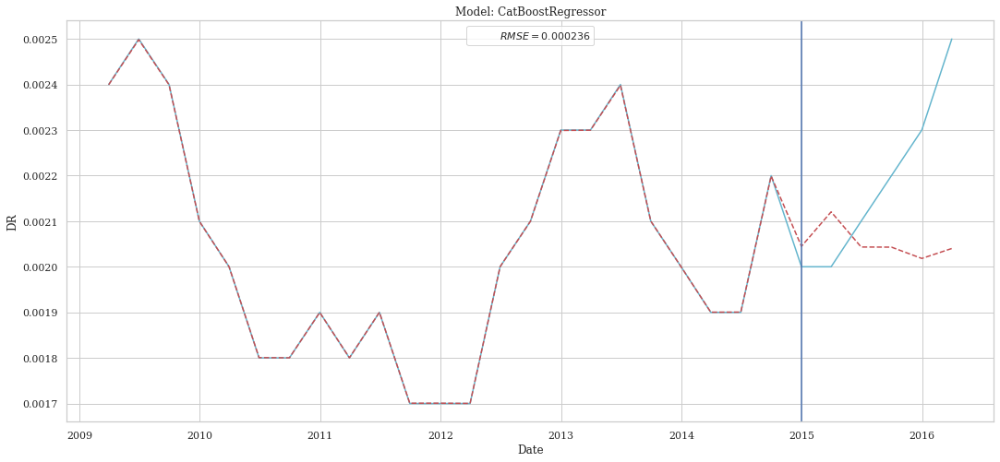

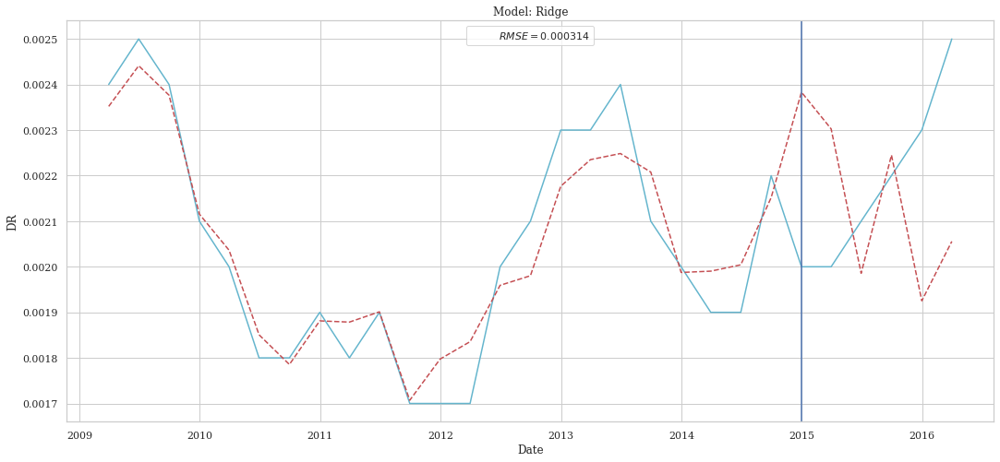

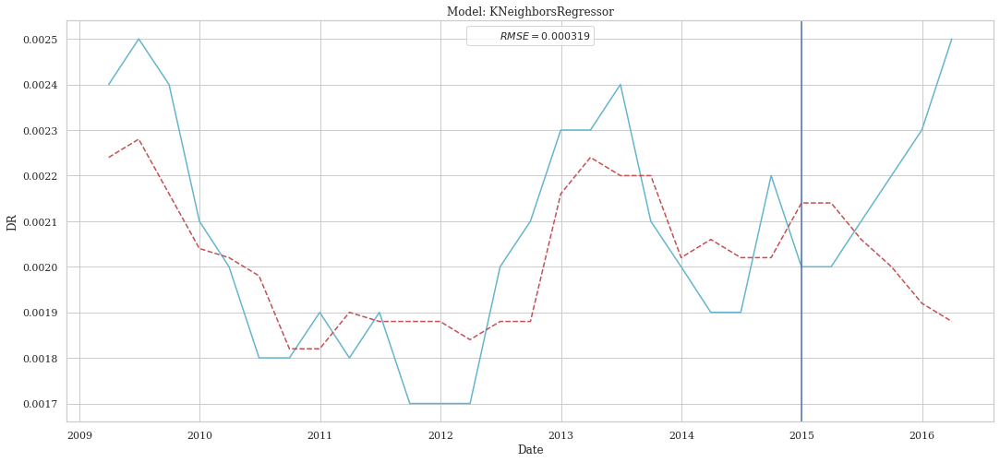

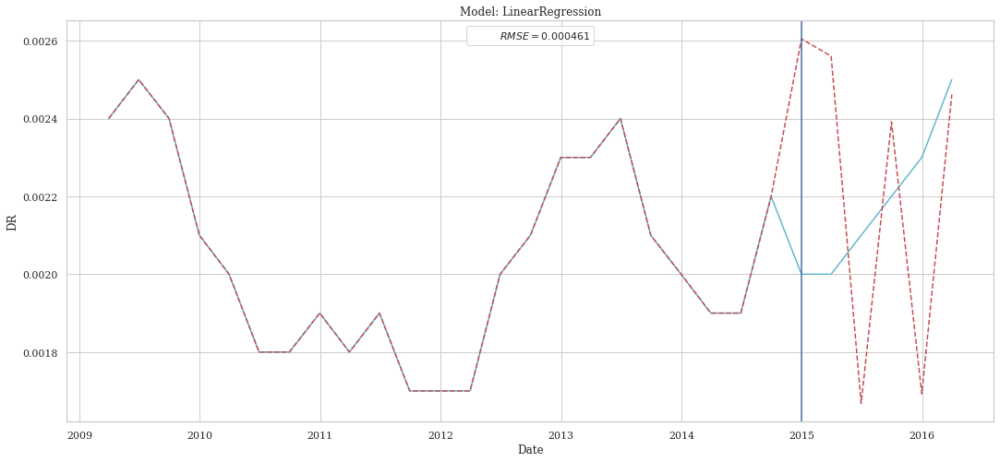

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


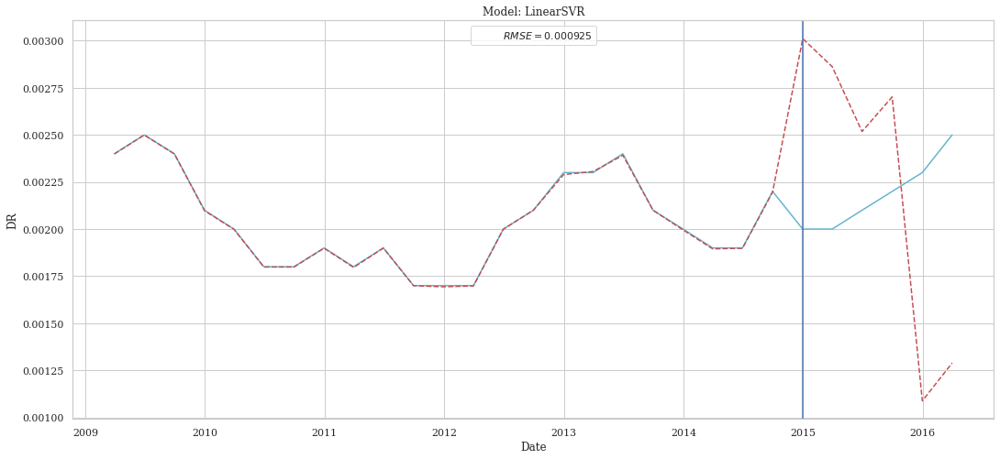

In [16]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [17]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000227,5.151447e-08,0.000190,-0.641169
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
DecisionTreeRegressor,0.000252,6.333333e-08,0.000200,-1.017699
Ridge,0.000343,1.175357e-07,0.000287,-2.744500
KNeighborsRegressor,0.000348,1.213333e-07,0.000280,-2.865487
LinearSVR,0.000495,2.451145e-07,0.000377,-6.808959
LinearRegression,0.000550,3.022299e-07,0.000488,-8.628563


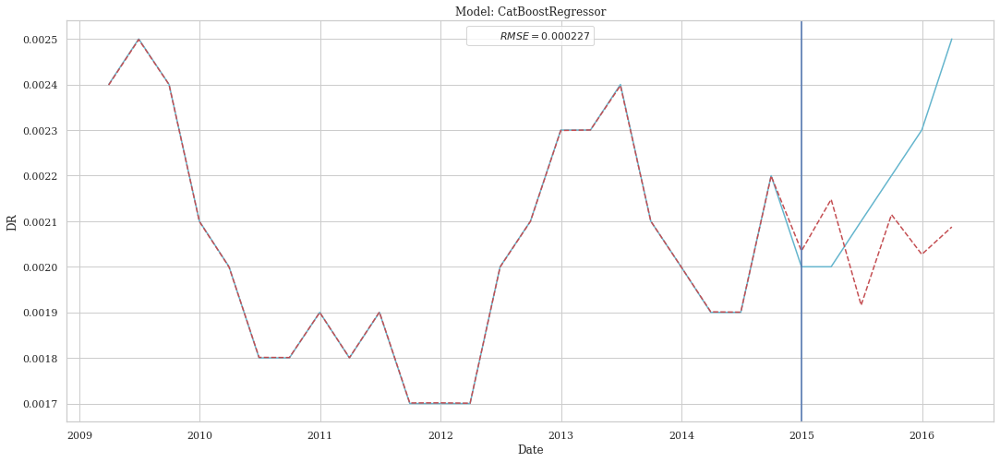

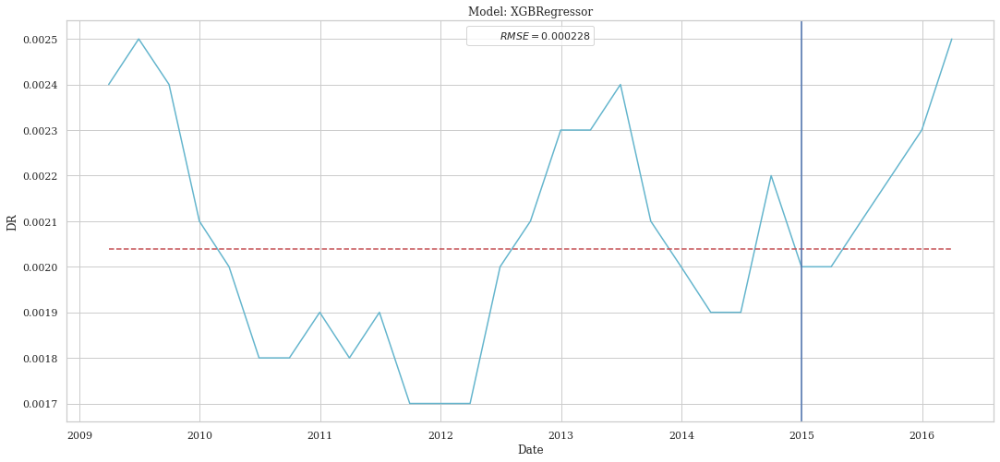

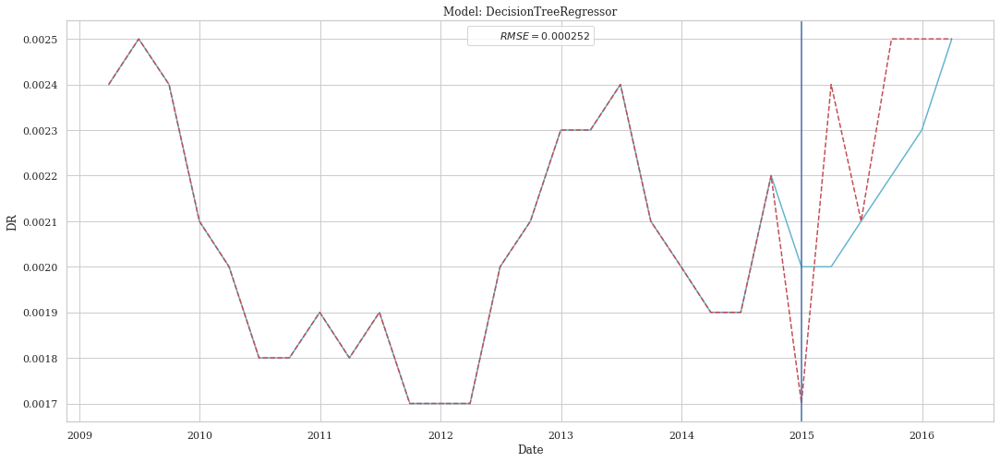

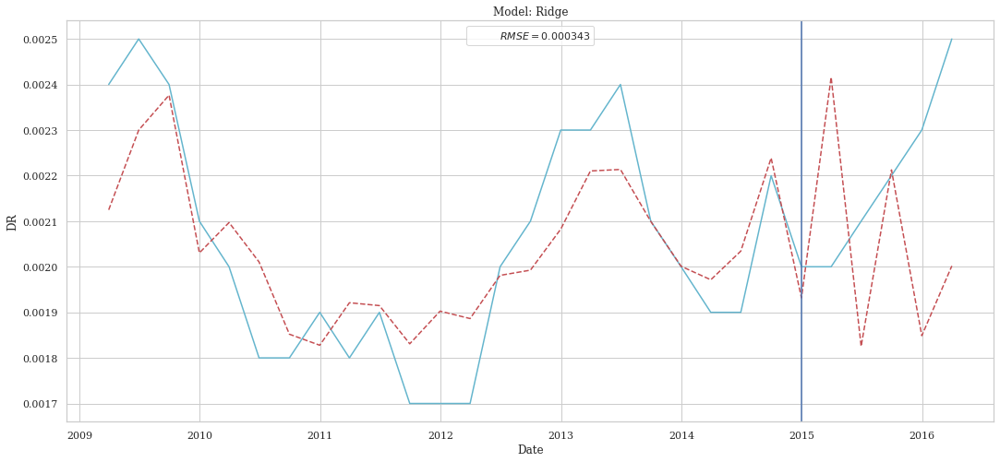

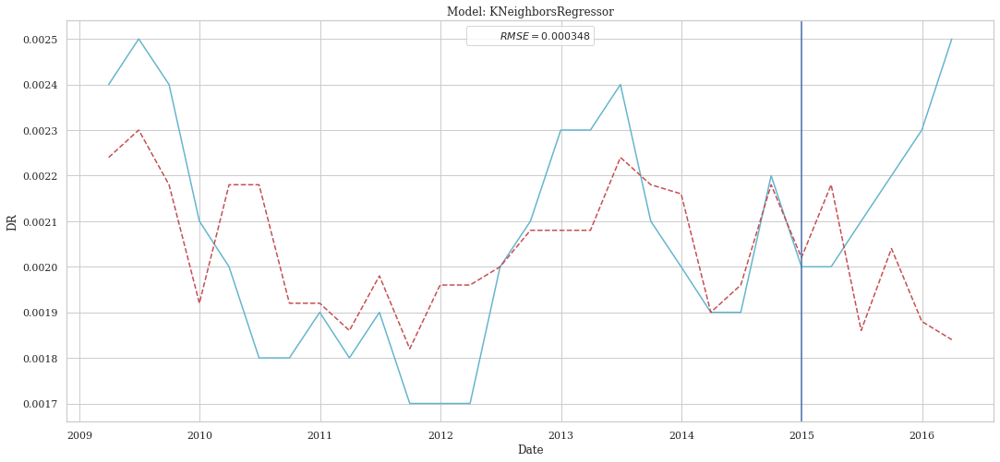

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


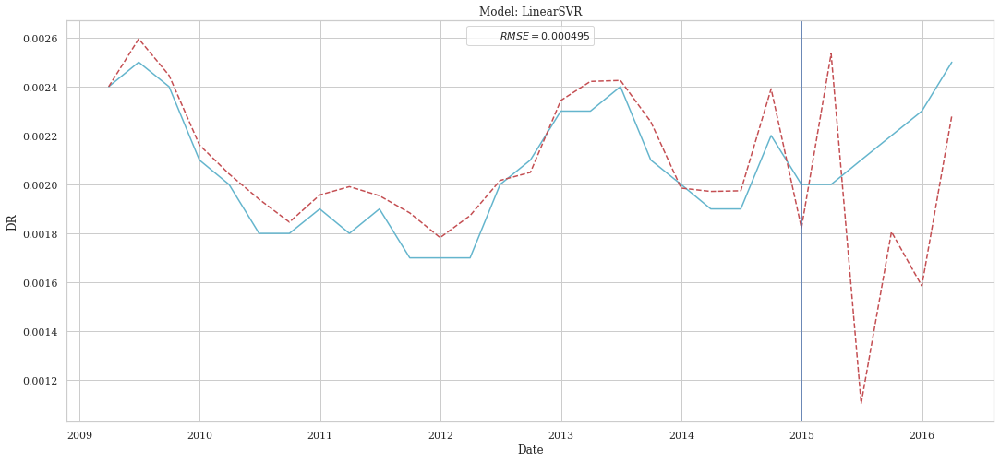

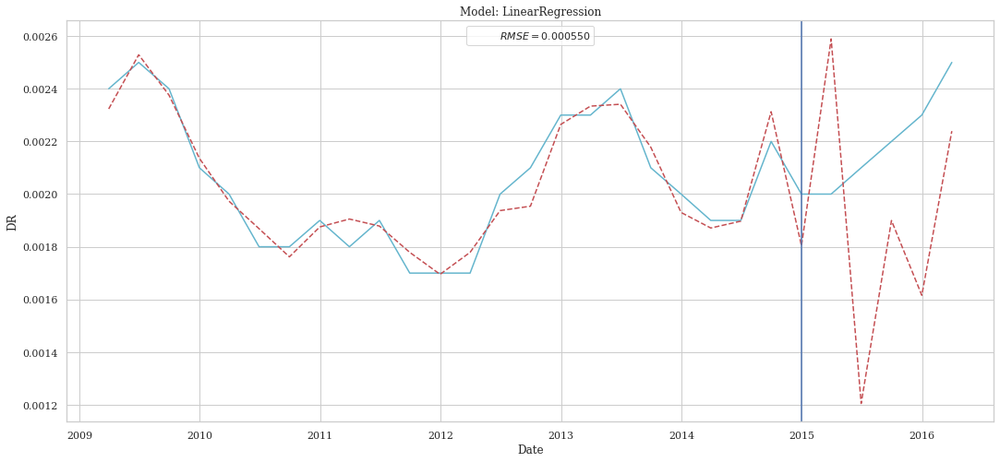

In [18]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [19]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.000217,4.724633e-08,0.000199,-0.505193
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000251,6.298633e-08,0.000204,-1.006644
KNeighborsRegressor,0.000393,1.547333e-07,0.000343,-3.929558
DecisionTreeRegressor,0.000424,1.800000e-07,0.000367,-4.734513
LinearSVR,0.000771,5.938674e-07,0.000676,-17.919669
LinearRegression,0.000846,7.162497e-07,0.000640,-21.818576


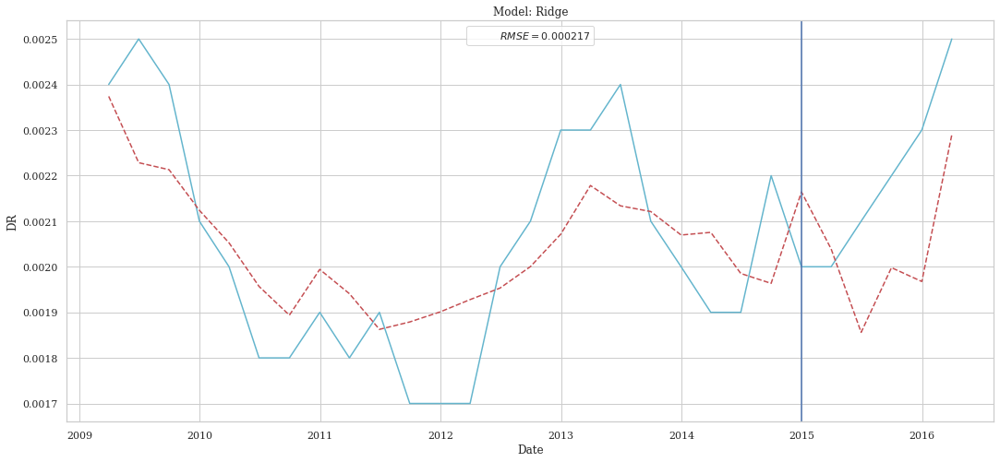

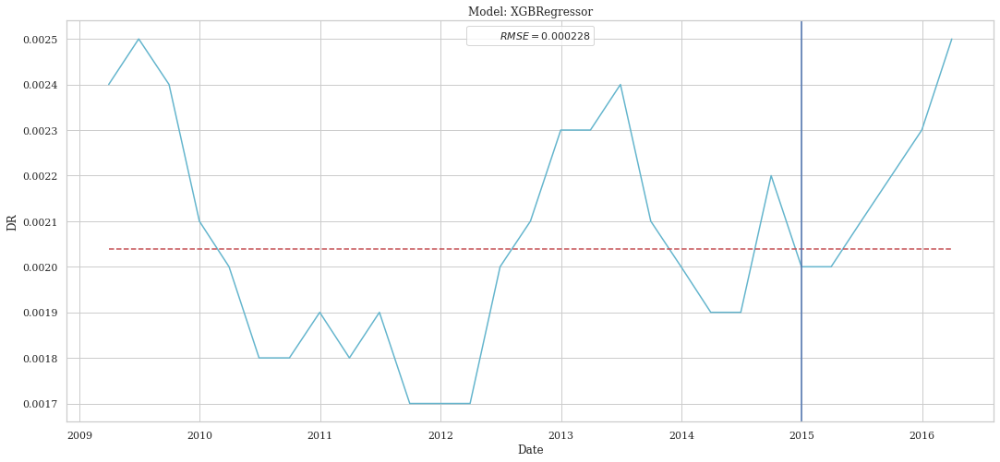

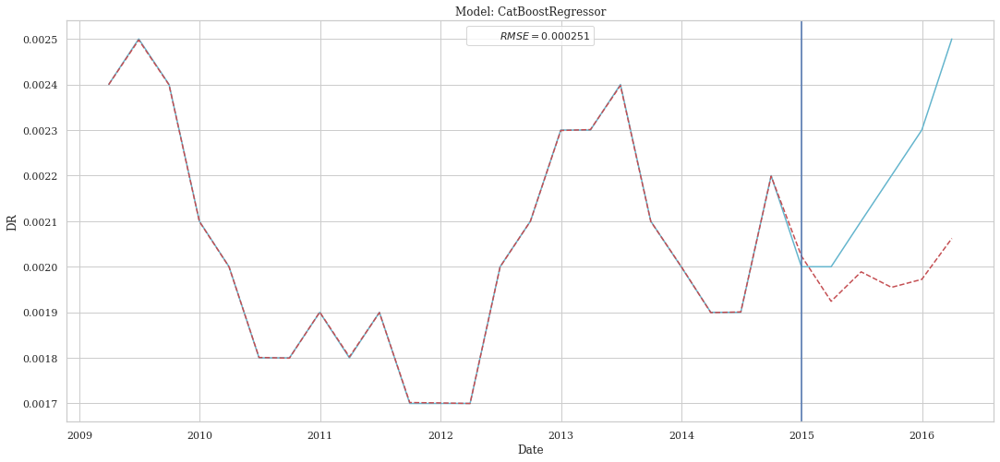

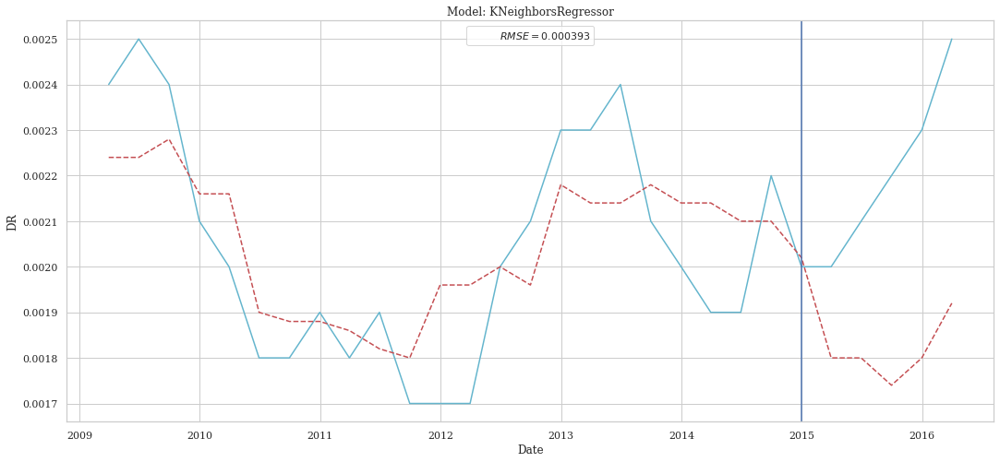

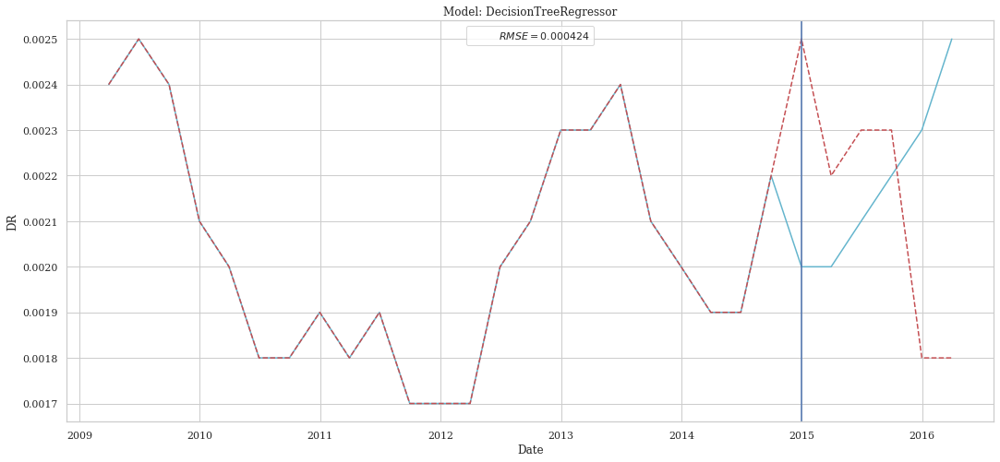

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


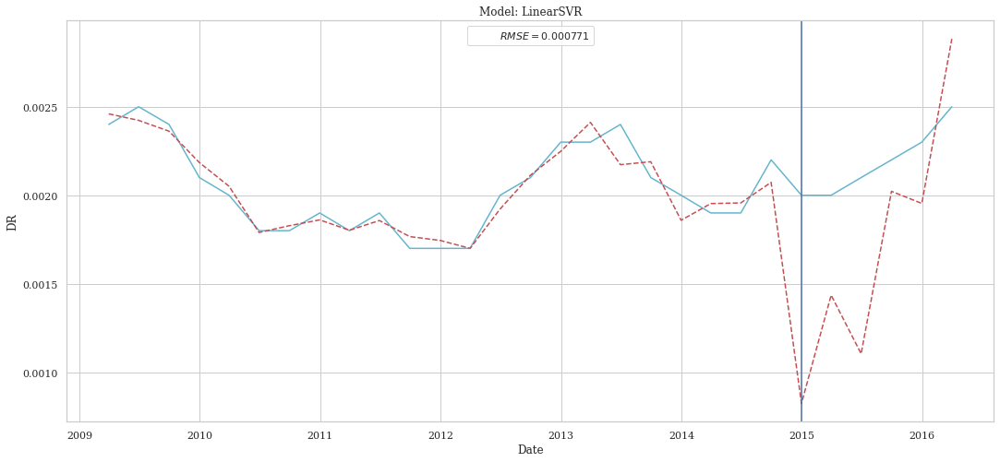

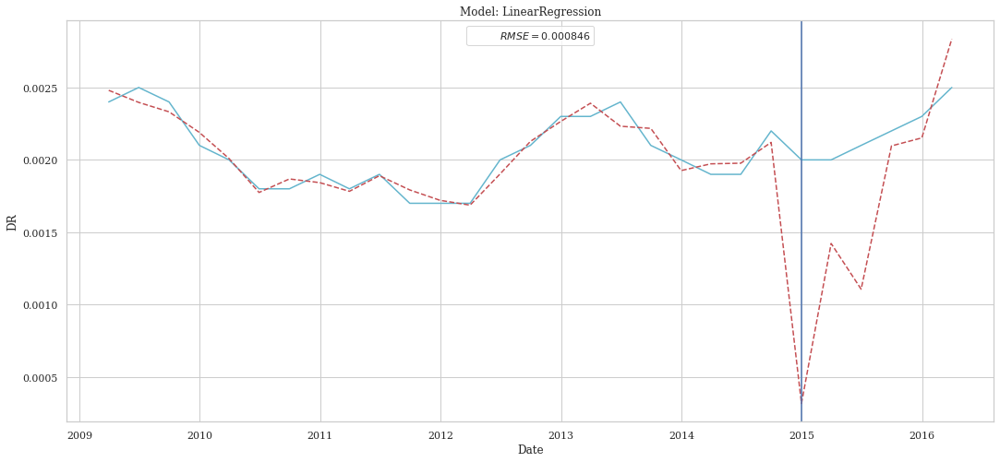

In [20]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [21]:
X_train, X_test, y_train, y_test,X_validation= clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000209,4.361684e-08,0.000174,-0.389563
KNeighborsRegressor,0.000226,5.086667e-08,0.000150,-0.620531
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
Ridge,0.000318,1.010679e-07,0.000282,-2.219863
DecisionTreeRegressor,0.000324,1.050000e-07,0.000283,-2.345133
LinearSVR,0.000588,3.461878e-07,0.000561,-10.028990
LinearRegression,0.000787,6.197635e-07,0.000764,-18.744678


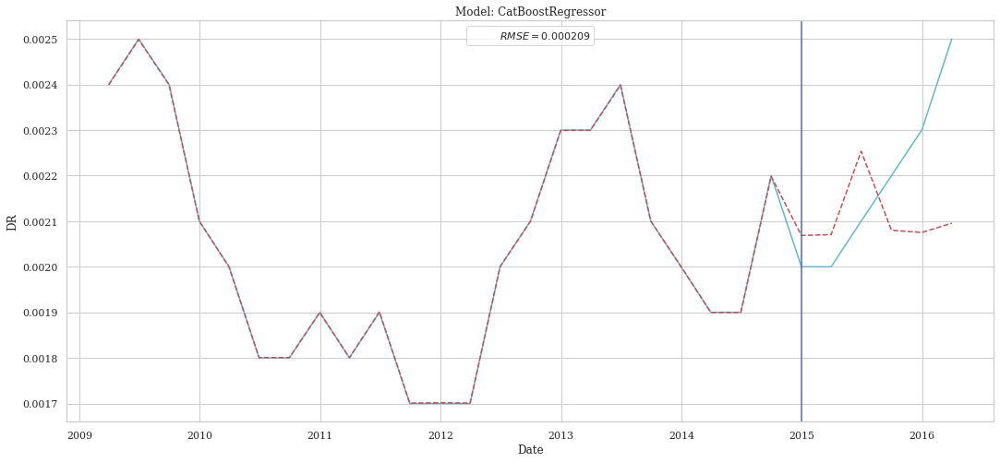

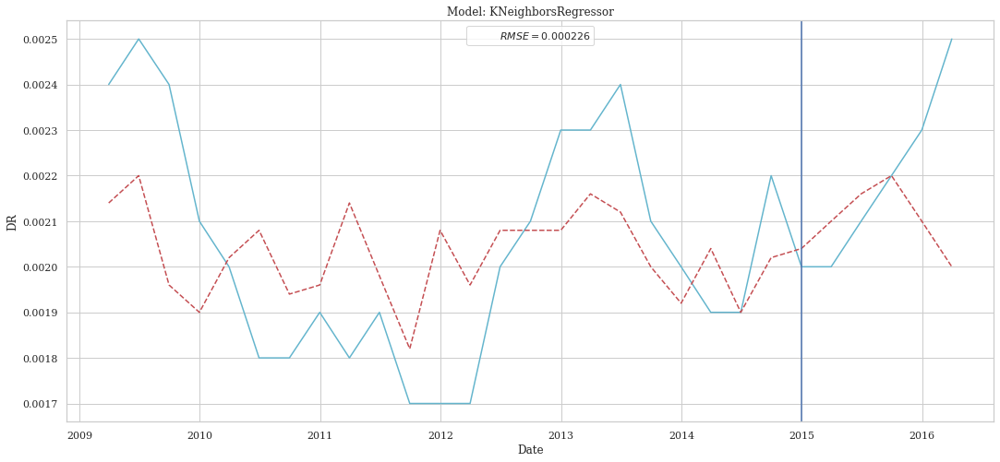

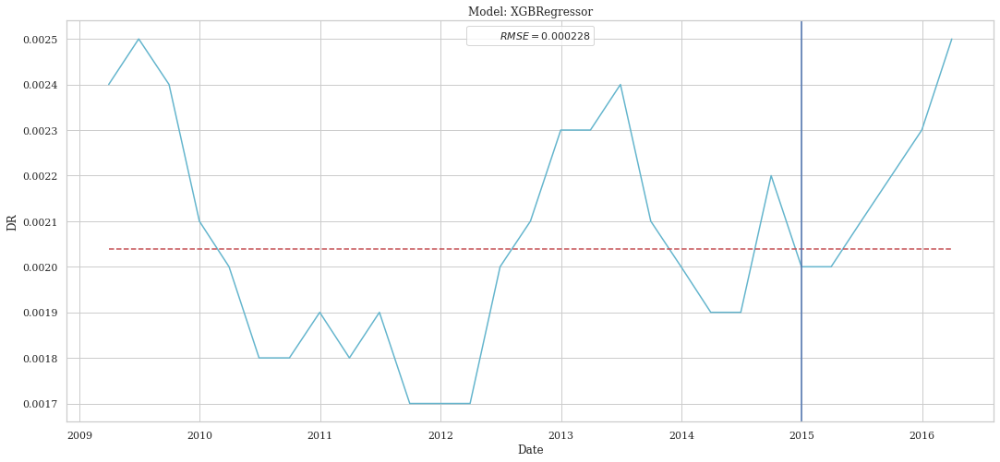

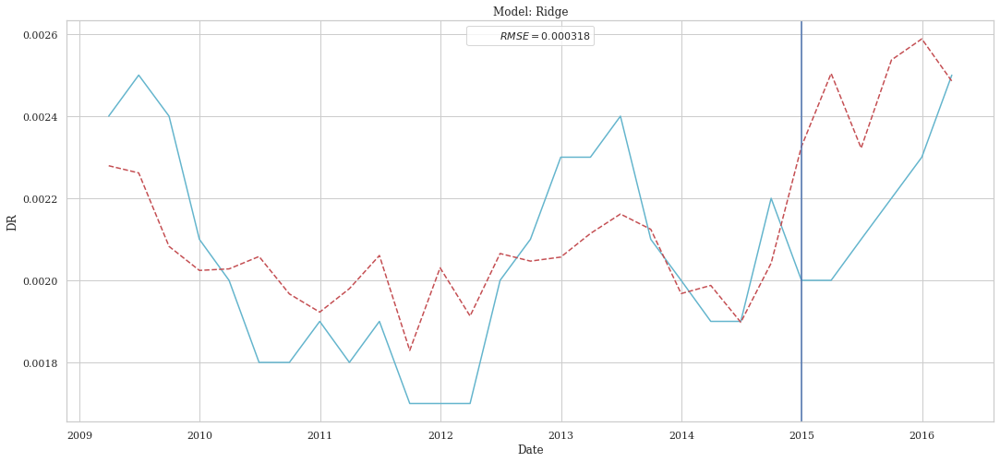

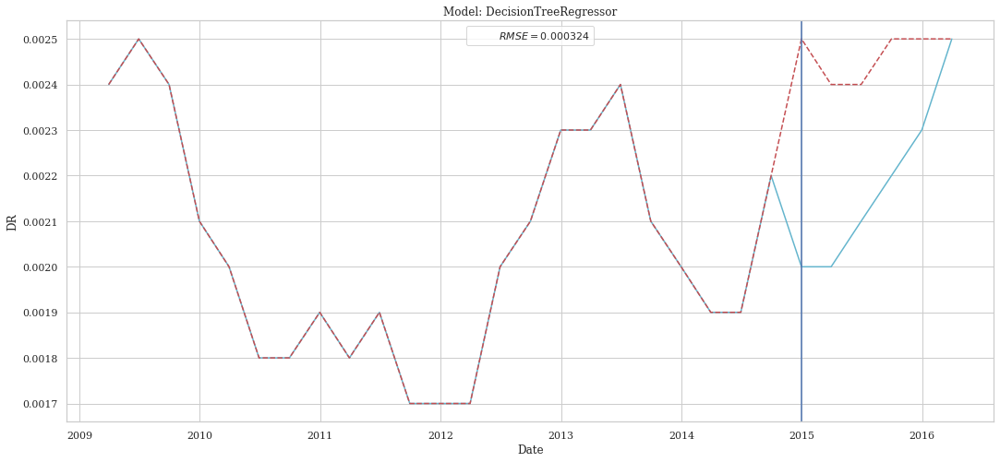

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


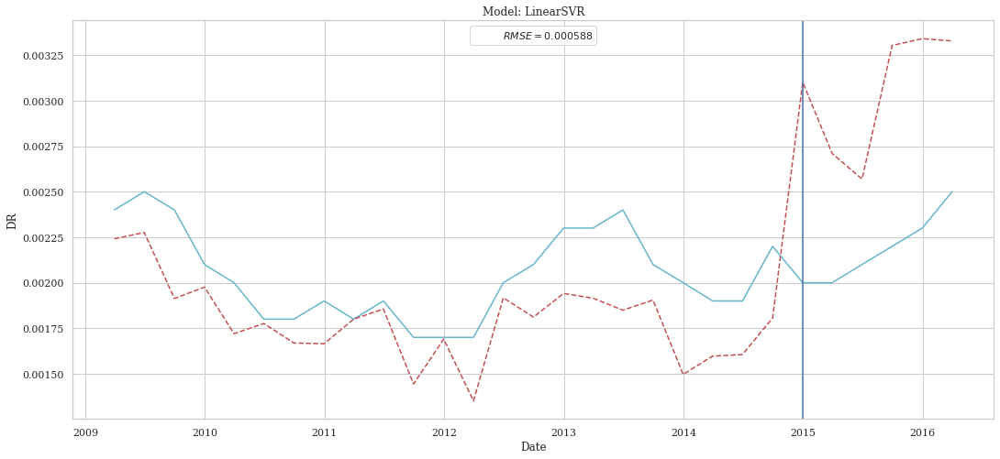

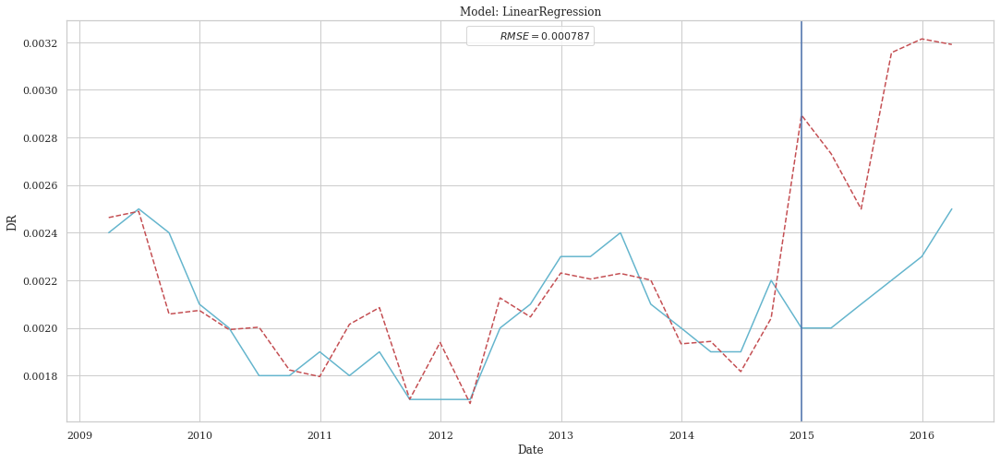

In [22]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [23]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000228,5.218327e-08,0.000170,-0.662476
CatBoostRegressor,0.000257,6.609357e-08,0.000221,-1.105636
DecisionTreeRegressor,0.000300,9.000000e-08,0.000267,-1.867257
KNeighborsRegressor,0.000302,9.140000e-08,0.000257,-1.911858
Ridge,0.000367,1.343911e-07,0.000302,-3.281486
LinearRegression,0.000454,2.059995e-07,0.000399,-5.562816
LinearSVR,0.000476,2.263716e-07,0.000370,-6.211838


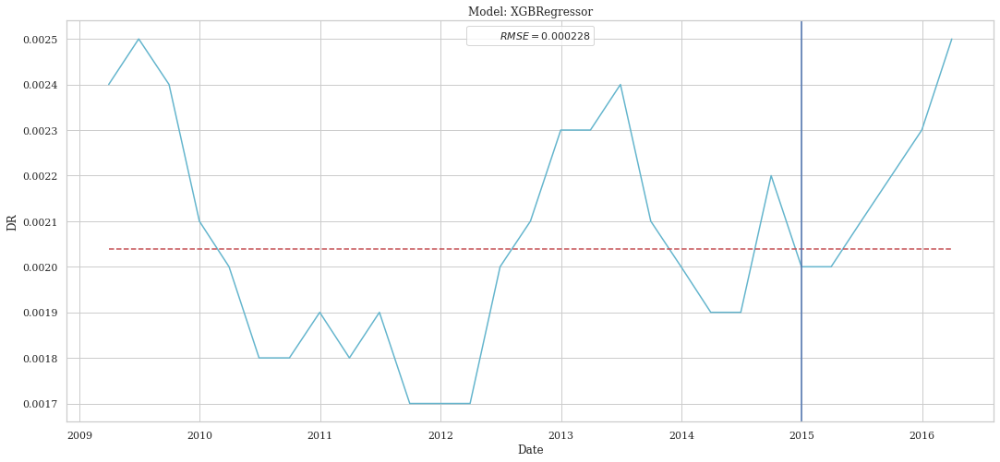

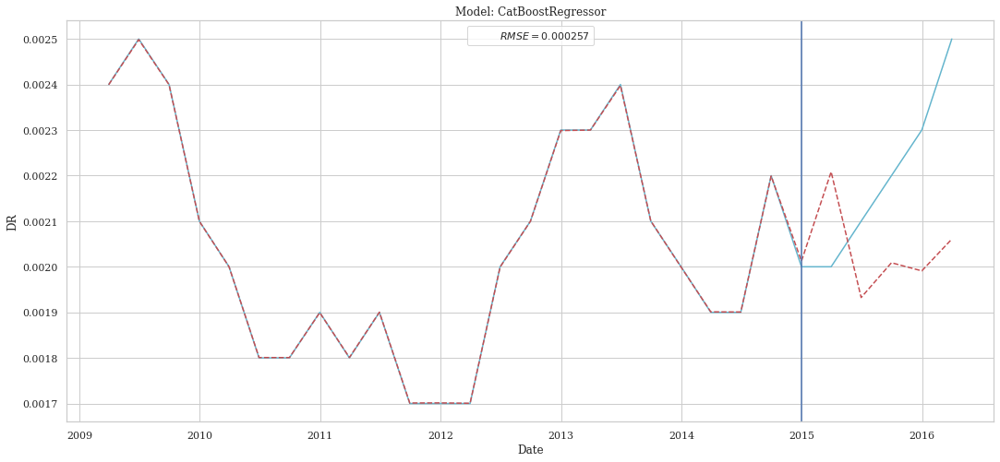

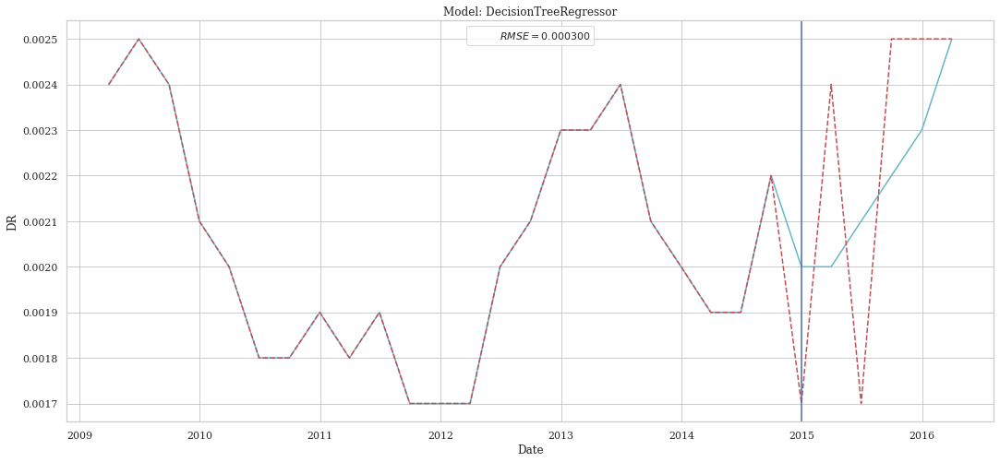

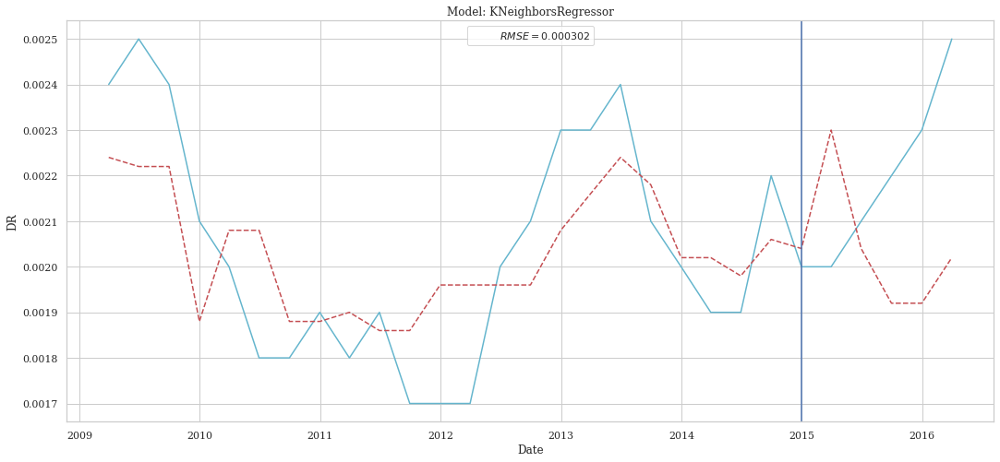

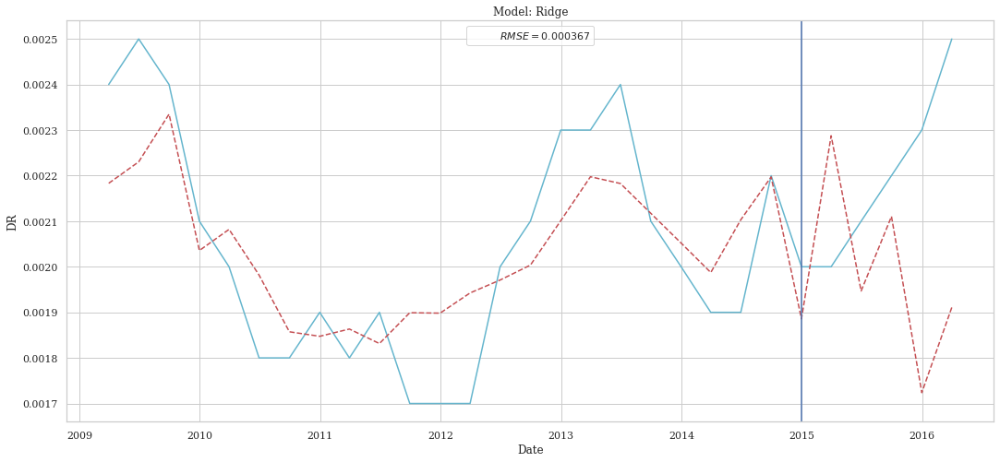

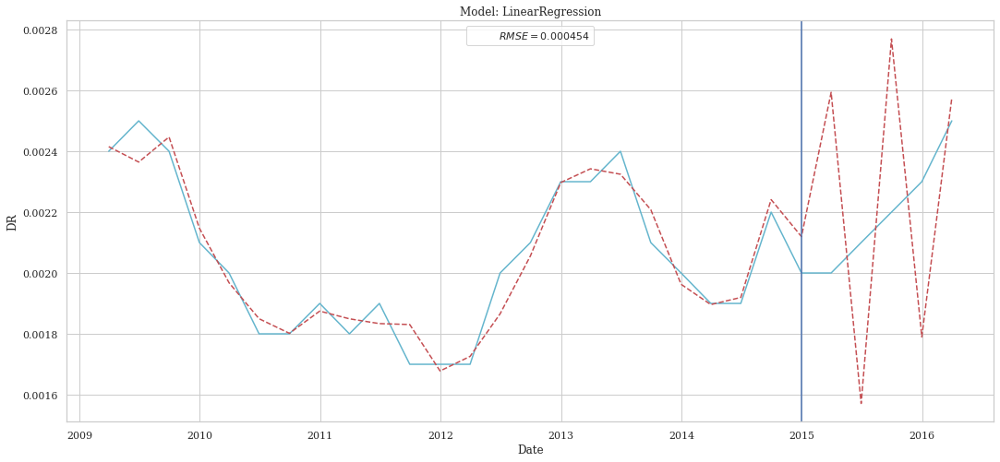

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


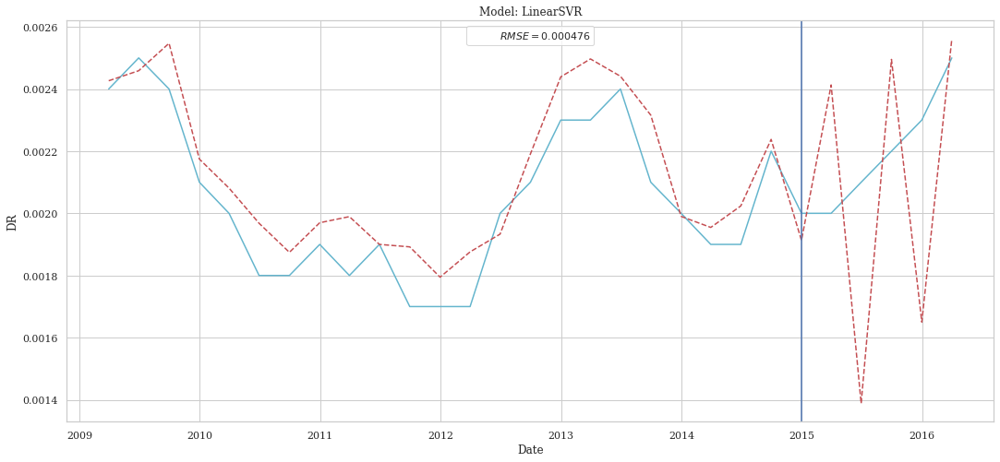

In [24]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Given a first point of view we see that the ridge and catboost are the best models to predict CHR2 with 12 months shift.

### GridSearch on KNeighborsRegressor

In [34]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period,b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_knr = {"n_neighbors":[5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr)
print(params,score)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
{'algorithm': 'auto', 'leaf_size': 5, 'n_neighbors': 10, 'p': 1, 'weights': 'uniform'} 0.00028858851906015477


In [35]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.000289,8.328333e-08,0.000235,-1.653274


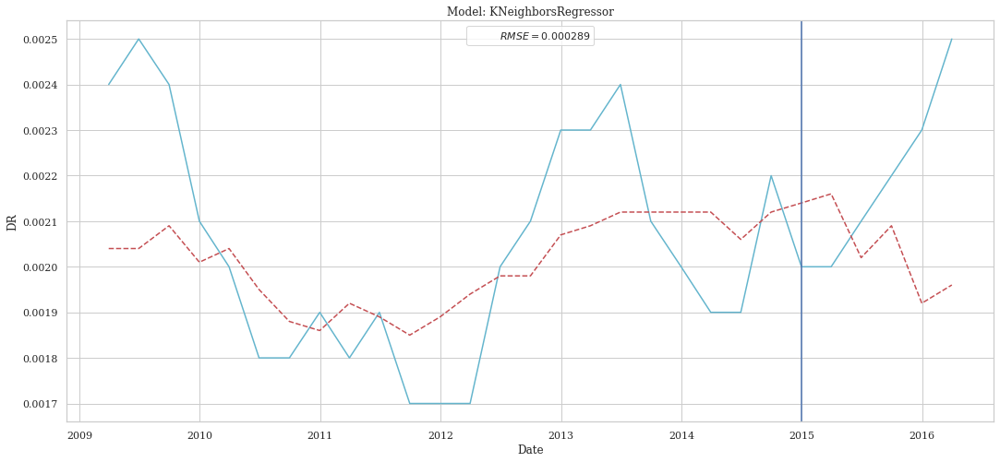

In [36]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on Ridge

In [28]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period,b"CHR8",col_used=cl.col_2_tree,split=split,norm=norm)
params_rid = {"alpha":[1],"fit_intercept":[True,False],"solver":["auto","svd","cholesky","lsqr","sparse_cg","sag","saga"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"rid",parameters=params_rid)
print(params,score)

Fitting 2 folds for each of 14 candidates, totalling 28 fits
{'alpha': 1, 'fit_intercept': True, 'solver': 'auto'} 0.013471914534331794


In [29]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["rid"],parameters={"p_rid":params})
summary

,rmse,mse,mae,r2
Index,,,,
Ridge,0.013472,0.000181,0.01243,-6.953607


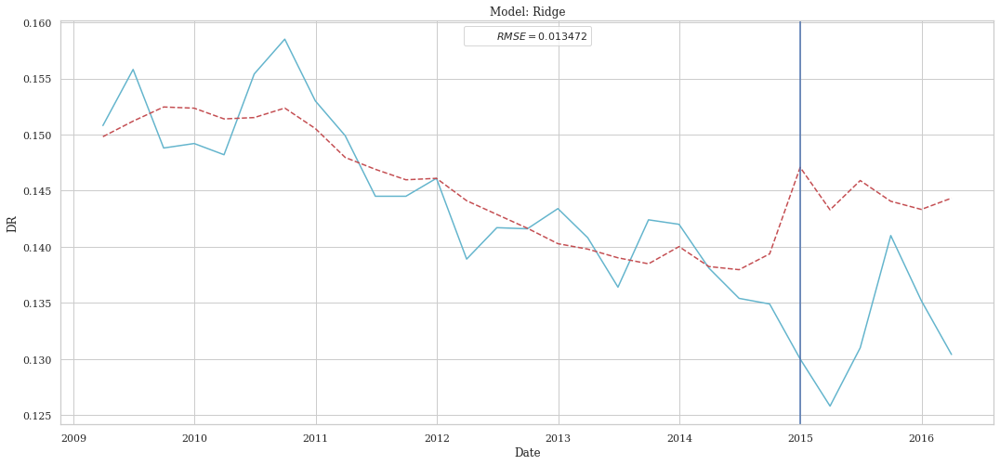

In [30]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on CatBoost

In [31]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period,b"CHR2",col_used=cl.col_2_kbest,split=split,norm=norm)
params_cat = {'depth': [i for i in range(1,7)],'learning_rate':[0.01*i for i in range(25,60)],'iterations':[10*i for i in range(15,30)],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"cat",params_cat)
print(params,score)

Fitting 2 folds for each of 3150 candidates, totalling 6300 fits
{'depth': 4, 'iterations': 290, 'learning_rate': 0.34, 'verbose': 0} 0.0002461946958716312


In [32]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["cat"],parameters={"p_cat":params})
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000246,6.061183e-08,0.00021,-0.930996


ValueError: x and y must have same first dimension, but have shapes (28,) and (29,)

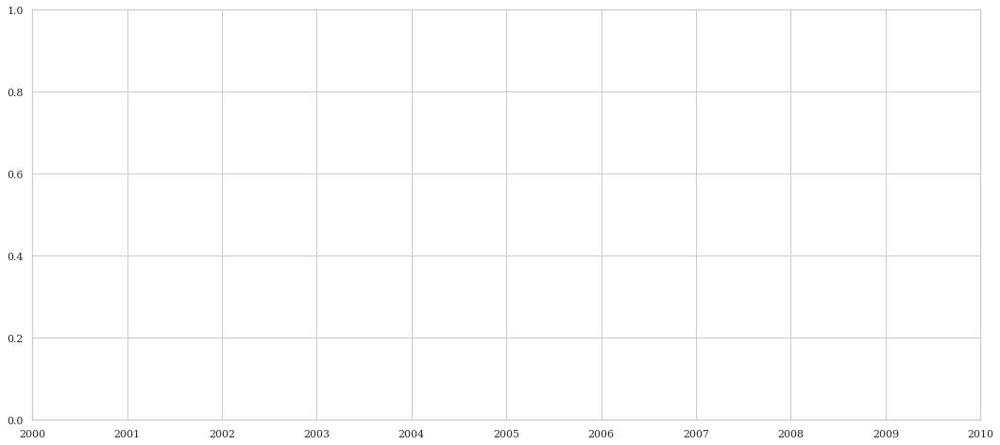

In [33]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_cat":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_cat":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

# Focus on the Chronique CHR8

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [ ]:
chronique=b'CHR8'
start = 1
period = 24
norm = "MinMax"
split = 0.2
# Useful to plot the model 
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train, X_test], axis=1).index

### Correlation Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
Custom logger is already specified. Specify more than one logger at same time is not thread safe.

,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.012674,0.000161,0.010900,-5.134288
CatBoostRegressor,0.012725,0.000162,0.012419,-5.183902
Ridge,0.013075,0.000171,0.012813,-5.529011
XGBRegressor,0.013352,0.000178,0.012633,-5.808070
KNeighborsRegressor,0.014756,0.000218,0.014560,-7.315343
LinearSVR,0.017872,0.000319,0.015939,-11.198181
LinearRegression,0.021605,0.000467,0.017567,-16.825334


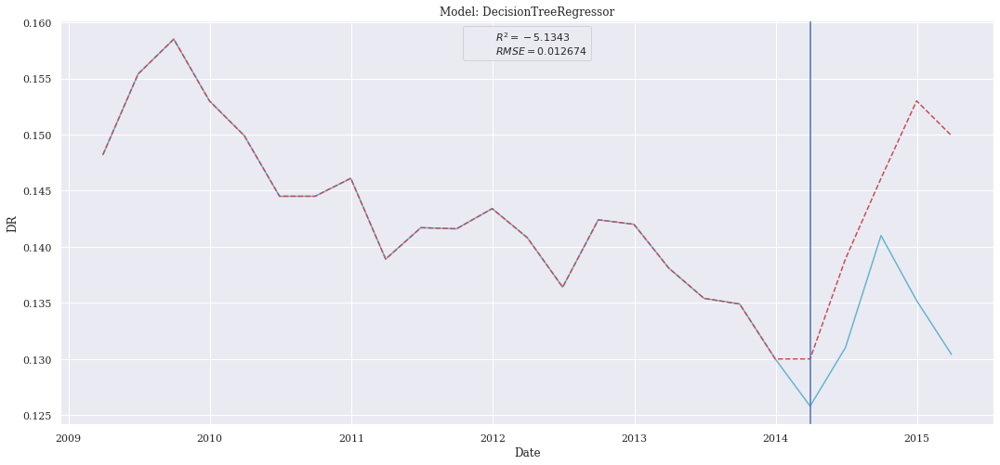

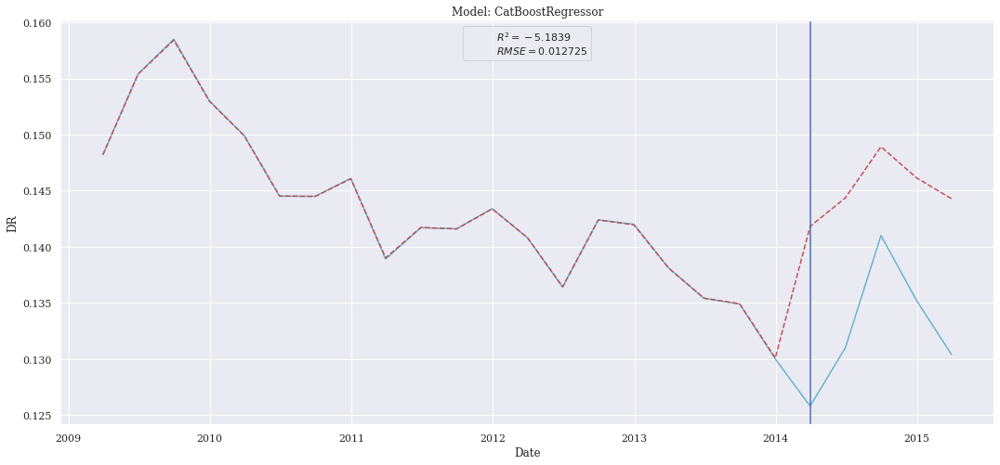

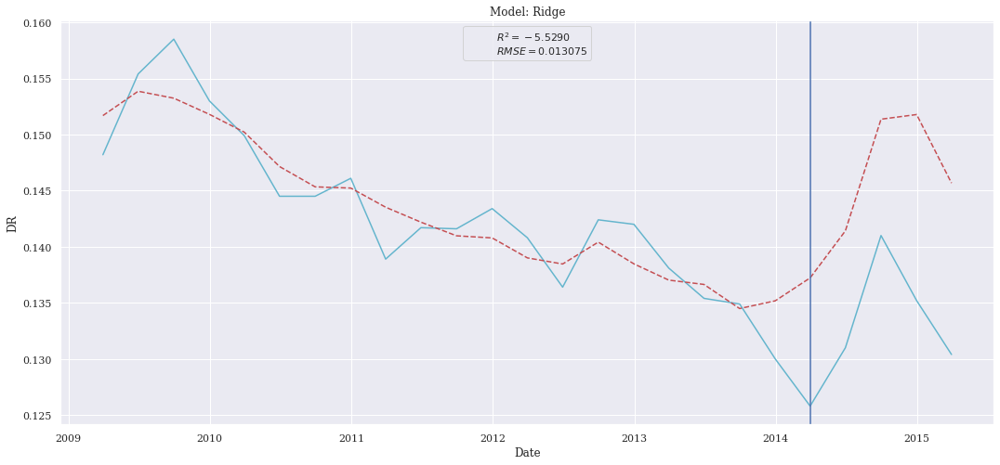

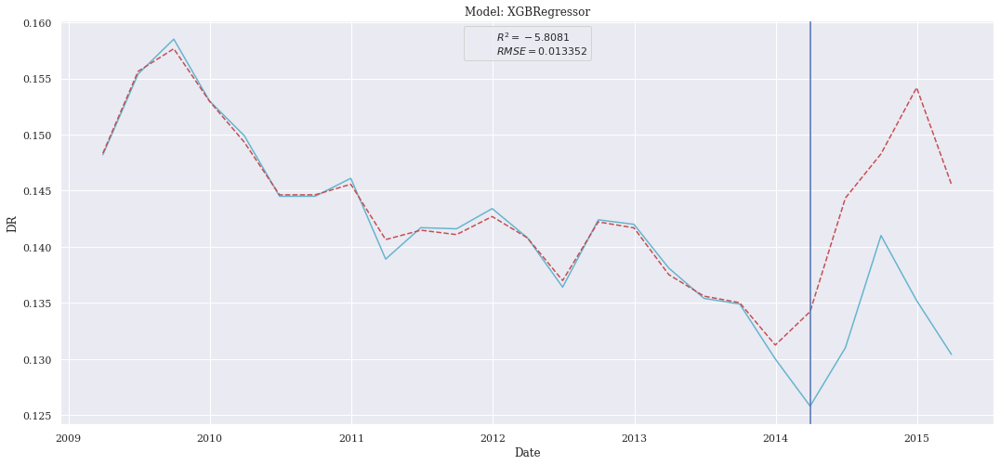

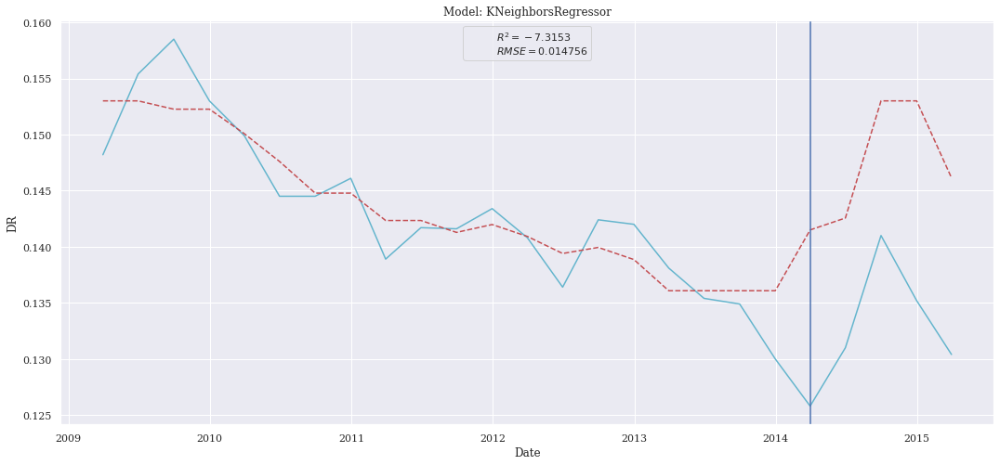

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


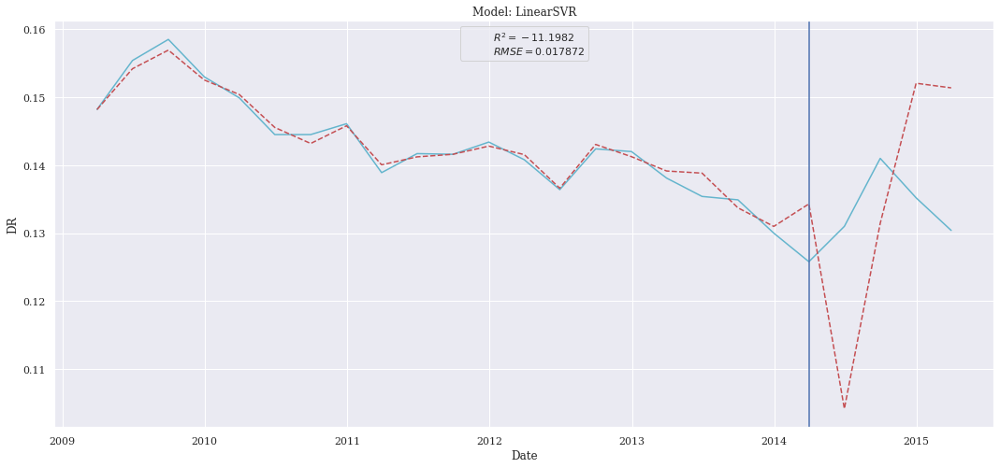

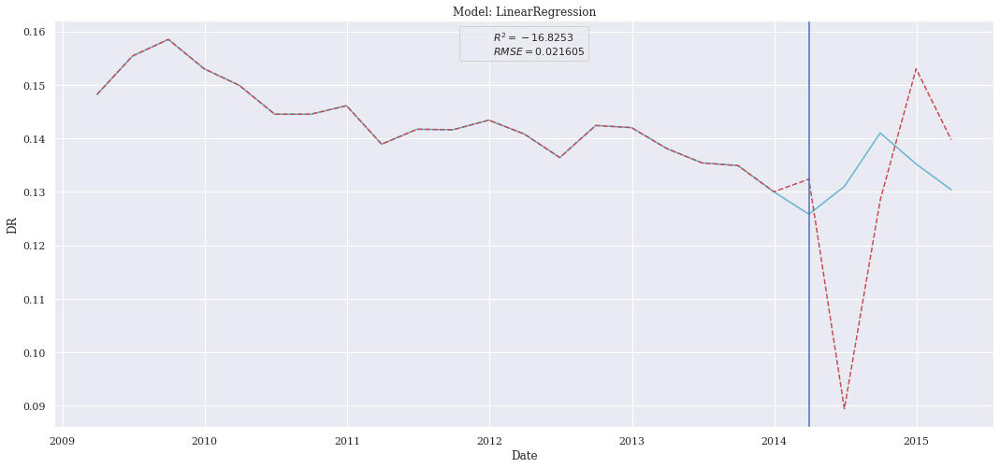

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.011405,0.000130,0.010990,-3.967228
CatBoostRegressor,0.011534,0.000133,0.010923,-4.080448
XGBRegressor,0.012054,0.000145,0.011172,-4.549256
KNeighborsRegressor,0.012441,0.000155,0.012208,-4.910766
LinearRegression,0.012551,0.000158,0.010642,-5.015982
DecisionTreeRegressor,0.016153,0.000261,0.014640,-8.963797
LinearSVR,0.025226,0.000636,0.021512,-23.301917


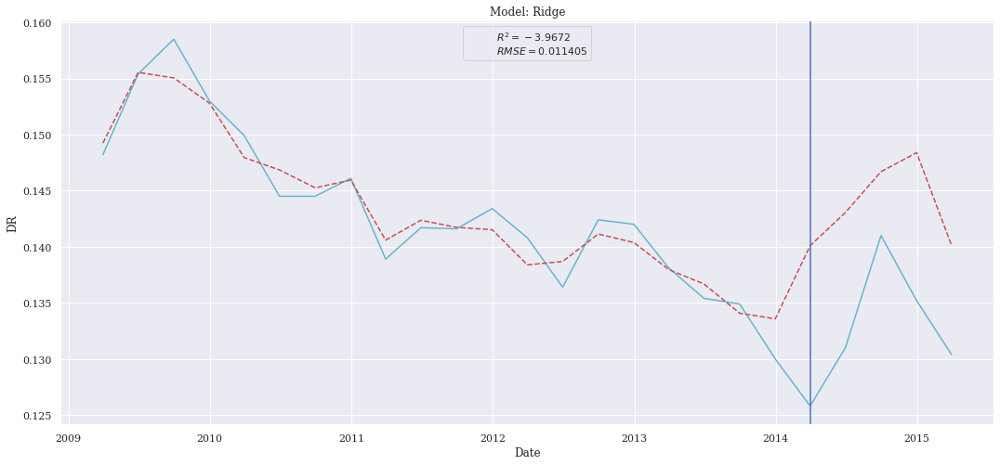

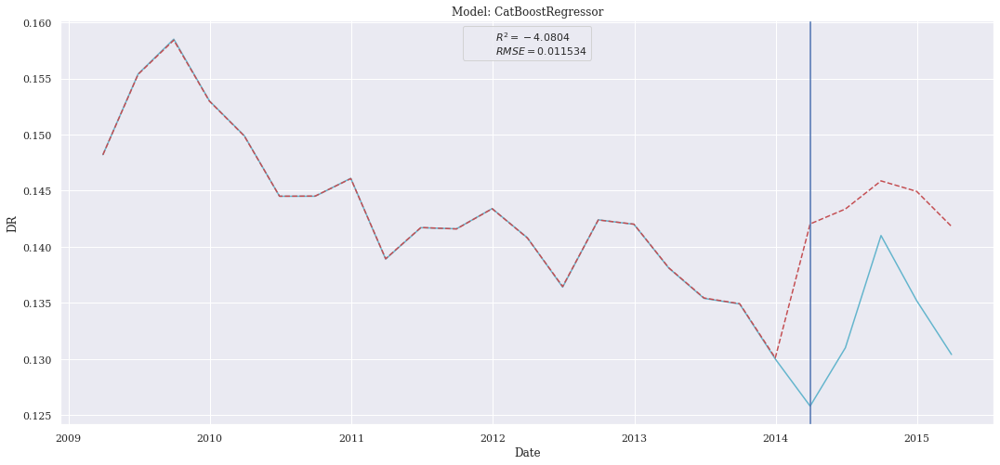

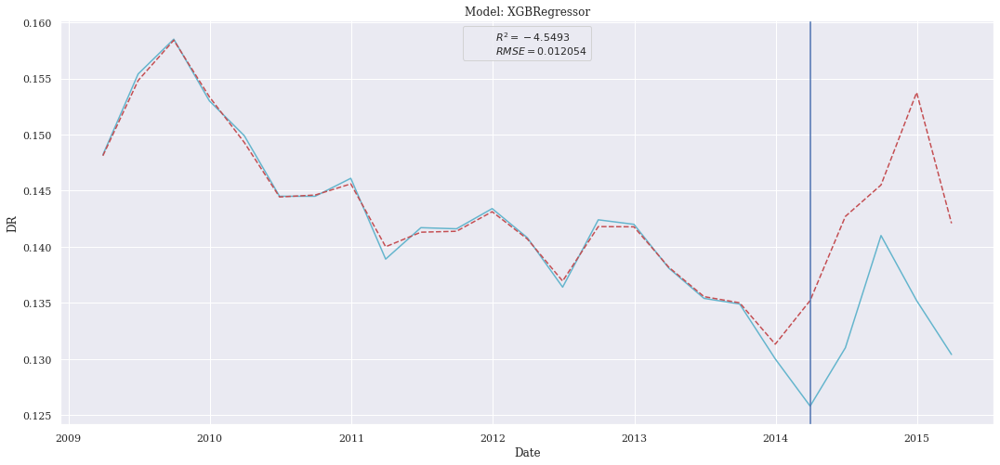

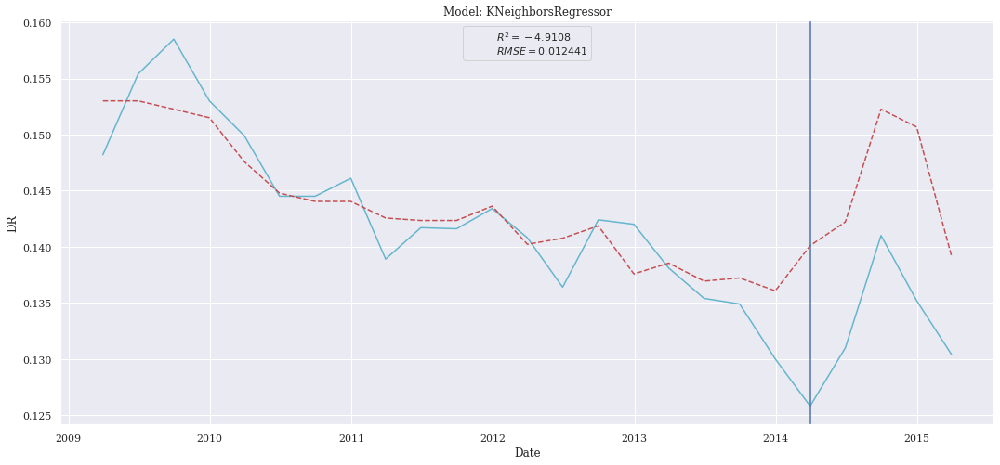

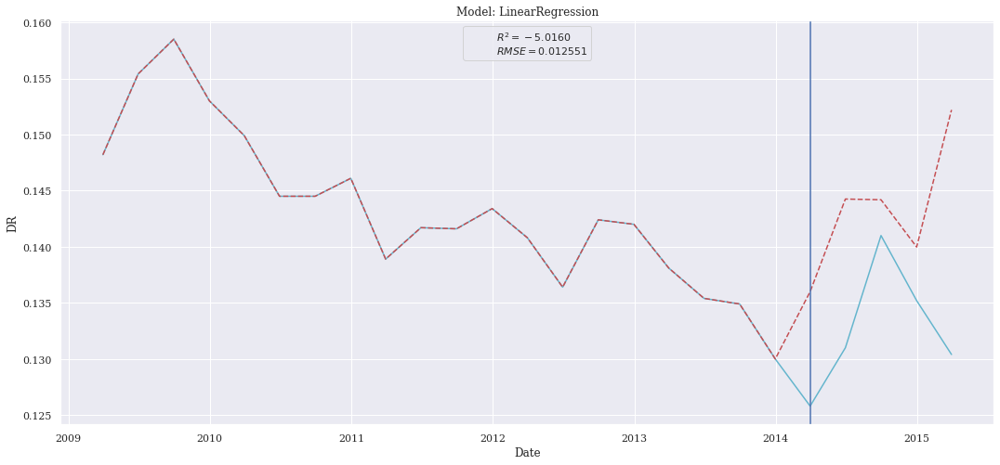

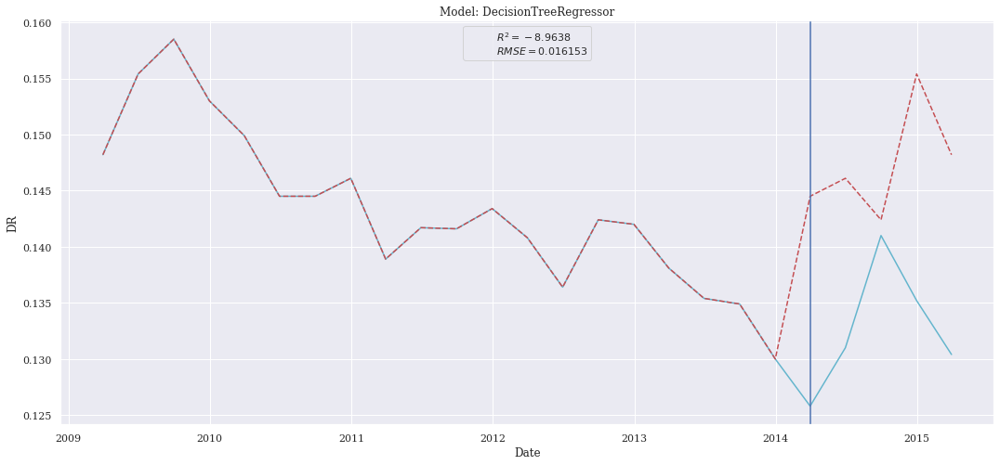

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


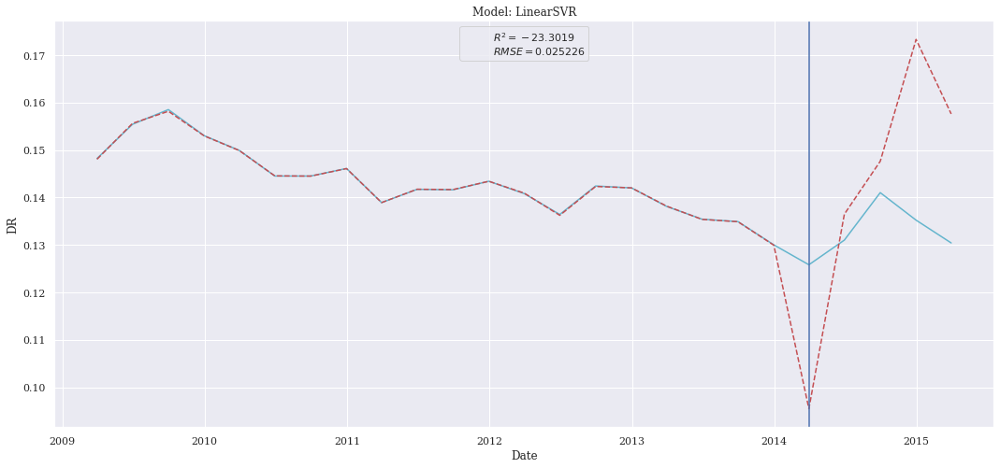

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.011969,0.000143,0.011733,-4.470700
KNeighborsRegressor,0.012555,0.000158,0.012448,-5.019339
Ridge,0.012603,0.000159,0.012476,-5.065871
XGBRegressor,0.013115,0.000172,0.012571,-5.568173
DecisionTreeRegressor,0.015851,0.000251,0.013760,-8.594739
LinearSVR,0.034338,0.001179,0.028214,-44.029529
LinearRegression,0.362649,0.131515,0.321023,-5021.403548


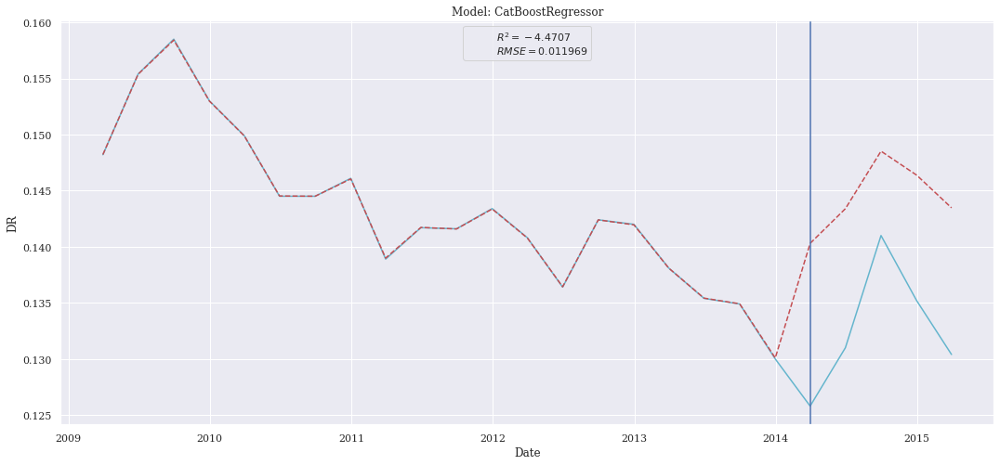

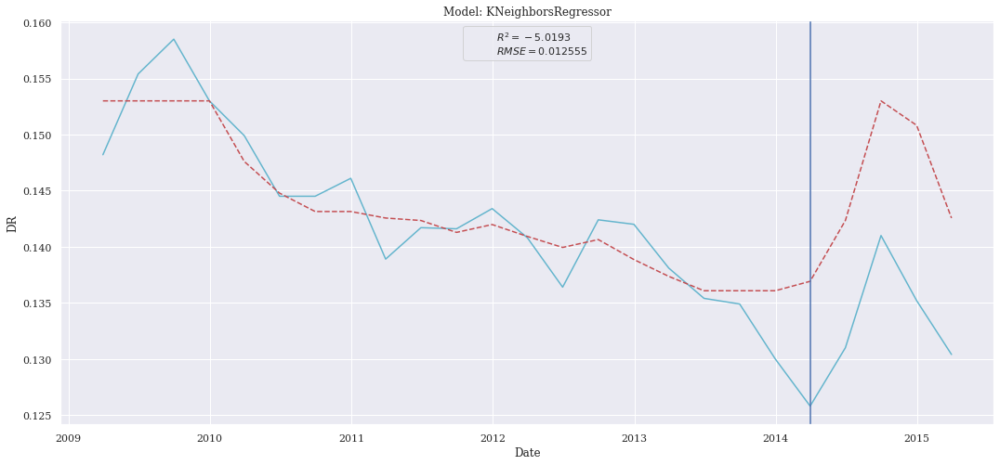

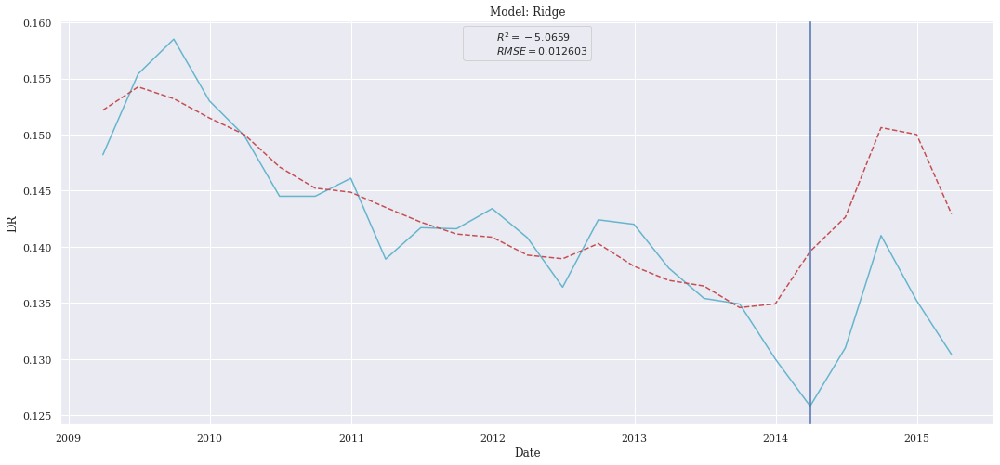

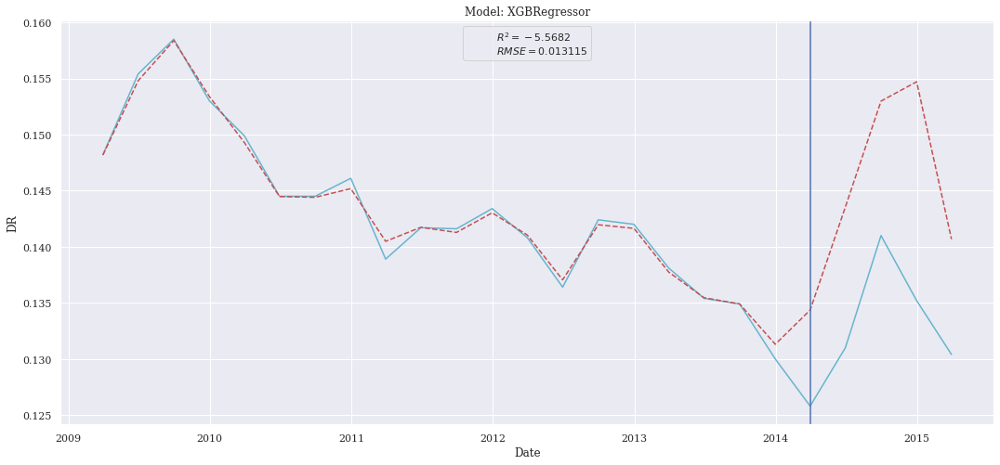

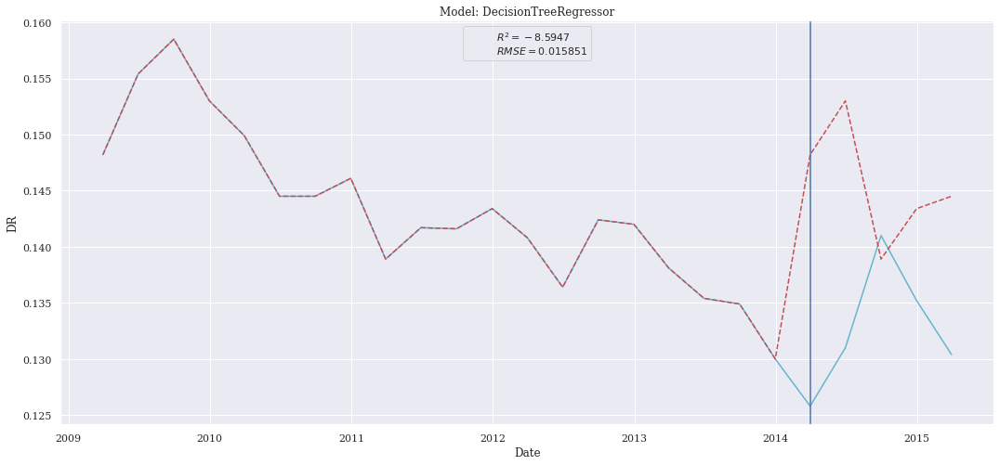

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


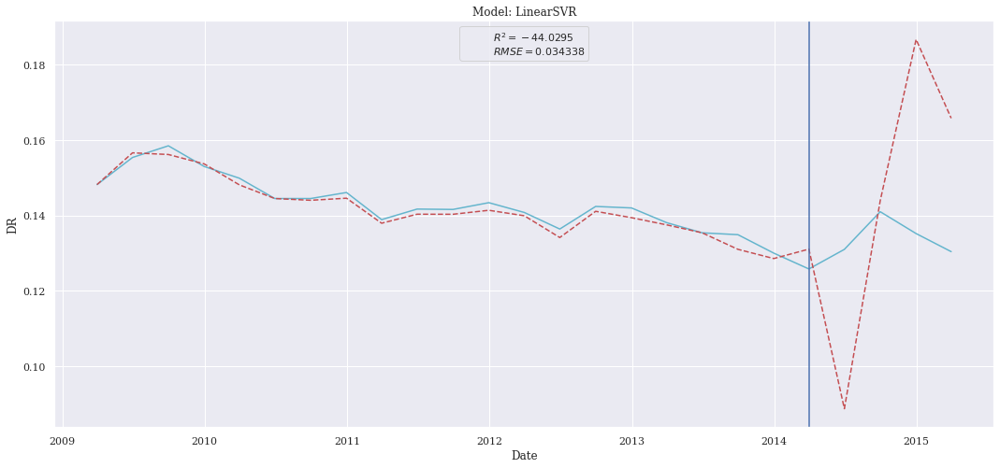

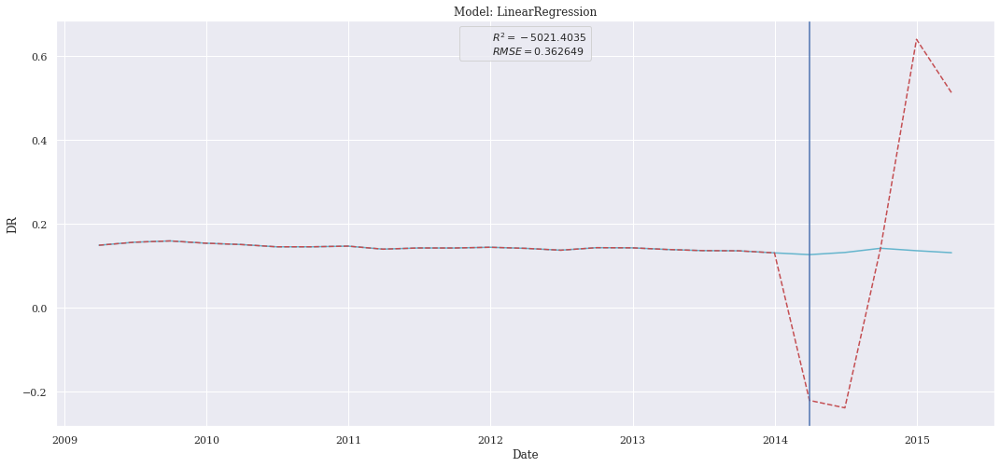

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.012745,0.000162,0.012100,-5.203209
XGBRegressor,0.012891,0.000166,0.012128,-5.346315
KNeighborsRegressor,0.014586,0.000213,0.014208,-7.124838
DecisionTreeRegressor,0.014588,0.000213,0.013340,-7.126680
LinearRegression,0.014616,0.000214,0.012997,-7.158711
Ridge,0.014871,0.000221,0.014499,-7.445100
LinearSVR,0.023932,0.000573,0.021441,-20.871904


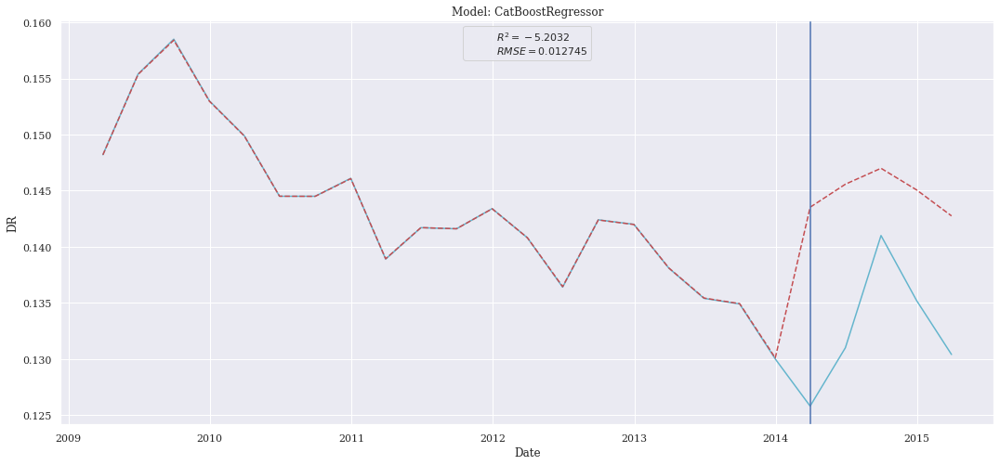

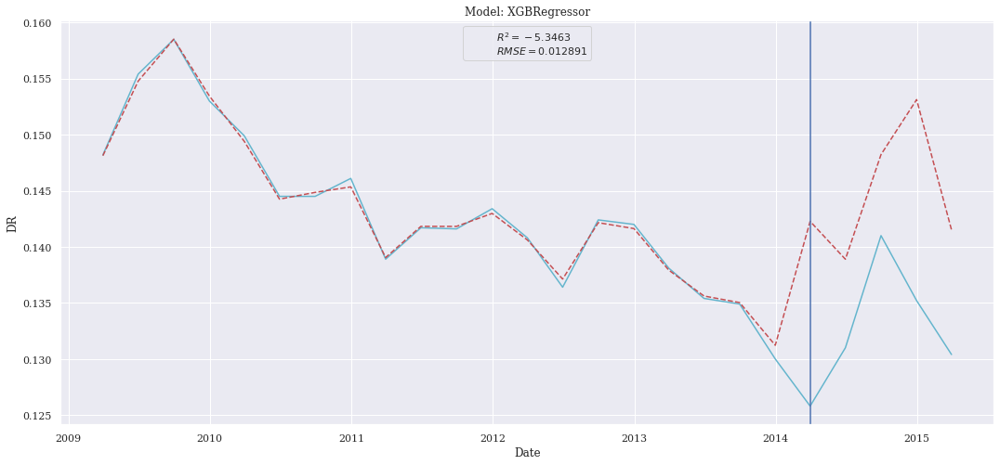

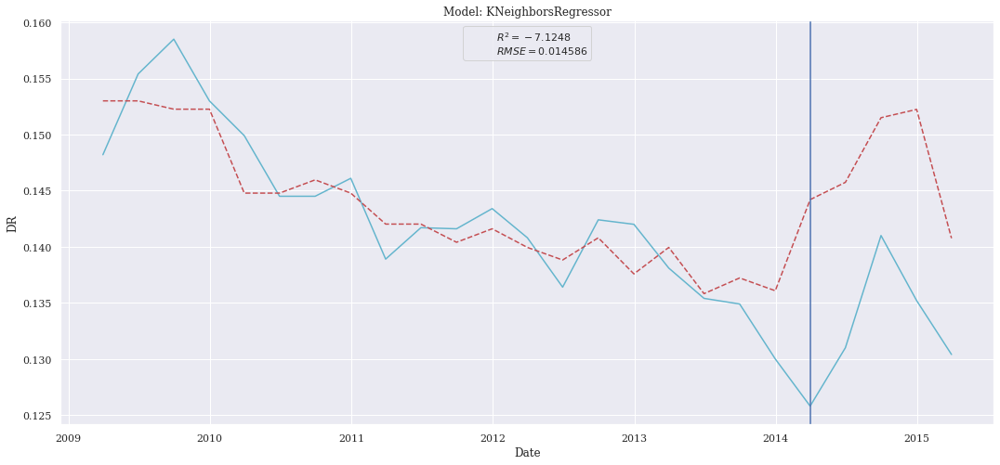

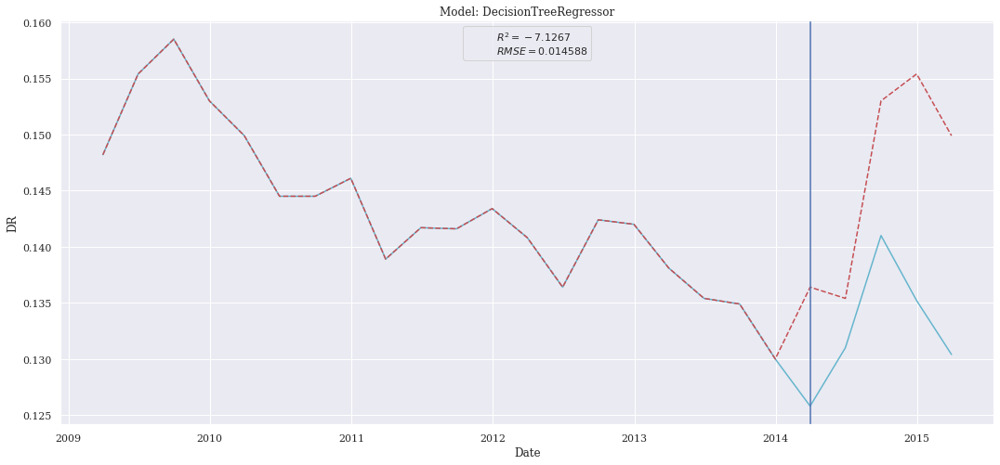

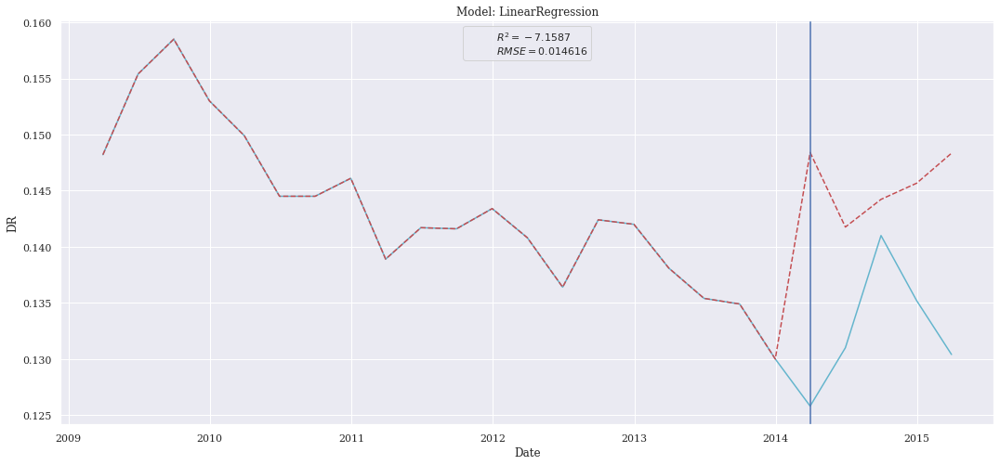

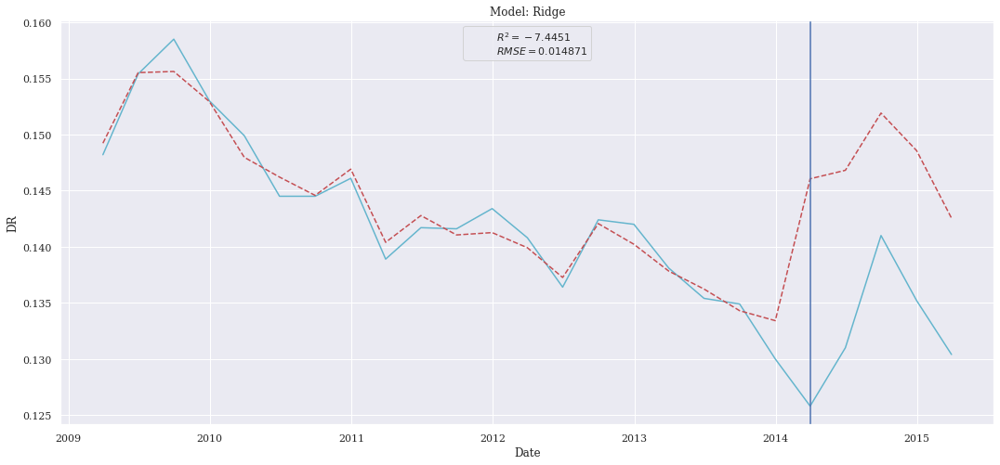

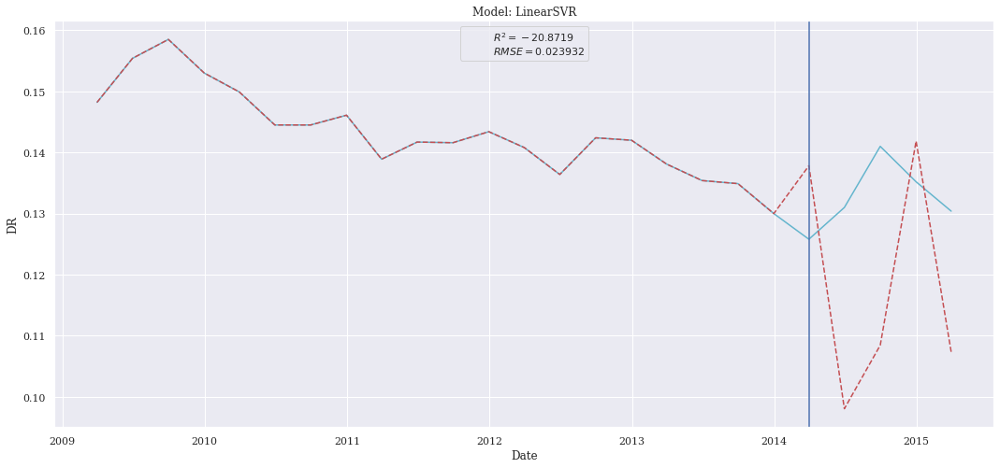

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.010833,0.000117,0.009615,-3.481401
CatBoostRegressor,0.011147,0.000124,0.010487,-3.745376
KNeighborsRegressor,0.011228,0.000126,0.011032,-3.814475
Ridge,0.012726,0.000162,0.012062,-5.184474
LinearSVR,0.013830,0.000191,0.013361,-6.304743
DecisionTreeRegressor,0.014275,0.000204,0.013220,-6.782369
LinearRegression,0.024543,0.000602,0.019484,-22.003438


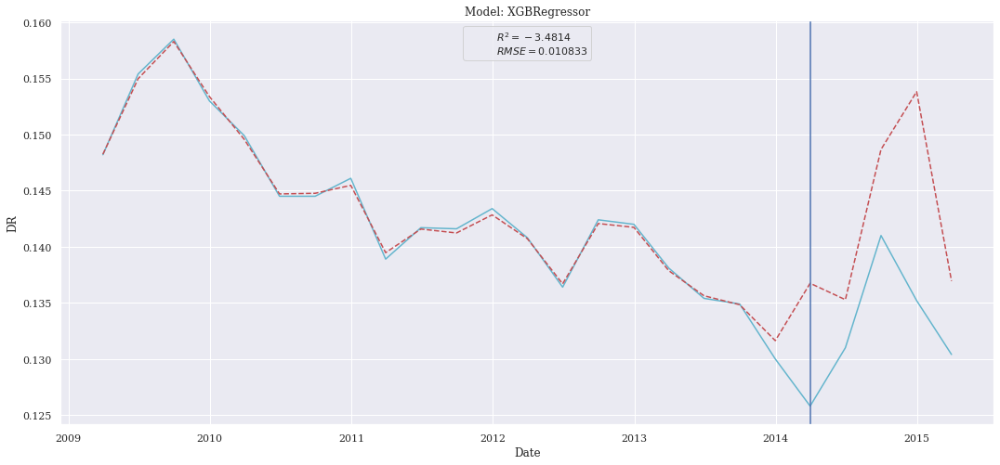

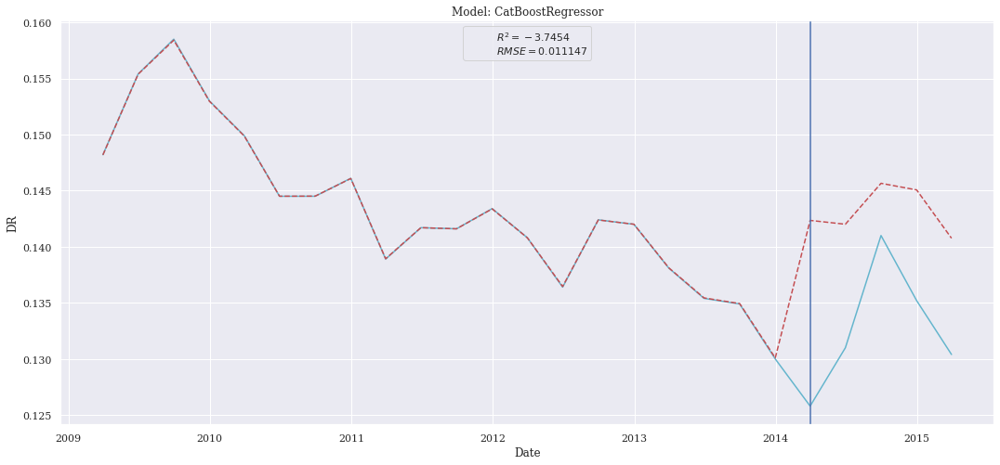

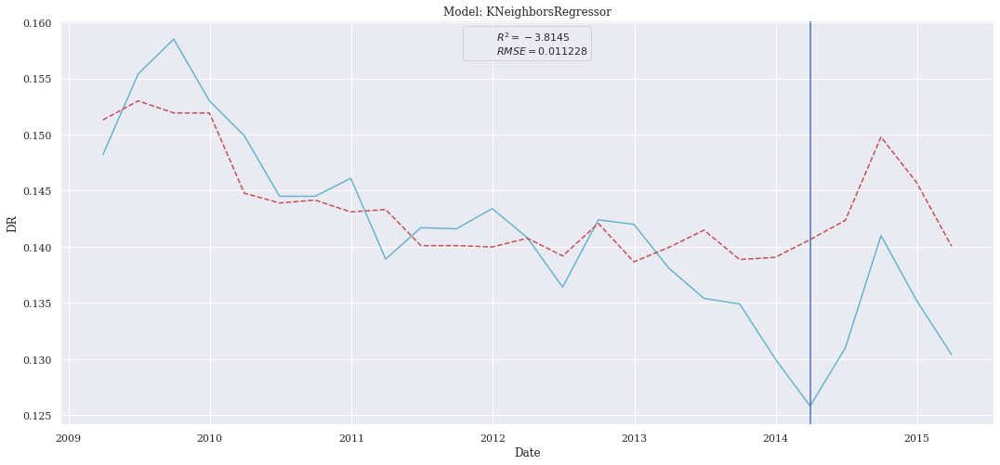

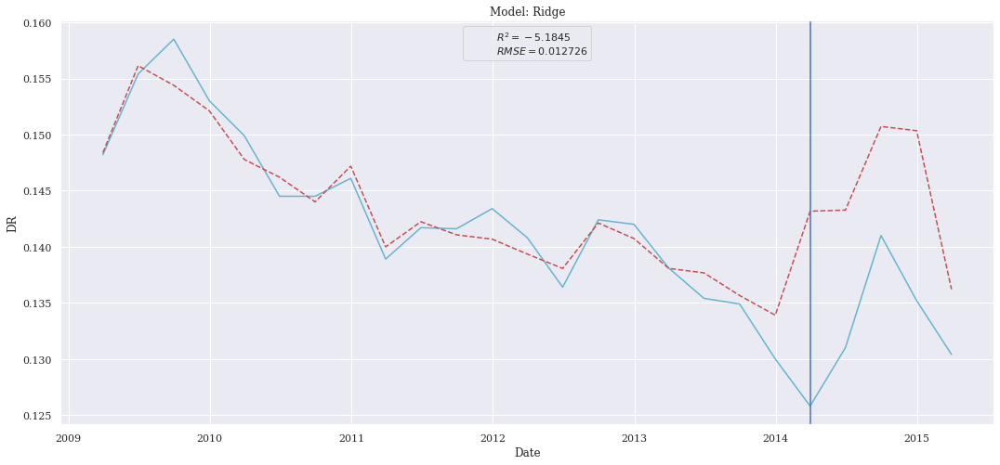

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


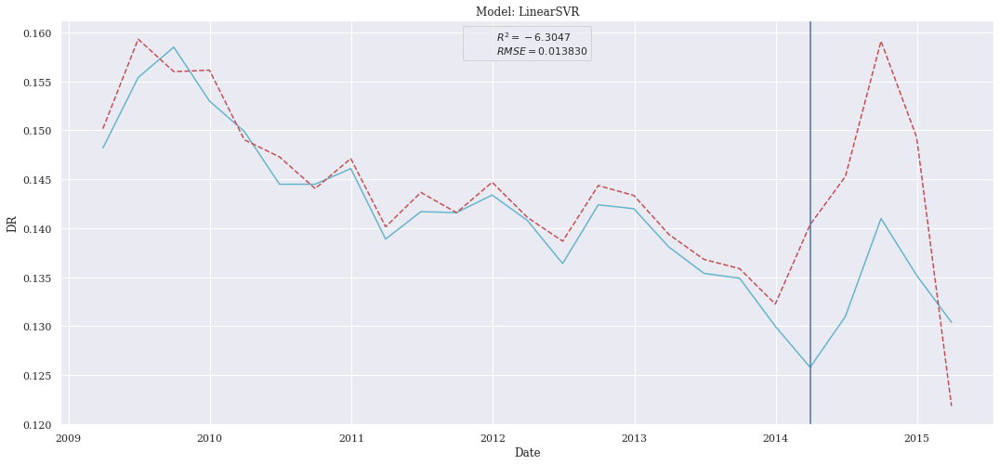

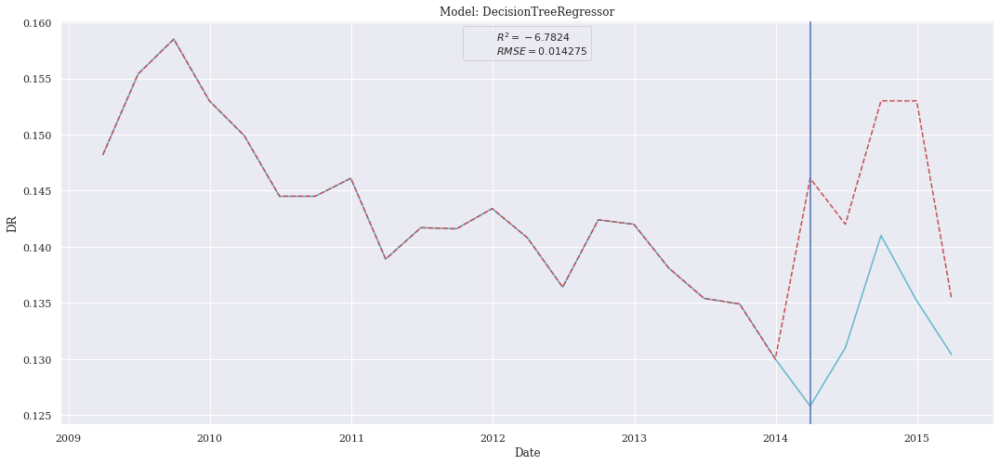

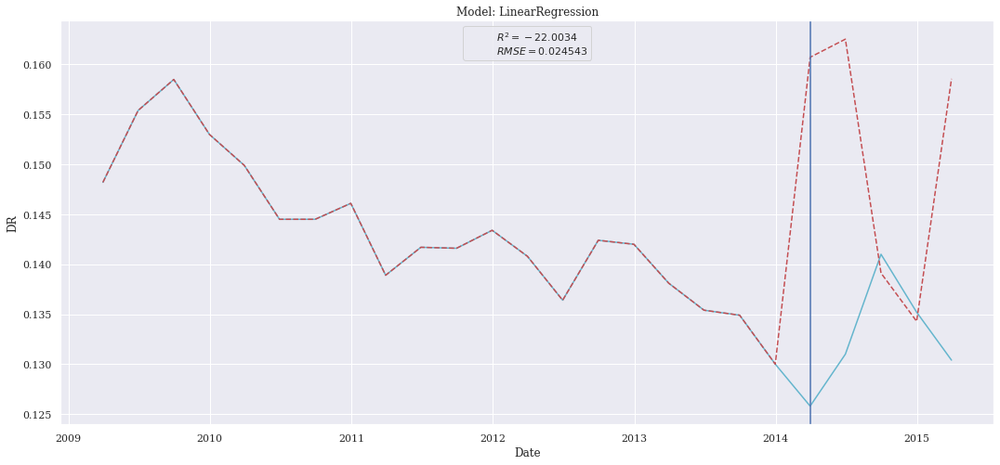

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.006331,0.000040,0.005958,-0.530829
CatBoostRegressor,0.012208,0.000149,0.011652,-4.691655
Ridge,0.012295,0.000151,0.012011,-4.772532
XGBRegressor,0.012894,0.000166,0.012258,-5.348982
LinearRegression,0.013728,0.000188,0.012543,-6.197044
DecisionTreeRegressor,0.013811,0.000191,0.012340,-6.284233
KNeighborsRegressor,0.014028,0.000197,0.013516,-6.514924


/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


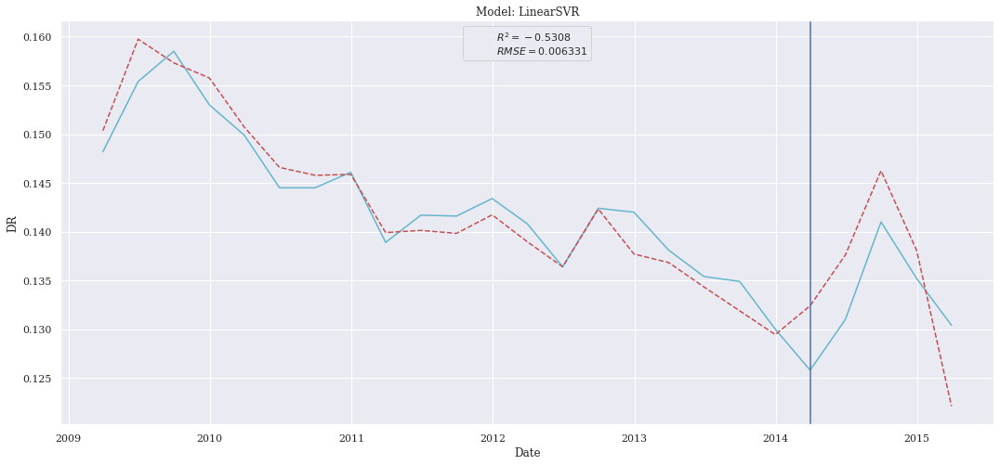

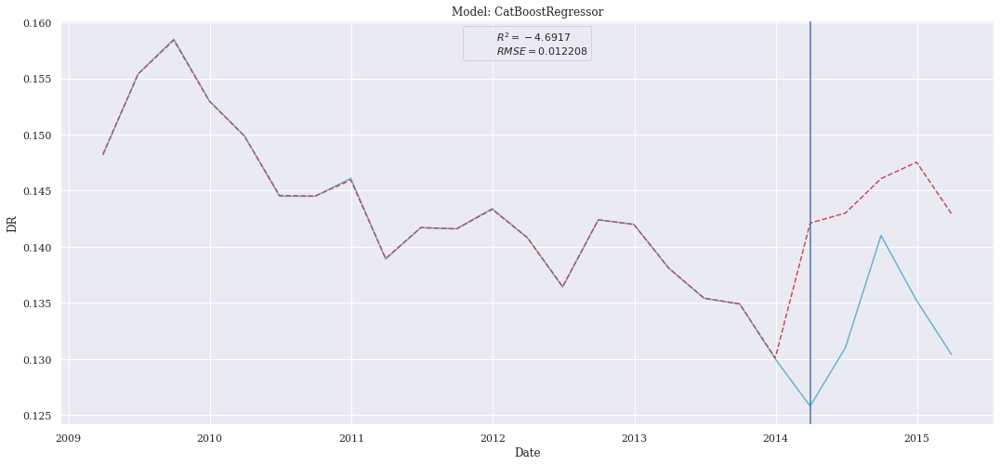

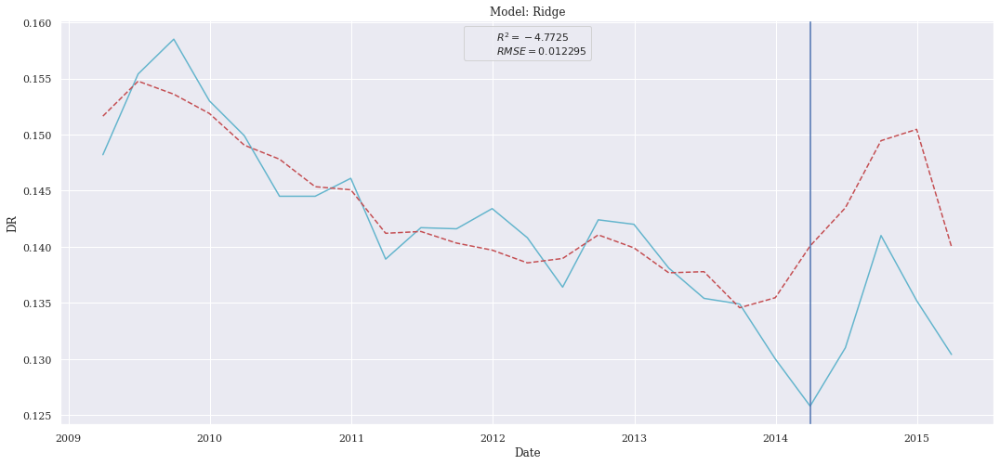

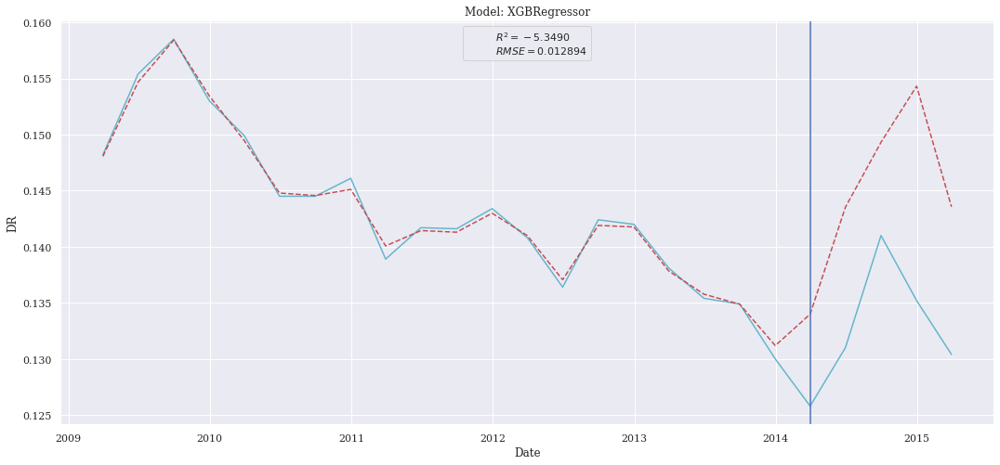

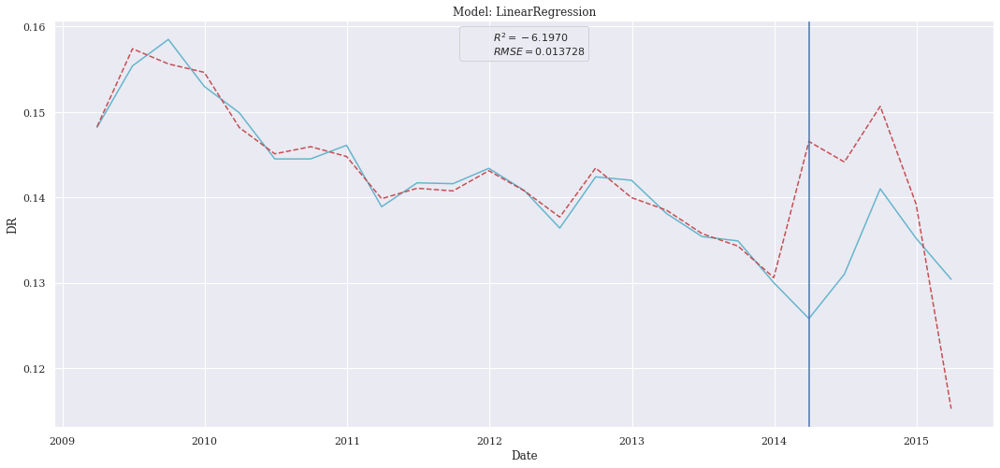

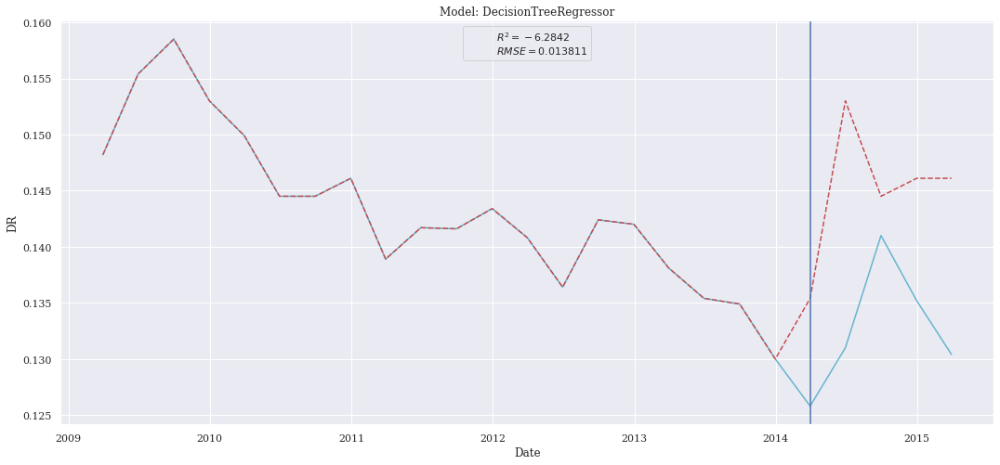

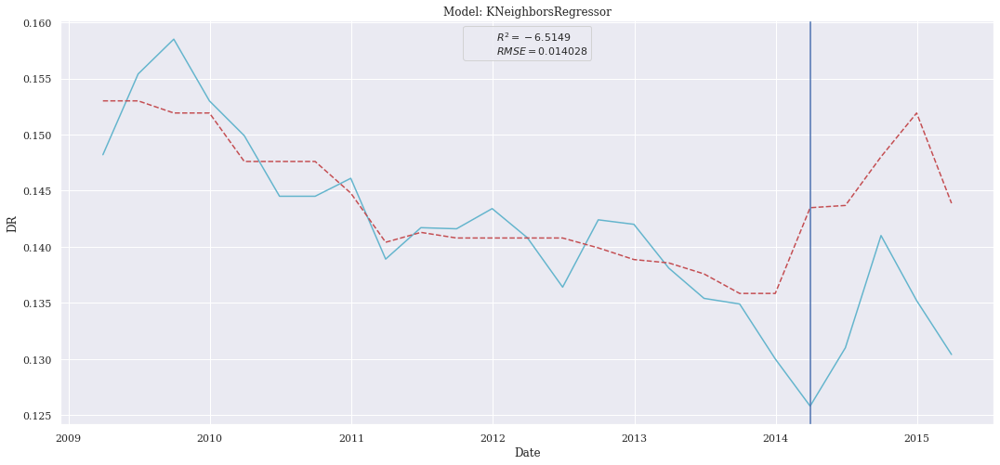

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.011381,0.000130,0.010740,-3.946612
CatBoostRegressor,0.012019,0.000144,0.011561,-4.516548
XGBRegressor,0.013520,0.000183,0.012468,-5.980429
Ridge,0.013571,0.000184,0.013329,-6.033741
KNeighborsRegressor,0.014790,0.000219,0.014096,-7.354063
LinearSVR,0.022616,0.000511,0.021415,-18.533594
LinearRegression,0.025185,0.000634,0.023577,-23.222385


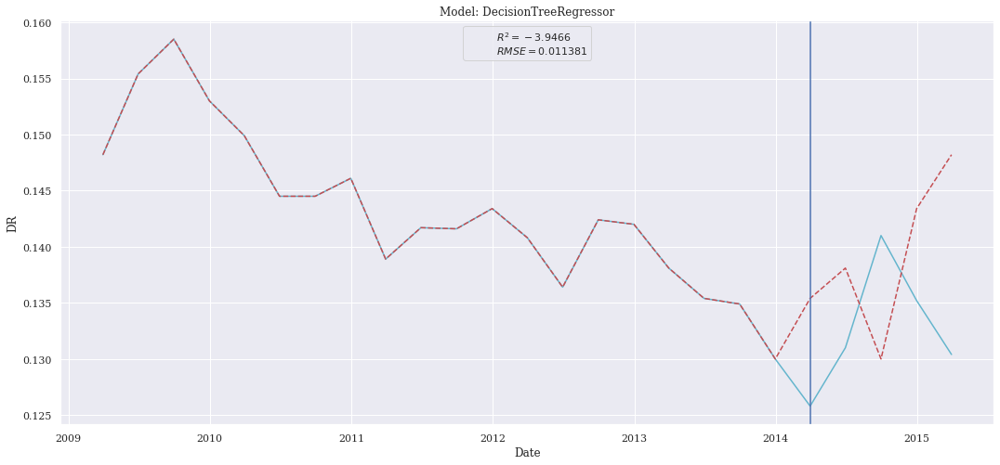

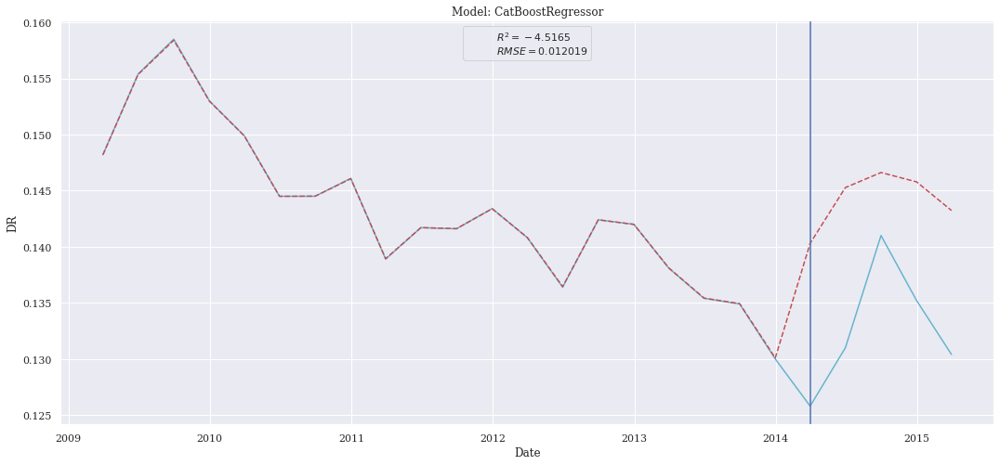

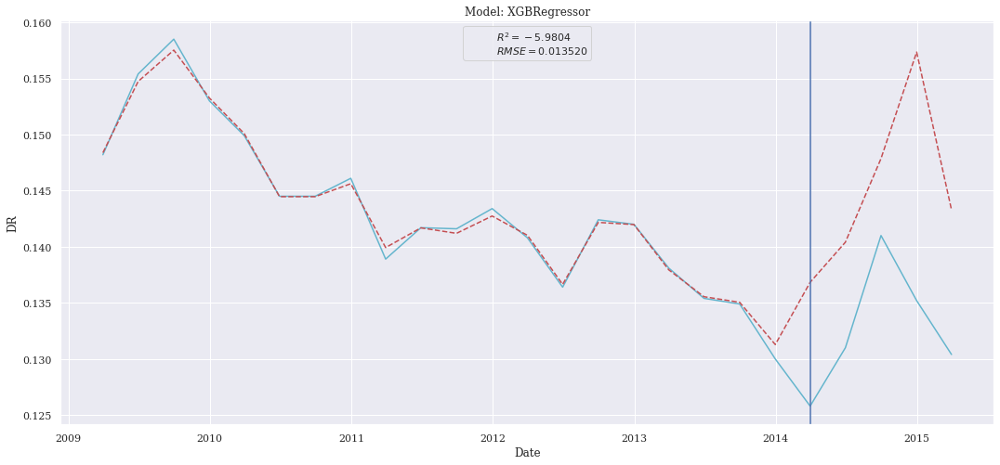

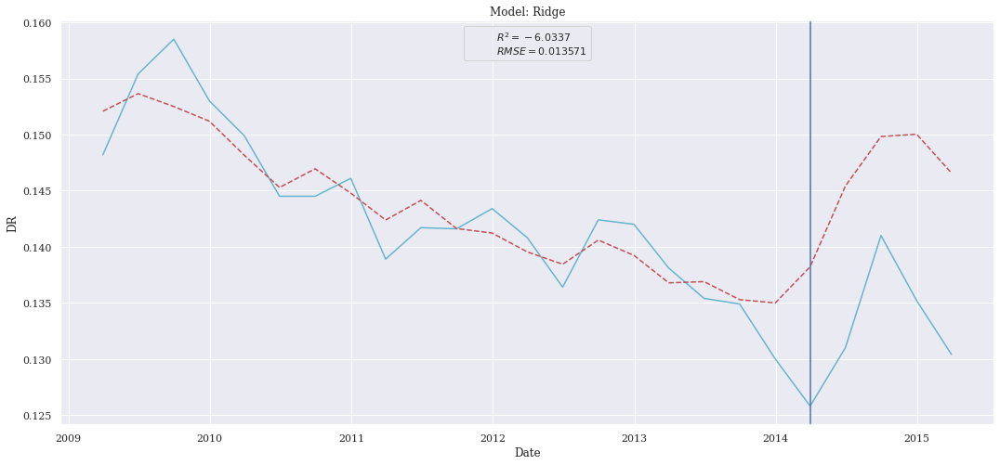

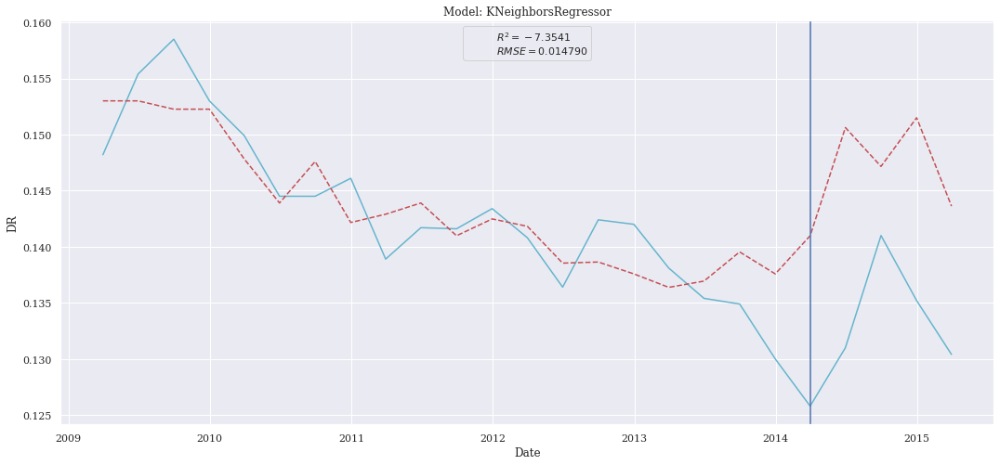

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


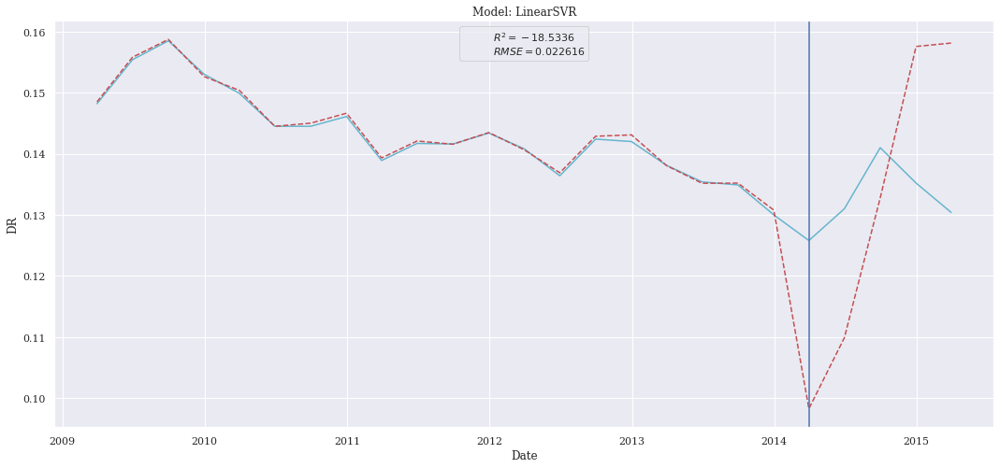

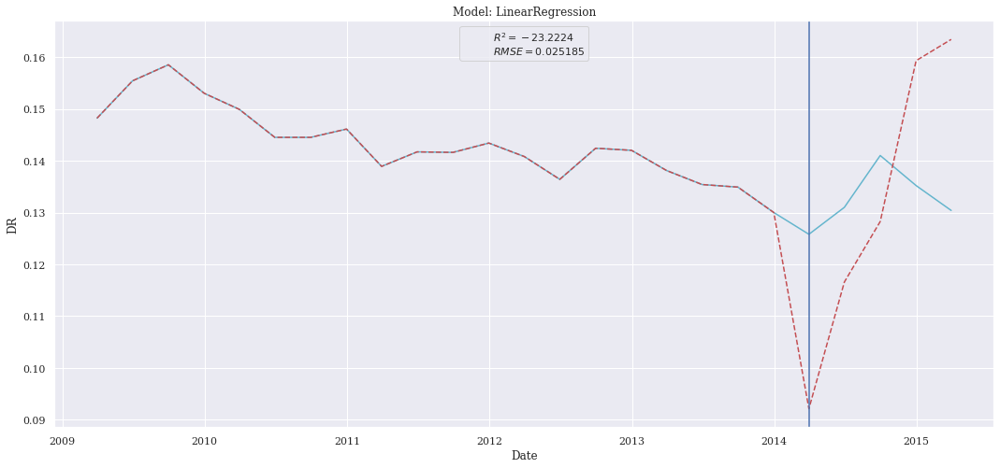

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.011099,0.000123,0.009691,-3.704108
Ridge,0.011565,0.000134,0.011039,-4.107726
CatBoostRegressor,0.011700,0.000137,0.011084,-4.227245
KNeighborsRegressor,0.012933,0.000167,0.012756,-5.387978
DecisionTreeRegressor,0.016286,0.000265,0.013740,-9.128697
LinearRegression,0.023958,0.000574,0.022571,-20.920597
LinearSVR,0.027886,0.000778,0.024445,-28.697581


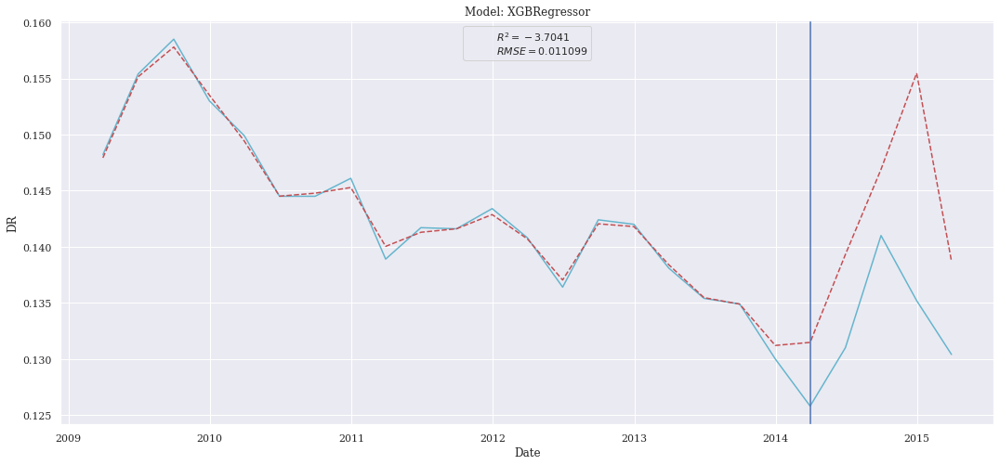

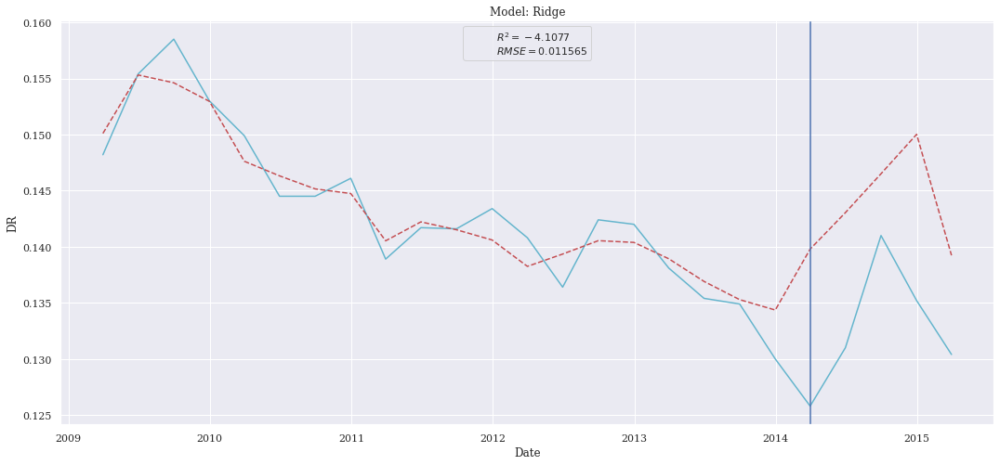

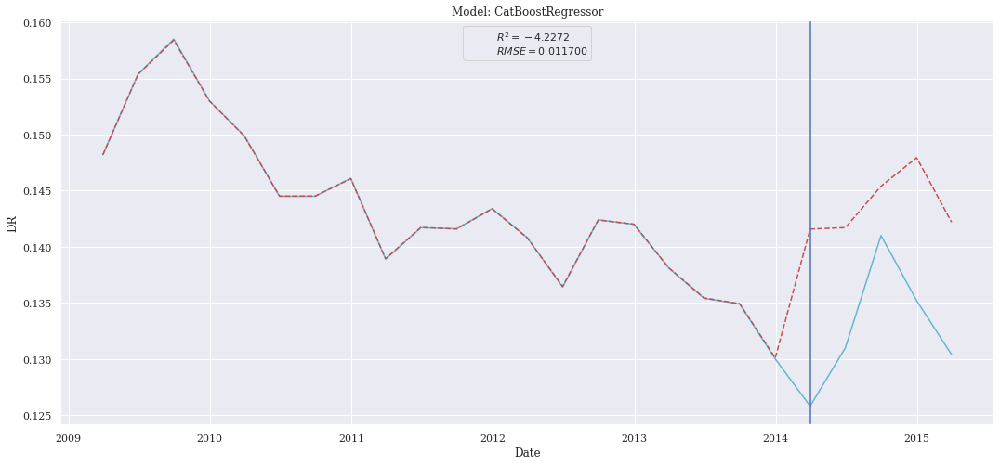

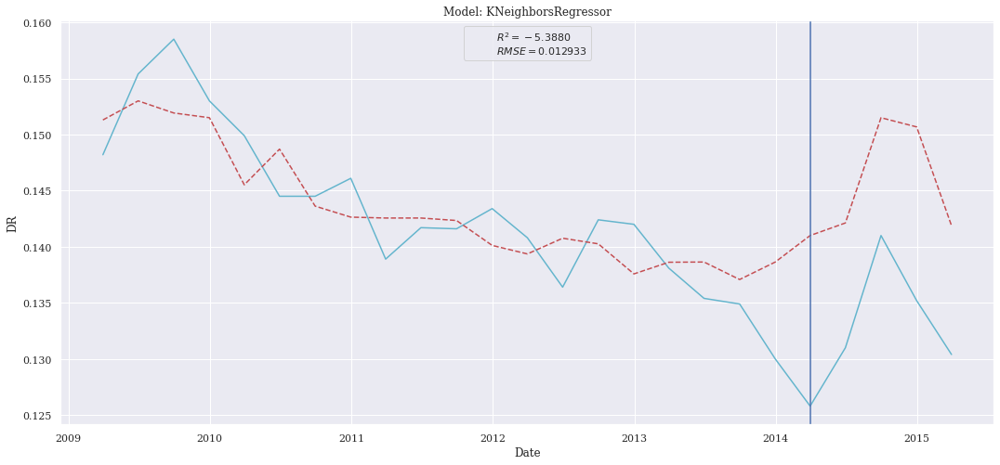

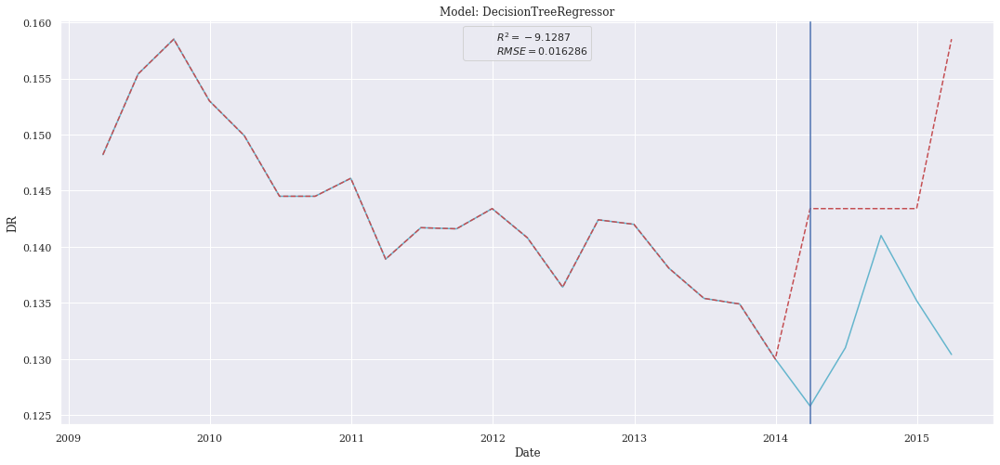

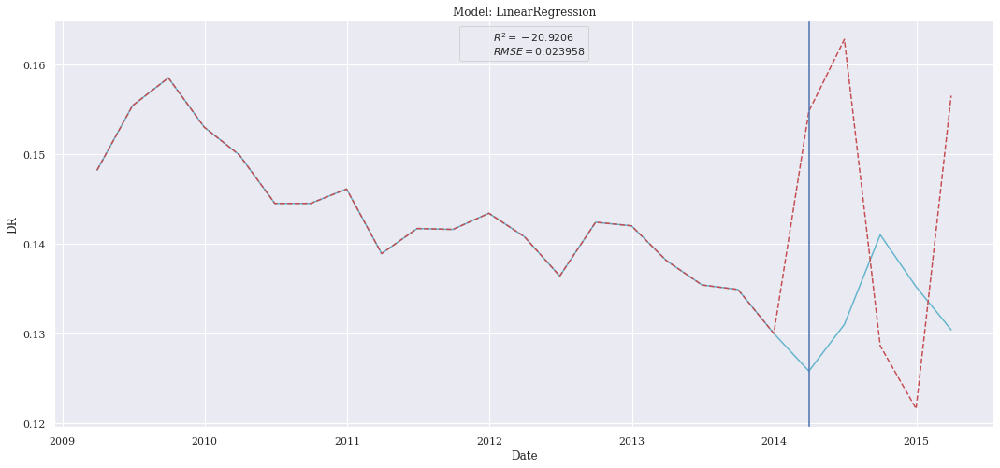

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


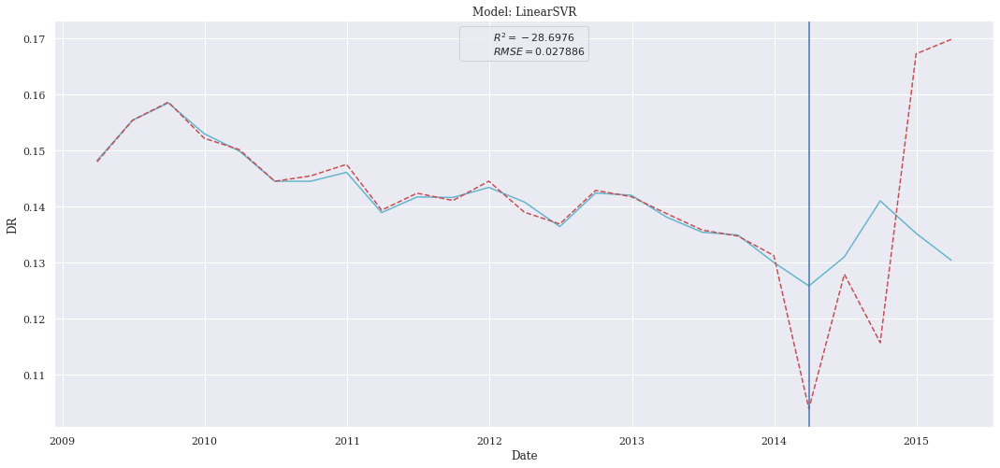

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Tree Based Features -> Linear SVR R2 -0.53

### GridSeach on LinearSVR

In [44]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period,b"CHR8",col_used=cl.col_8_tree,split=split,norm=norm)
params_svr = {"epsilon":[0,0.1,0.2],"C":[1,0.7,0.3,0.1],"loss":["epsilon_insensitive","squared_epsilon_insensitive"],"intercept_scaling":[1,5,10,15]}
params,score = params_grid(X_train,y_train,X_test,y_test,"svr",params_svr,metric="mse")
print(params,score)

Fitting 2 folds for each of 96 candidates, totalling 192 fits


/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: Converge

{'C': 0.3, 'epsilon': 0, 'intercept_scaling': 15, 'loss': 'squared_epsilon_insensitive'} 0.0002964878133005718


/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [45]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["svr"],parameters={"p_svr":params})
summary

,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.017222,0.000297,0.016295,-11.998263


/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


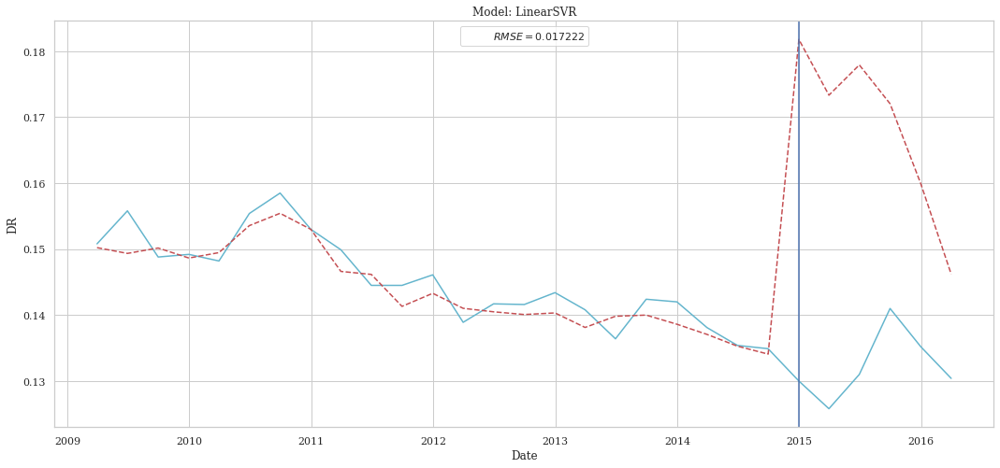

In [46]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on DecisionTree

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR8",col_used=cl.col_2_tree,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='r2')
print(params,score)

NameError: ignored

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on Ridge

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"CHR8",col_used=cl.col_8_kbest,split=split,norm=norm)
params_rid = {"alpha":[1],"fit_intercept":[True,False],"solver":["auto","svd","cholesky","lsqr","sparse_cg","sag","saga"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"rid",parameters=params_rid)
print(params,score)

In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["rid"],parameters={"p_rid":params})
summary

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the Ridge. With the Grid we obtain a r2 equals to -1.007 against -1.95 before GridSearch. Concerning the rmse is now 0.003289 against 0.003982.

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

[14:46:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.007563,0.000057,0.007264,-9.610997
Ridge,0.007698,0.000059,0.006190,-9.994203
KNeighborsRegressor,0.008714,0.000076,0.008172,-13.085827
XGBRegressor,0.009451,0.000089,0.008653,-15.571811
DecisionTreeRegressor,0.009647,0.000093,0.007820,-16.264396
LinearSVR,0.020272,0.000411,0.015724,-75.236838
LinearRegression,0.045146,0.002038,0.044147,-377.113043


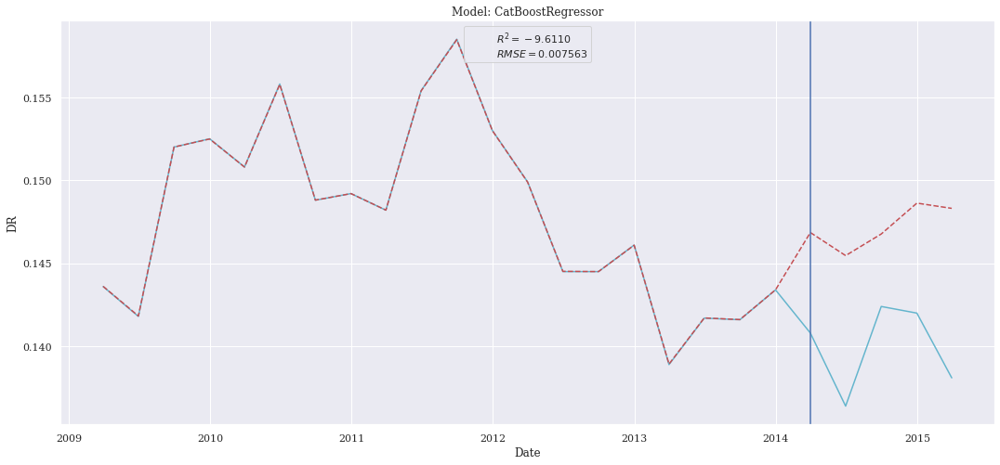

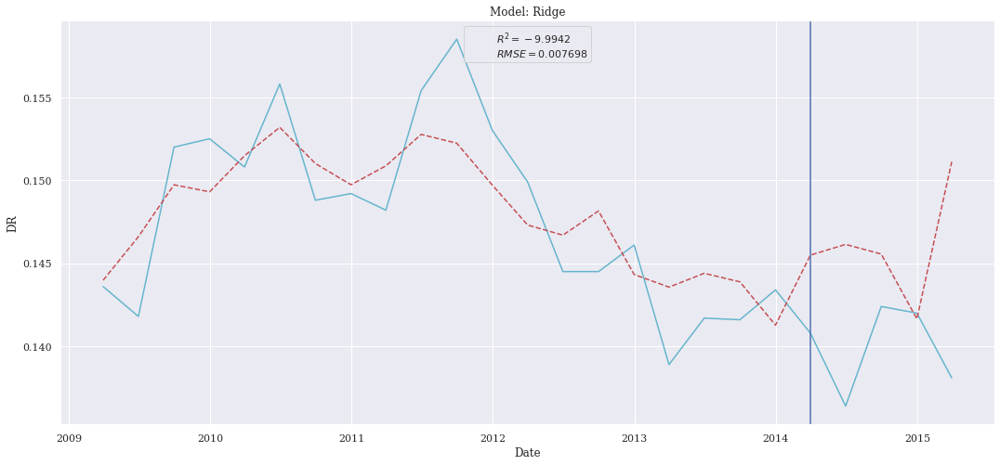

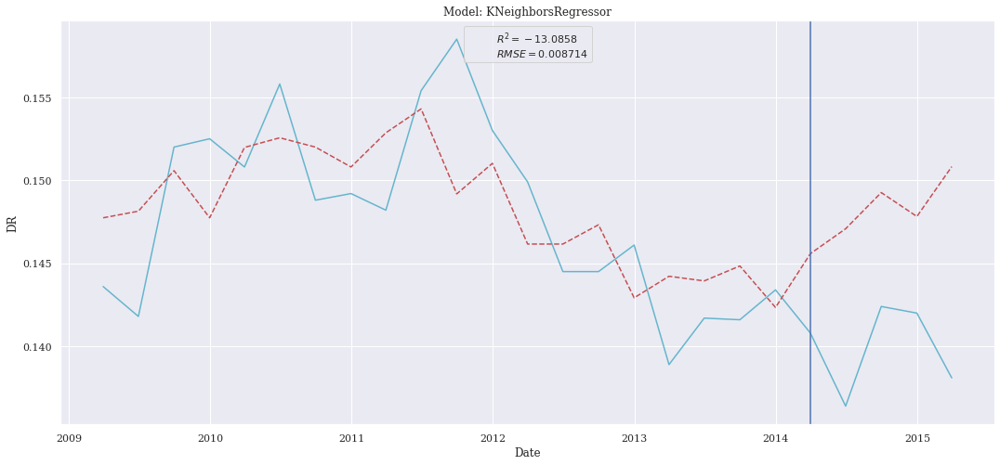

[14:46:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:46:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


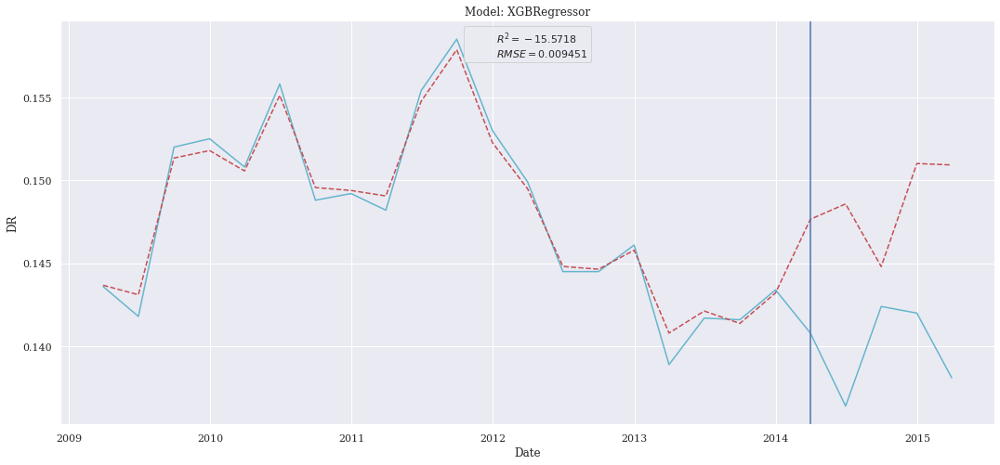

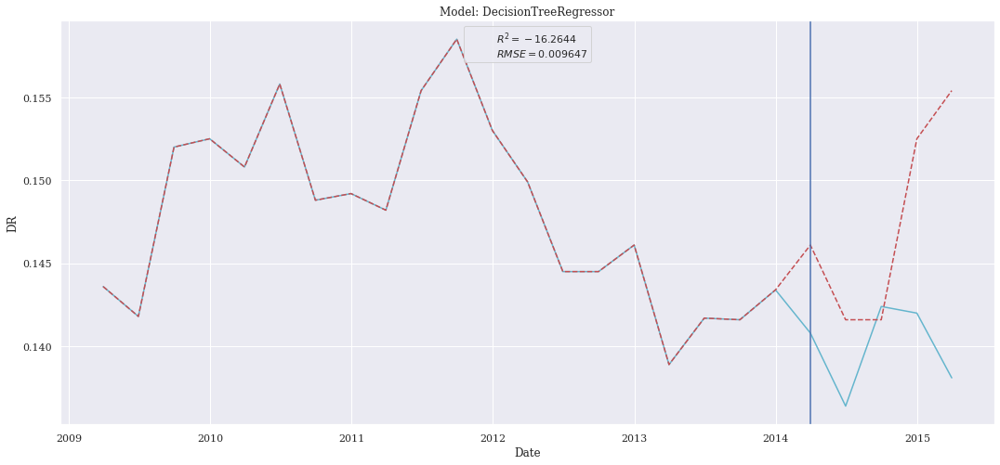

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


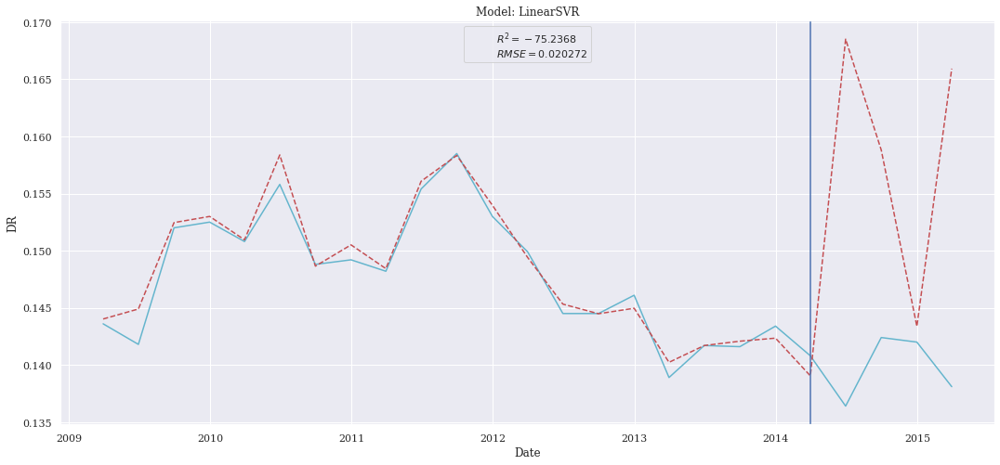

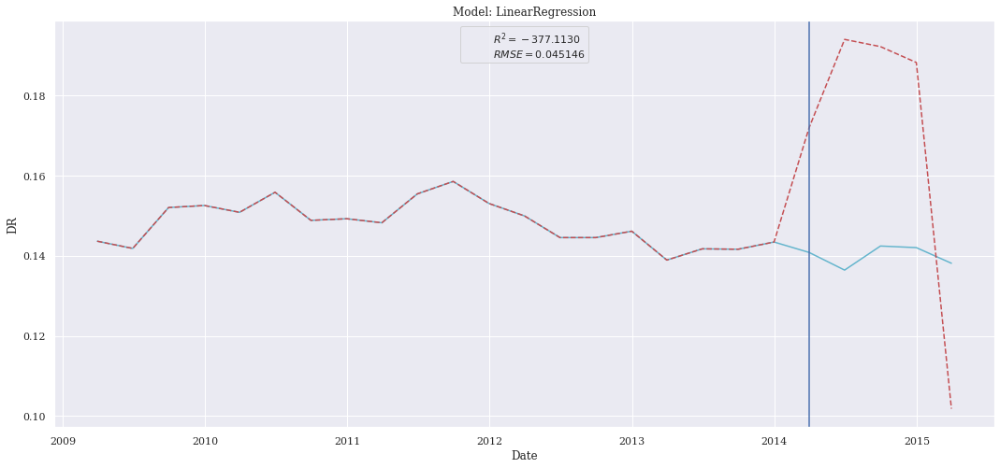

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[i],df_score=summary)

# Focus on Chronique Totale

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [ ]:
chronique=b'Totale'
start = 1
norm = "MinMax"
split = 0.2
period=24
# Useful to plot the model 
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train, X_test], axis=1).index

### Correlation Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.001984,0.000004,0.001719,-30.325867
XGBRegressor,0.002055,0.000004,0.001820,-32.628455
CatBoostRegressor,0.002326,0.000005,0.002018,-42.082935
LinearSVR,0.002411,0.000006,0.002224,-45.292060
Ridge,0.002451,0.000006,0.002065,-46.848980
DecisionTreeRegressor,0.002592,0.000007,0.002320,-52.503185
KNeighborsRegressor,0.002639,0.000007,0.002312,-54.448408


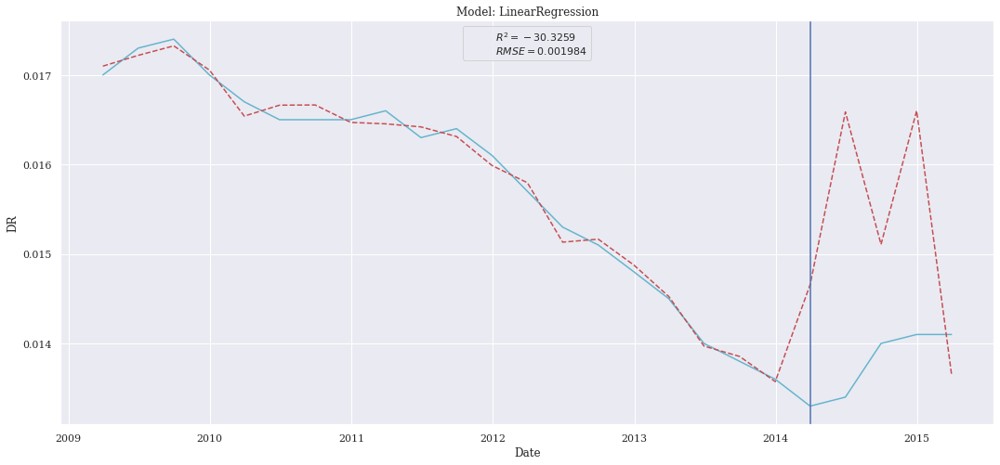

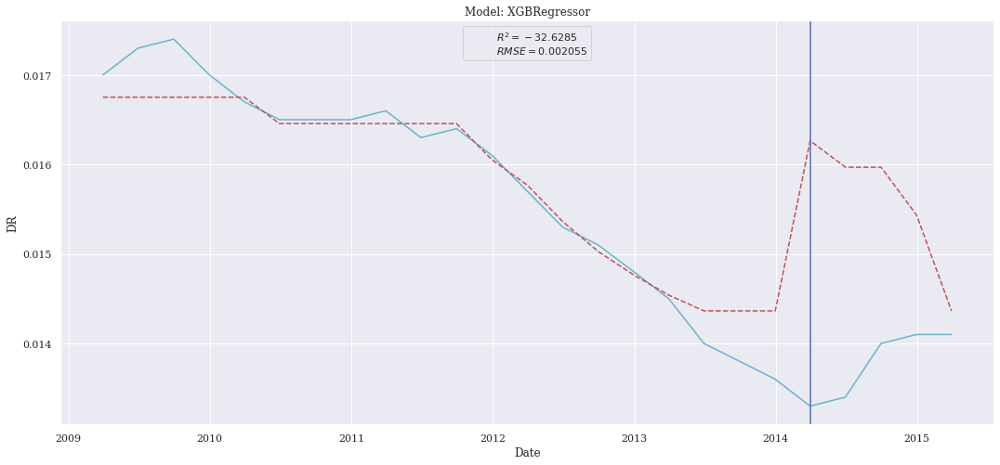

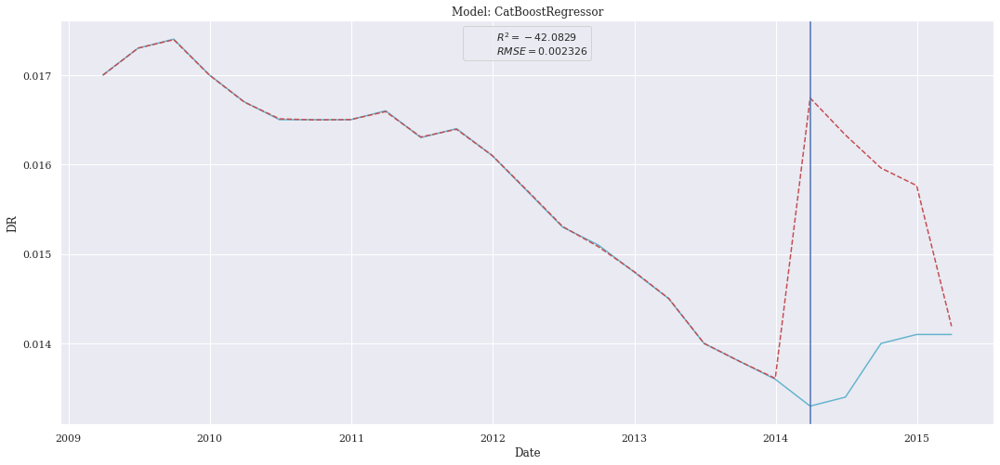

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


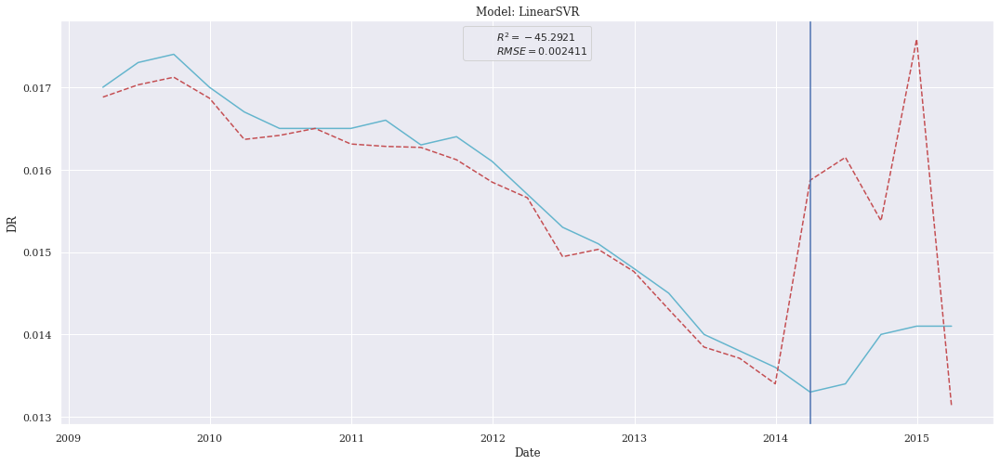

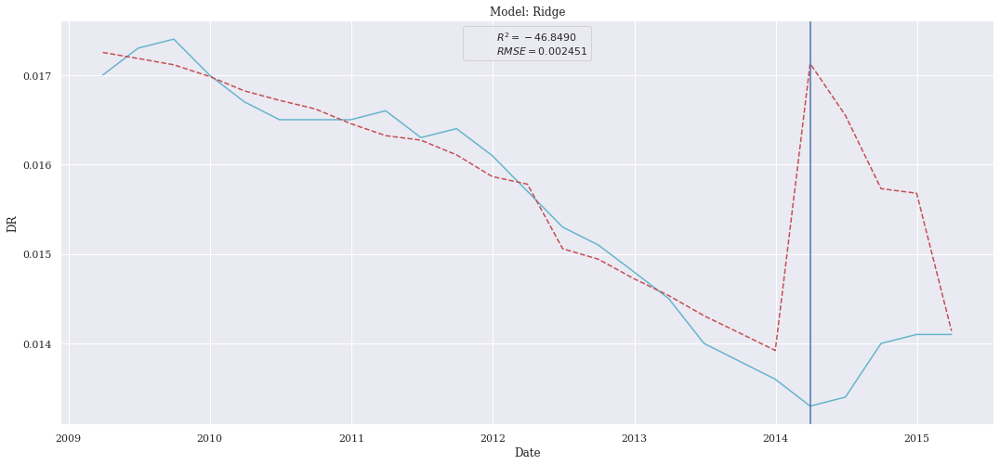

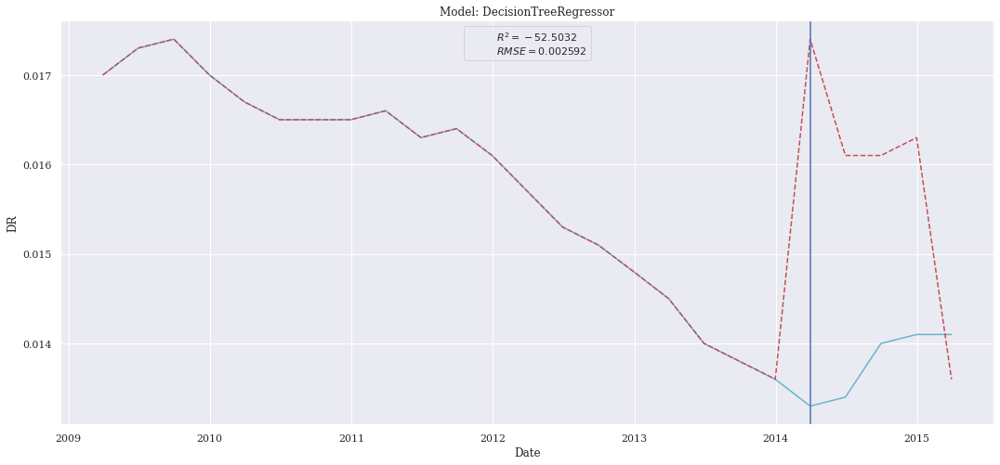

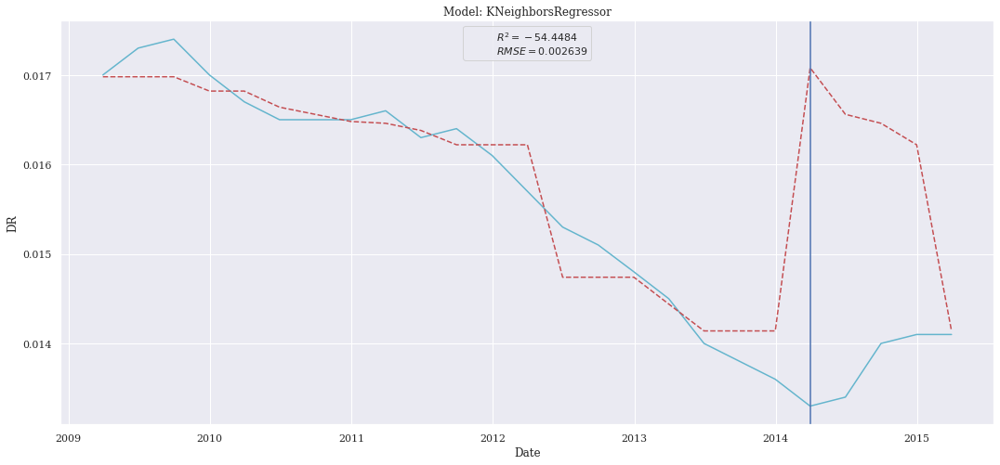

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.002216,0.000005,0.002076,-38.081206
XGBRegressor,0.002418,0.000006,0.002069,-45.566467
KNeighborsRegressor,0.002556,0.000007,0.002140,-51.004459
DecisionTreeRegressor,0.002589,0.000007,0.002060,-52.359873
Ridge,0.002741,0.000008,0.002233,-58.809112
LinearRegression,0.003450,0.000012,0.002743,-93.779369
LinearSVR,0.004537,0.000021,0.003458,-162.860711


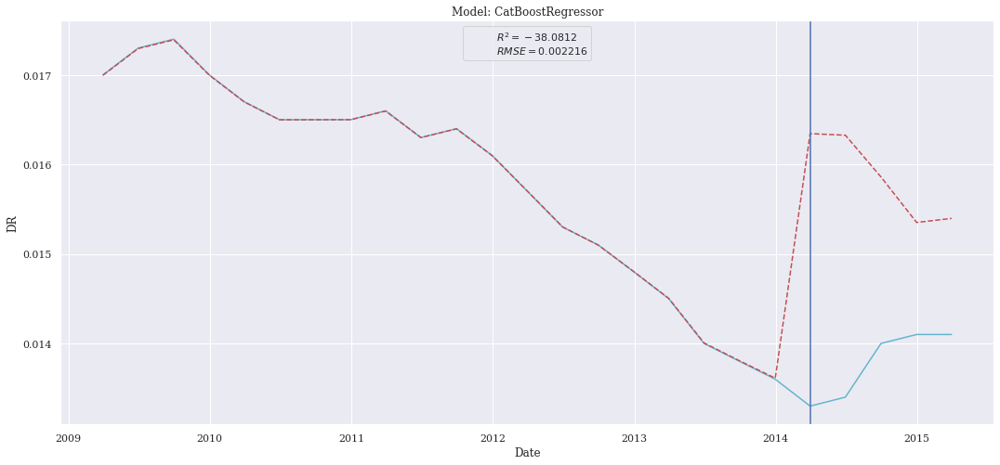

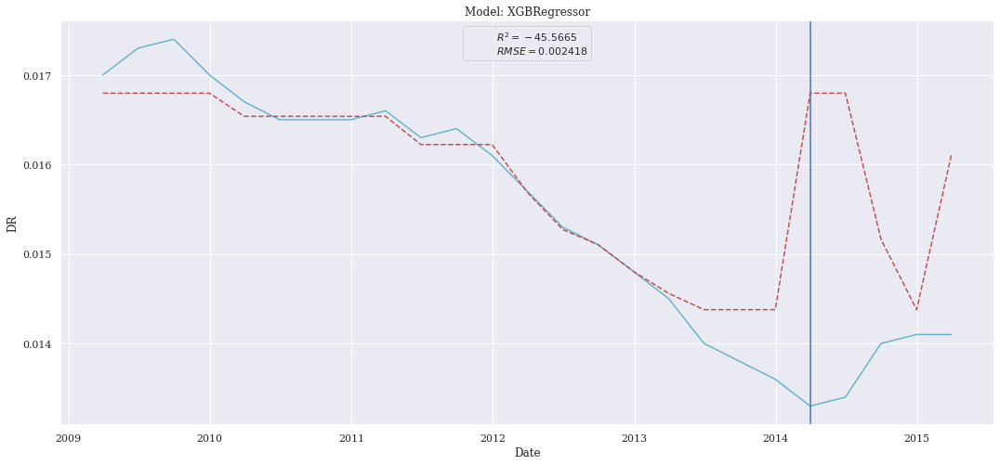

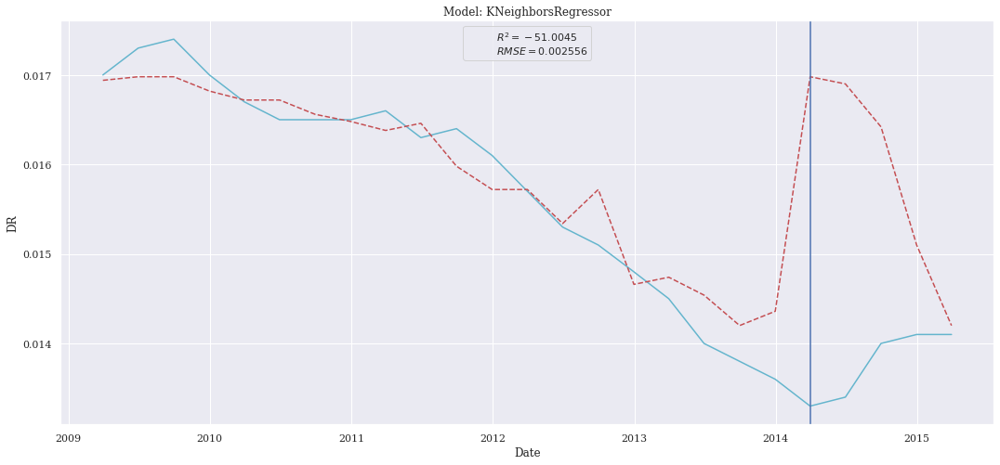

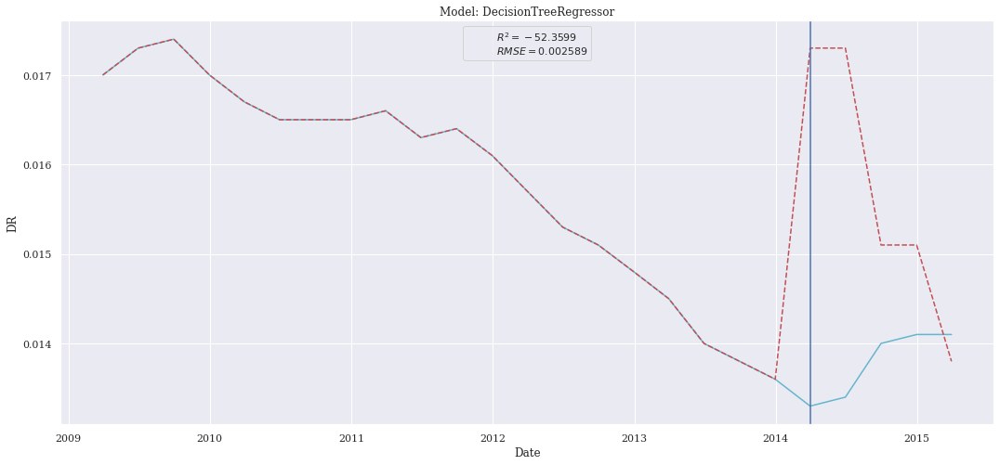

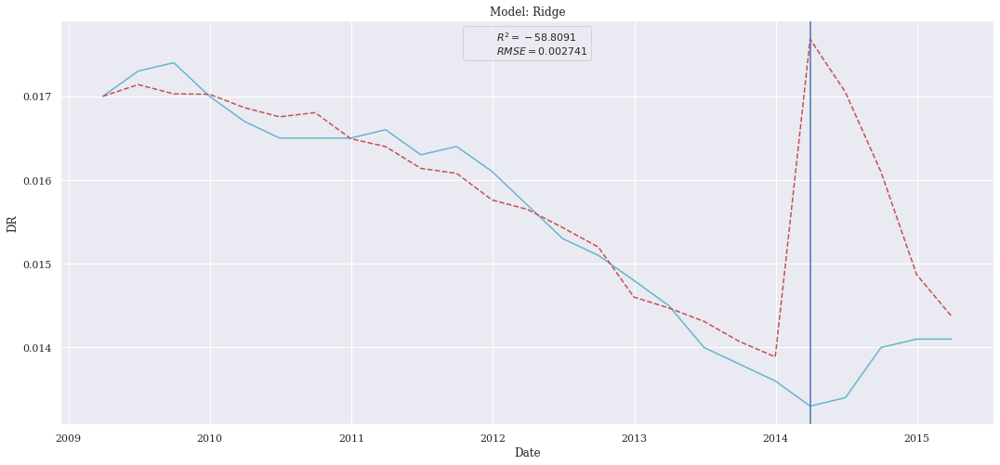

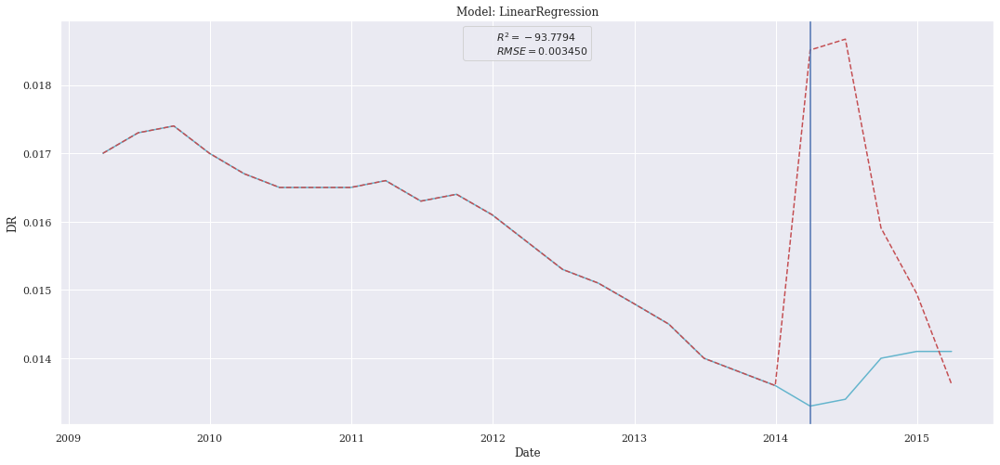

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


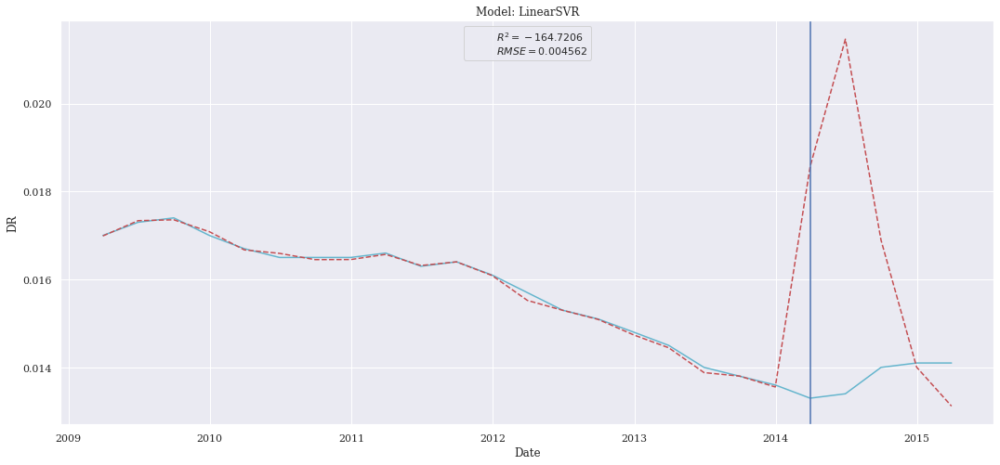

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001628,0.000003,0.001600,-20.114650
XGBRegressor,0.001760,0.000003,0.001733,-23.674222
LinearSVR,0.001873,0.000004,0.001131,-26.944828
CatBoostRegressor,0.002362,0.000006,0.002224,-43.424181
Ridge,0.002557,0.000007,0.002331,-51.038692
KNeighborsRegressor,0.002746,0.000008,0.002556,-59.022293
LinearRegression,0.003545,0.000013,0.002595,-99.043651


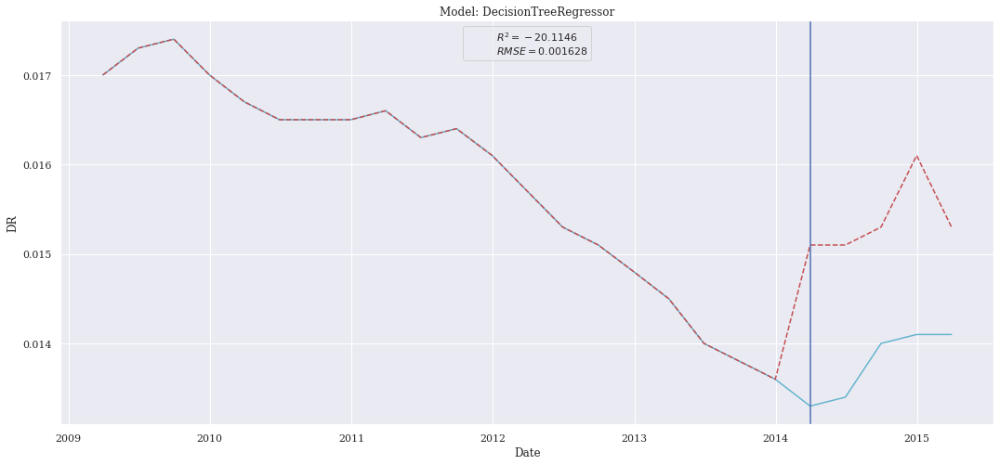

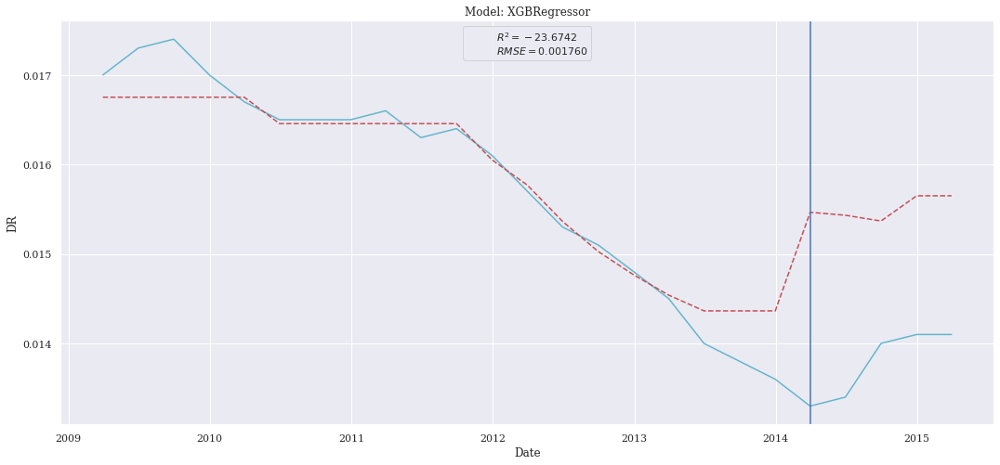

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


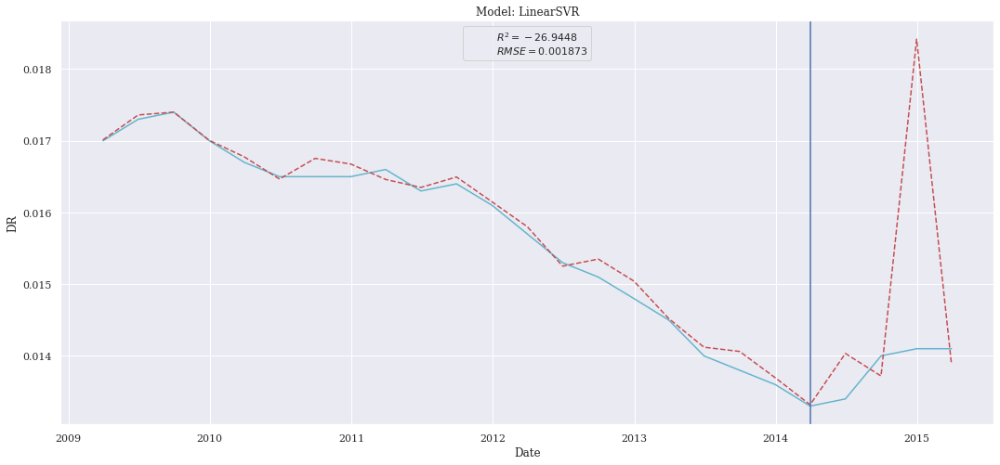

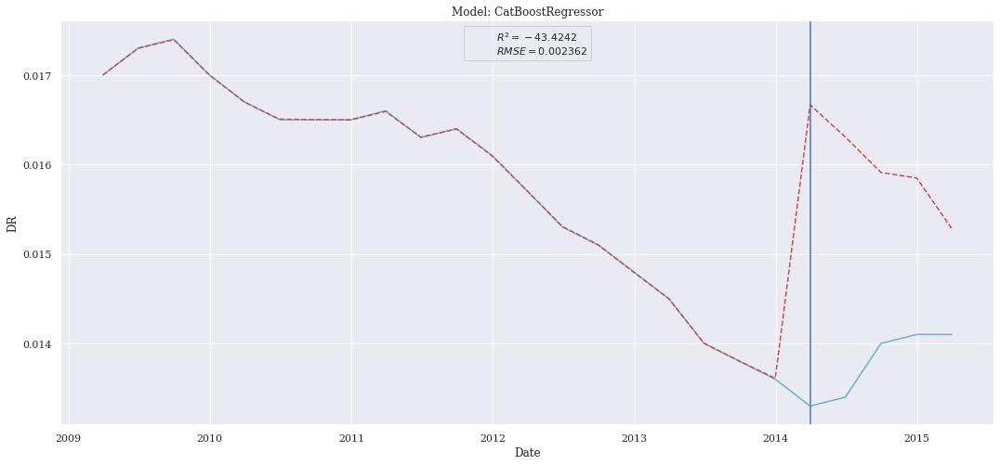

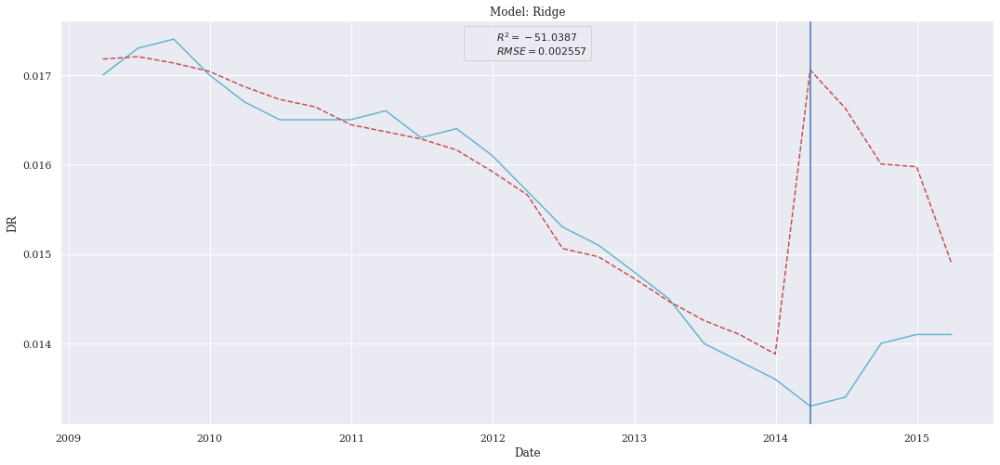

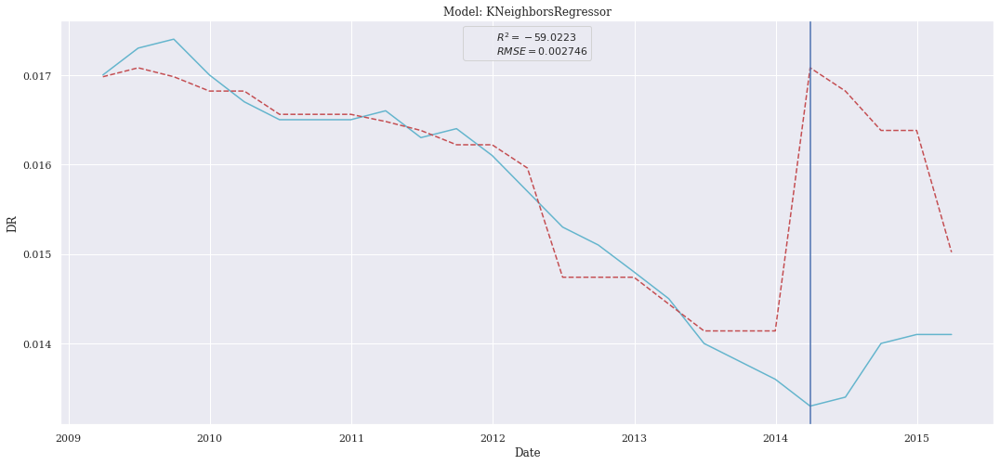

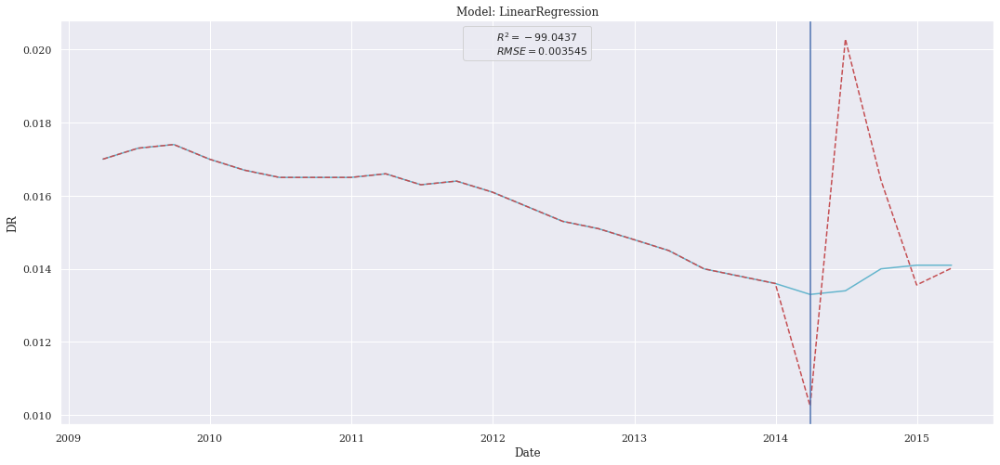

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.002077,0.000004,0.002065,-33.356346
CatBoostRegressor,0.002272,0.000005,0.002208,-40.104030
DecisionTreeRegressor,0.002588,0.000007,0.002000,-52.343949
Ridge,0.002700,0.000007,0.002430,-57.025909
KNeighborsRegressor,0.002705,0.000007,0.002480,-57.256051
LinearRegression,0.002845,0.000008,0.002652,-63.445172
LinearSVR,0.002845,0.000008,0.002282,-63.463363


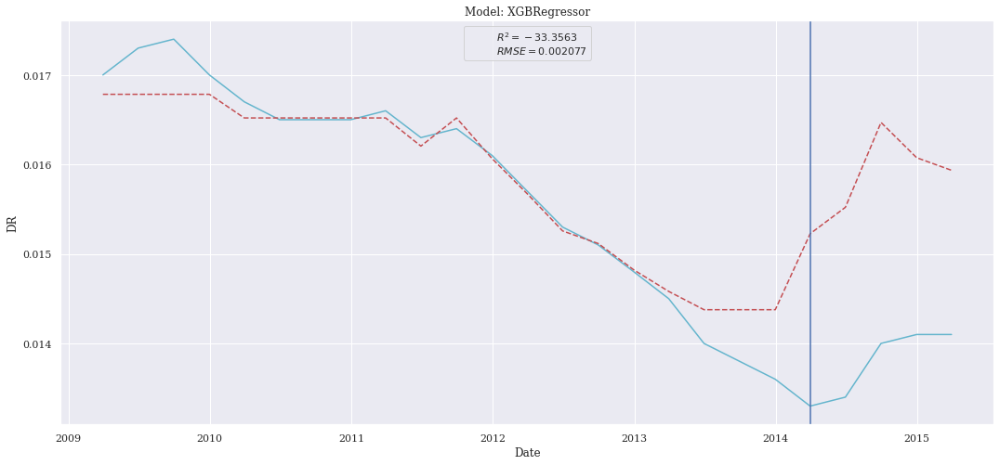

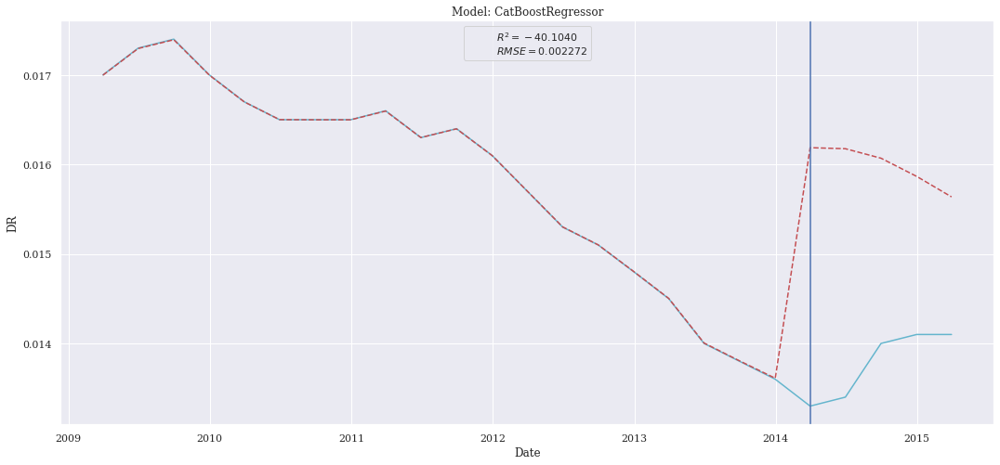

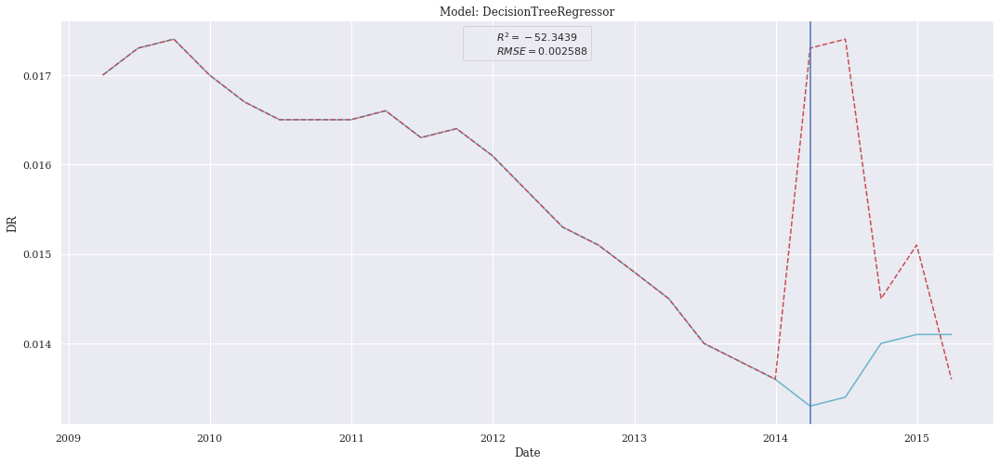

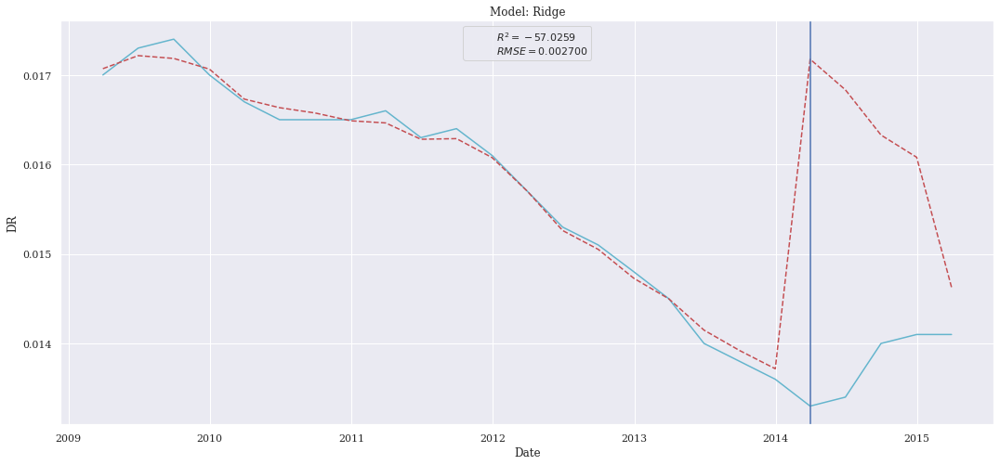

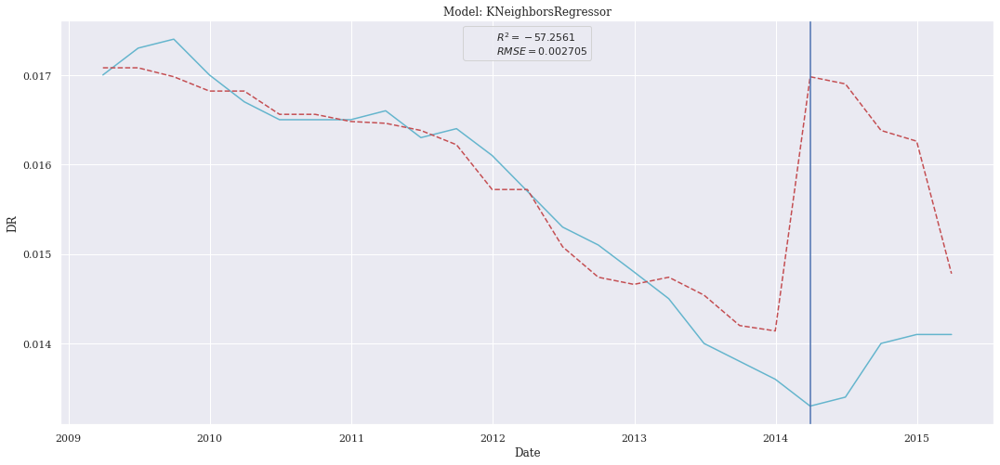

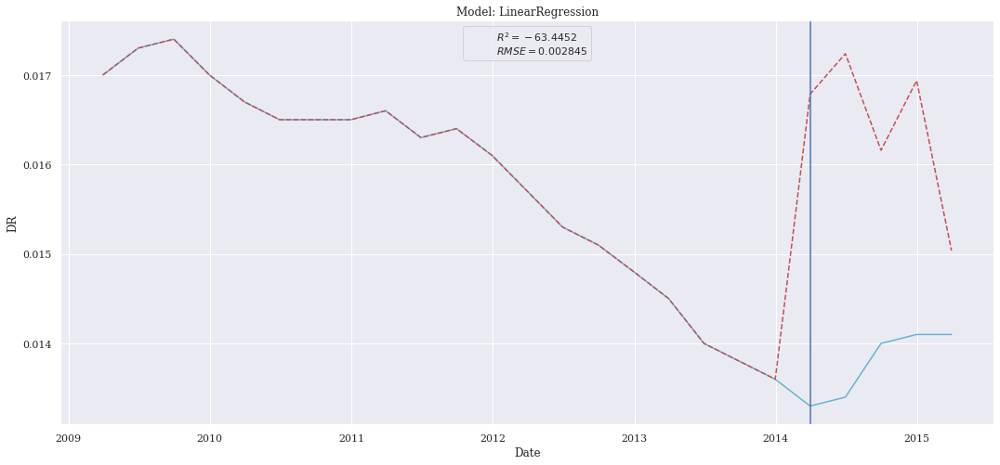

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


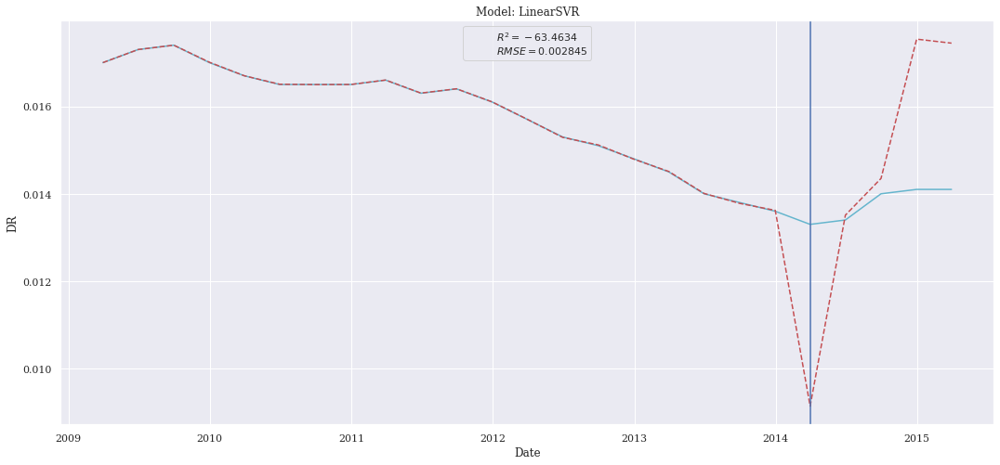

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.002198,0.000005,0.002034,-37.474259
DecisionTreeRegressor,0.002253,0.000005,0.001900,-39.429936
XGBRegressor,0.002320,0.000005,0.002018,-41.864583
KNeighborsRegressor,0.002444,0.000006,0.002040,-46.563057
LinearRegression,0.002705,0.000007,0.002117,-57.273359
LinearSVR,0.002763,0.000008,0.002463,-59.797743
Ridge,0.002777,0.000008,0.002227,-60.387449


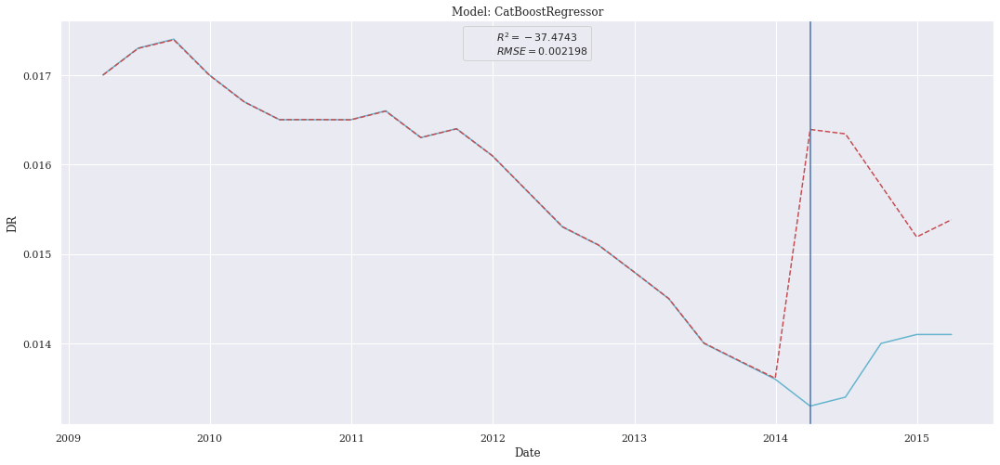

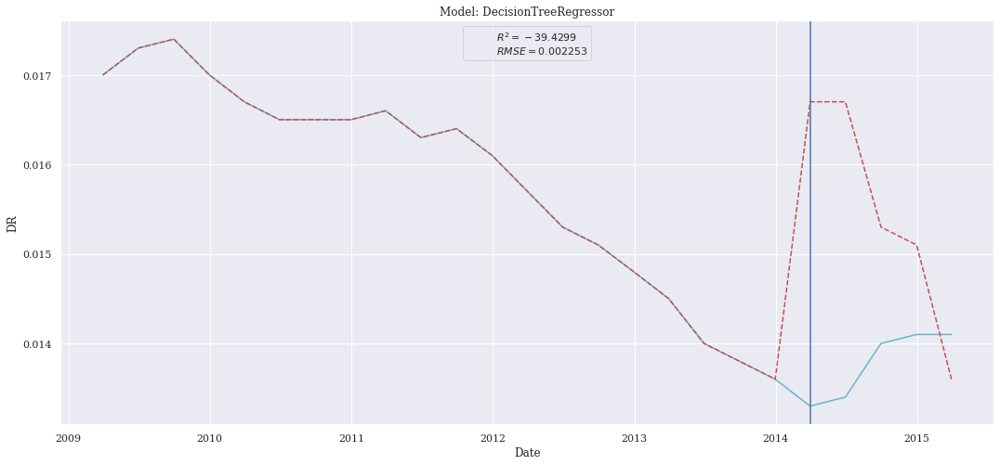

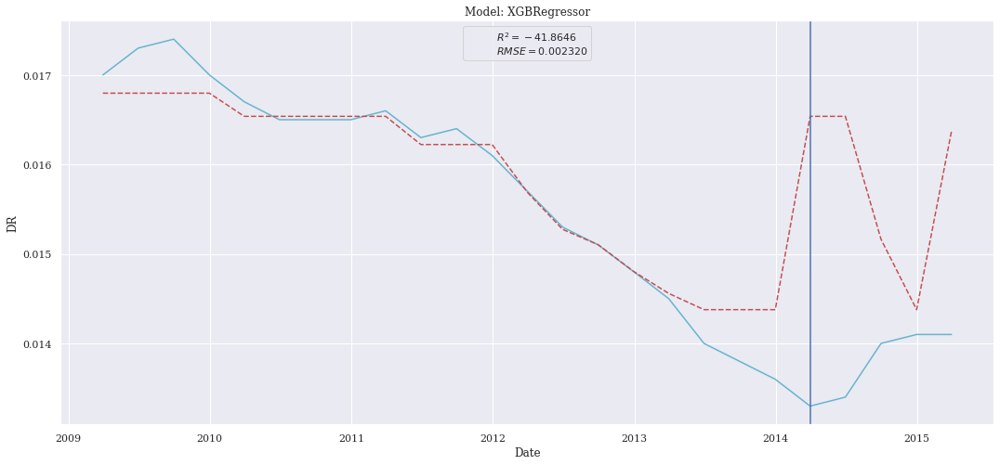

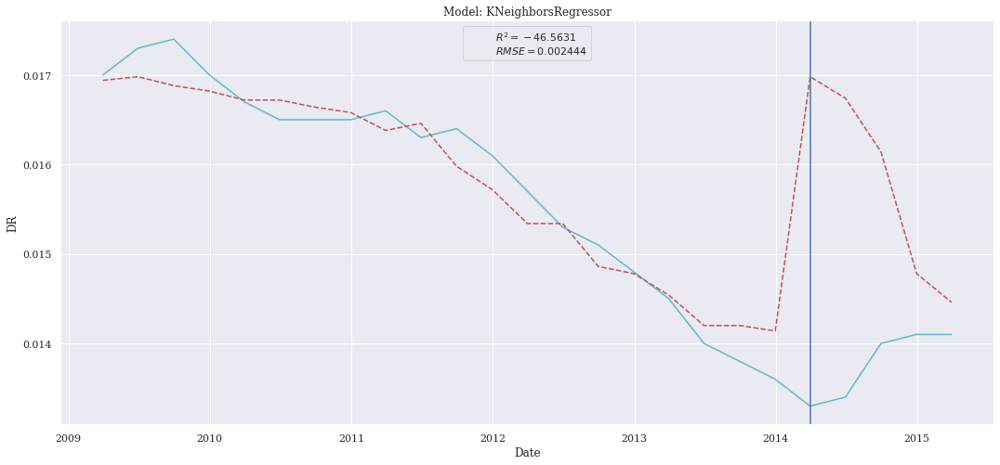

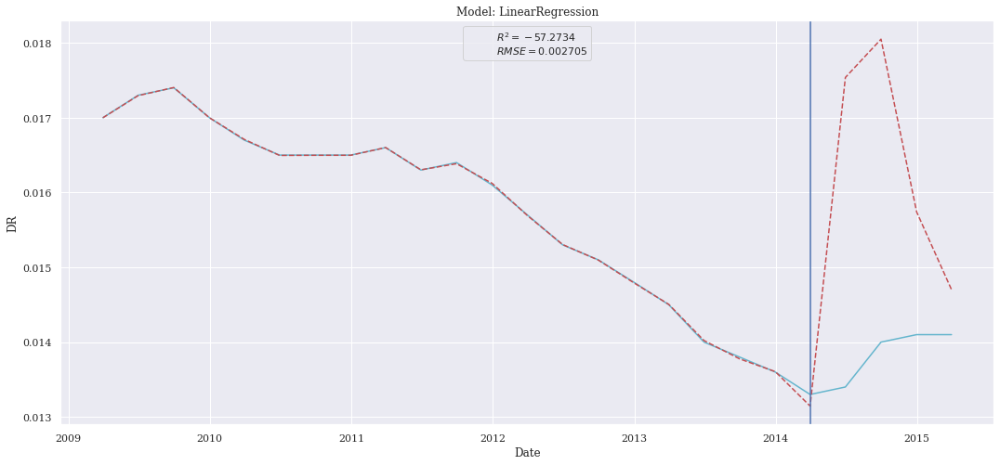

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


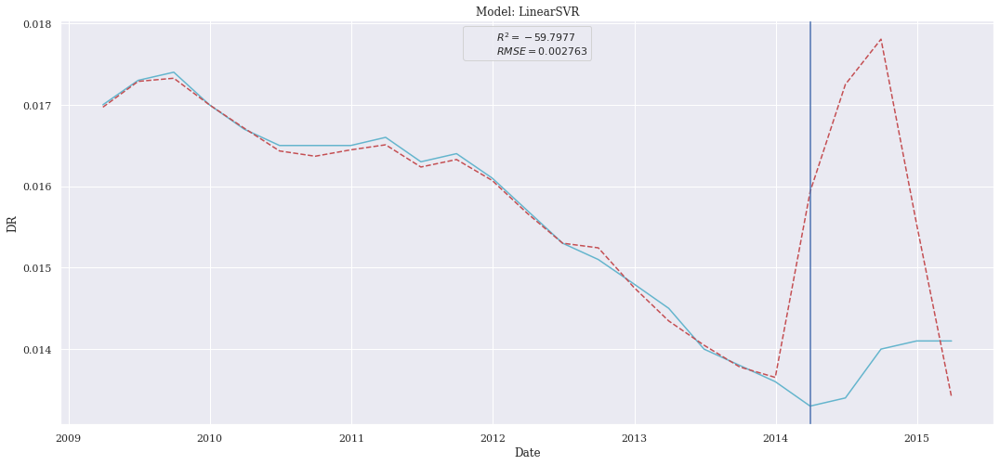

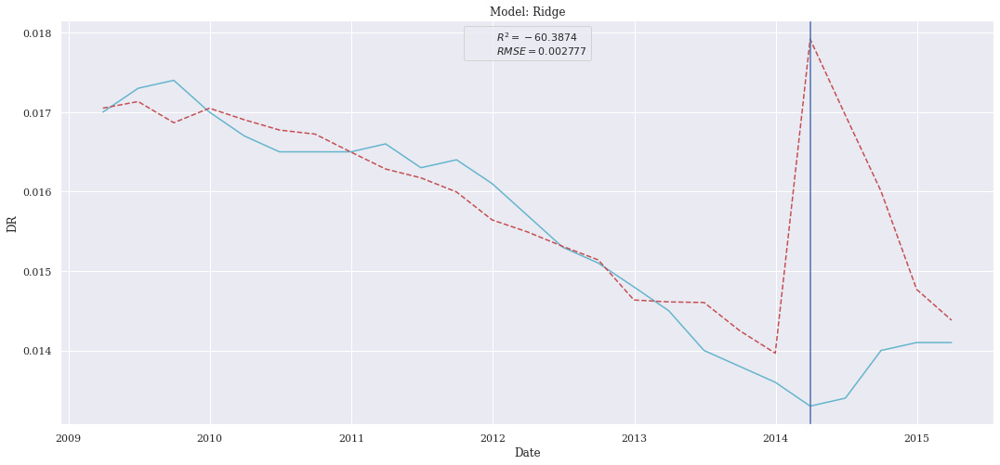

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.001963,0.000004,0.001950,-29.686213
CatBoostRegressor,0.002152,0.000005,0.001982,-35.874212
Ridge,0.002319,0.000005,0.002042,-41.815894
KNeighborsRegressor,0.002605,0.000007,0.002316,-53.037580
LinearSVR,0.002727,0.000007,0.002242,-58.198834
LinearRegression,0.002834,0.000008,0.002310,-62.938345
DecisionTreeRegressor,0.002930,0.000009,0.002620,-67.328025


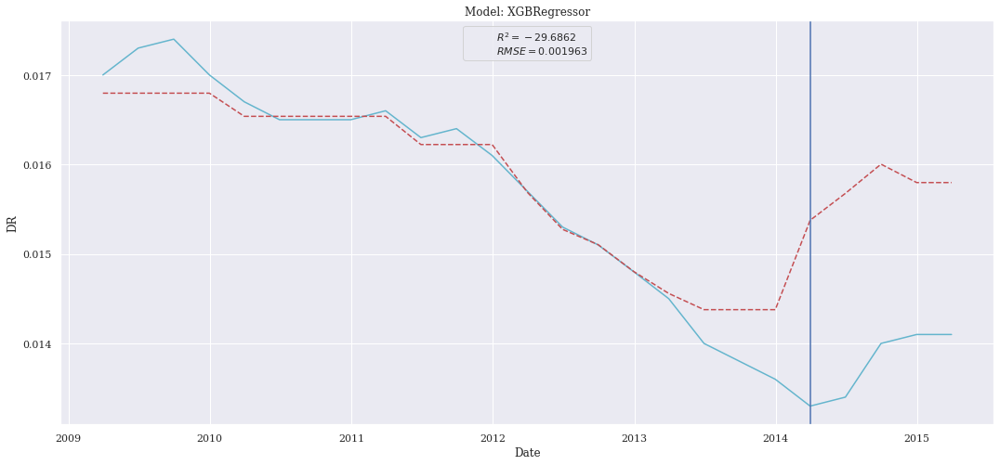

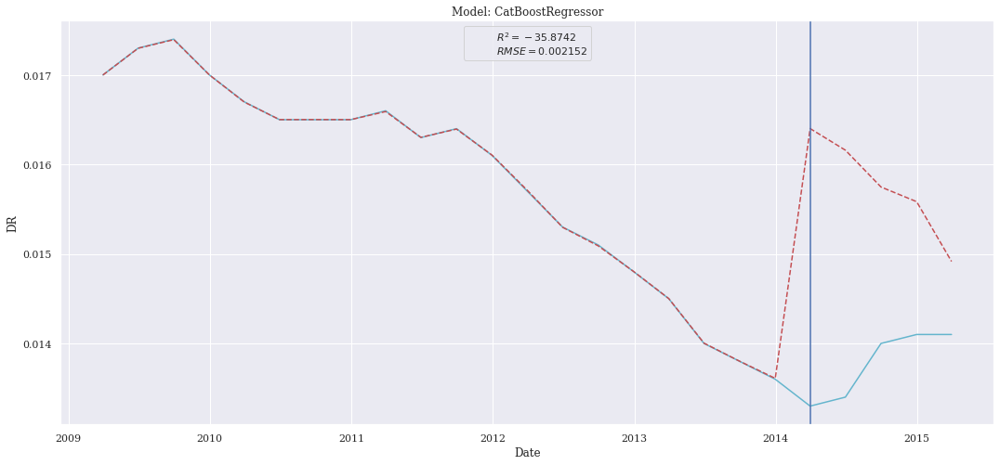

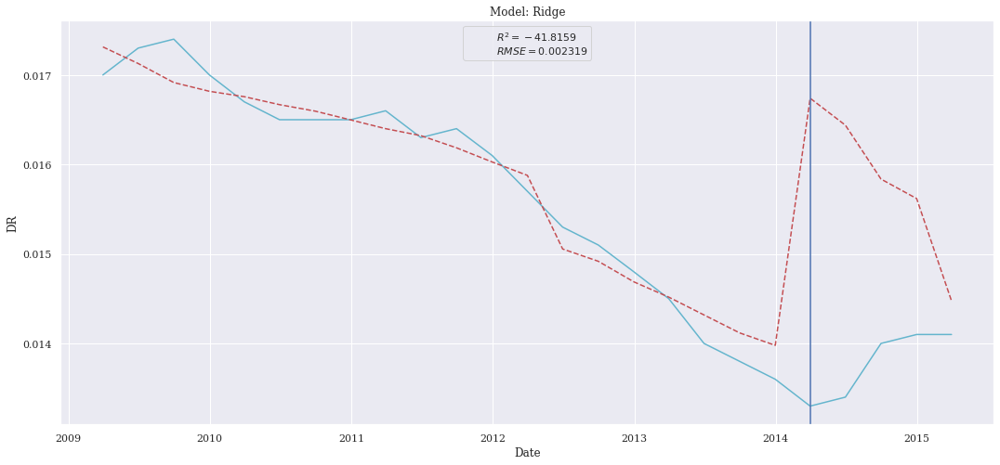

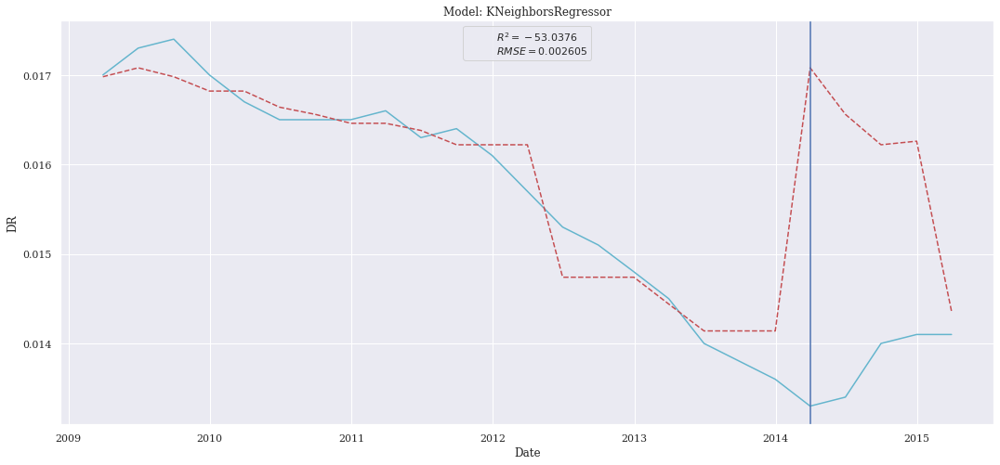

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


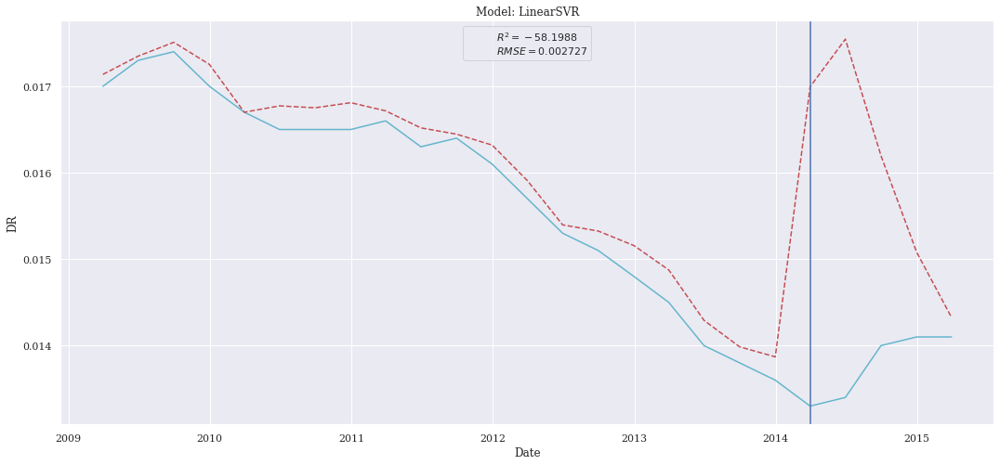

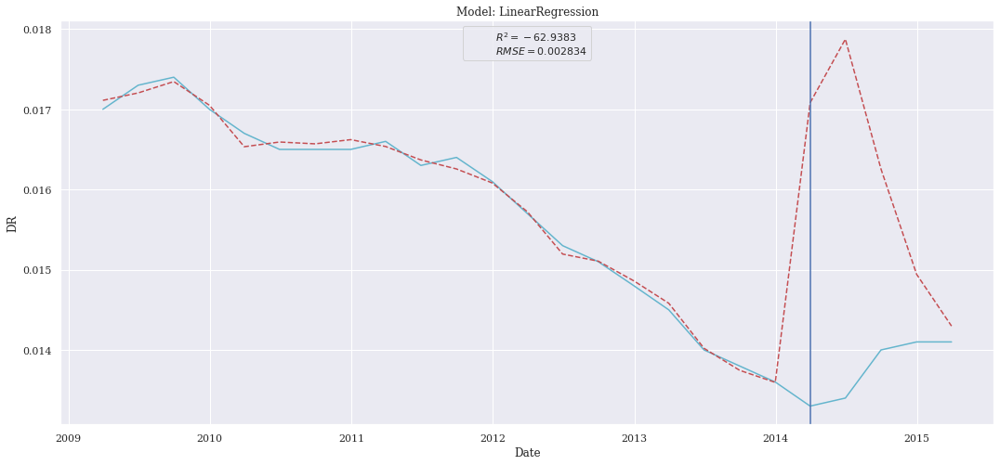

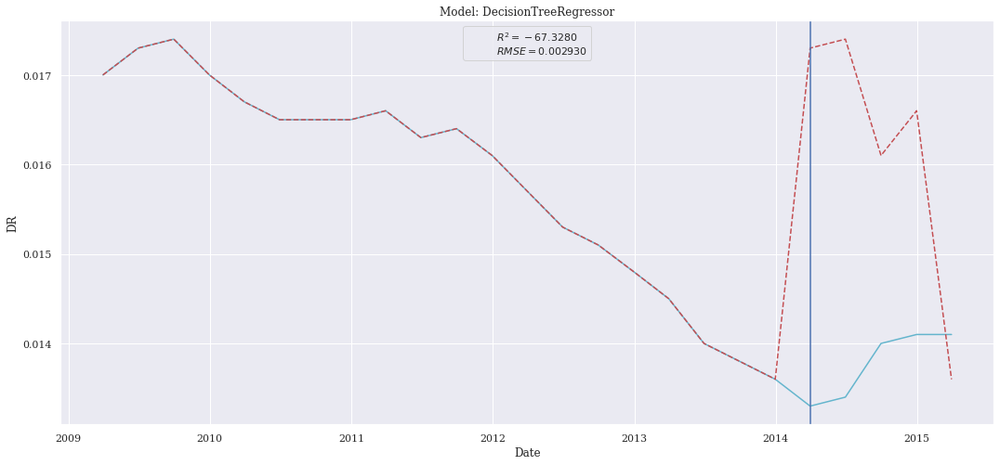

In [ ]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.002124,0.000005,0.001909,-34.934437
CatBoostRegressor,0.002460,0.000006,0.002389,-47.172507
KNeighborsRegressor,0.002669,0.000007,0.002452,-55.702548
Ridge,0.002802,0.000008,0.002644,-61.490568
DecisionTreeRegressor,0.002854,0.000008,0.002600,-63.840764
LinearSVR,0.003758,0.000014,0.003596,-111.451257
LinearRegression,0.003838,0.000015,0.003656,-116.264764


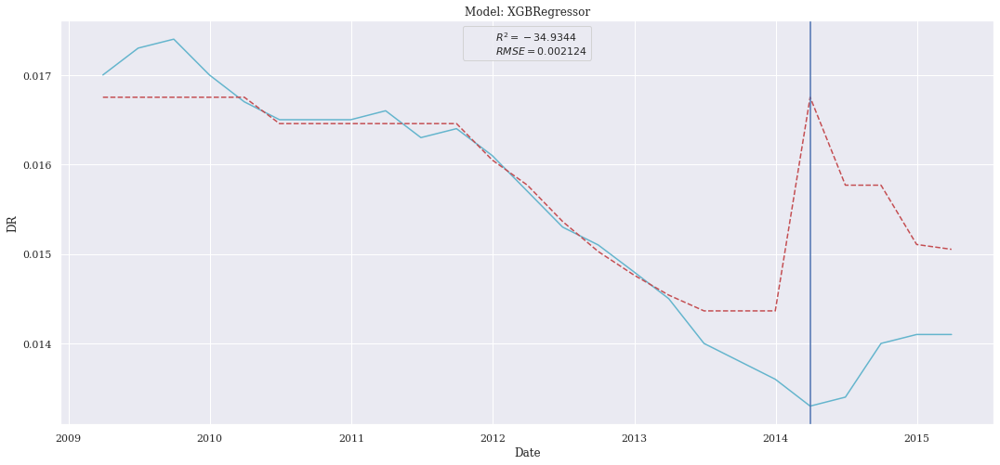

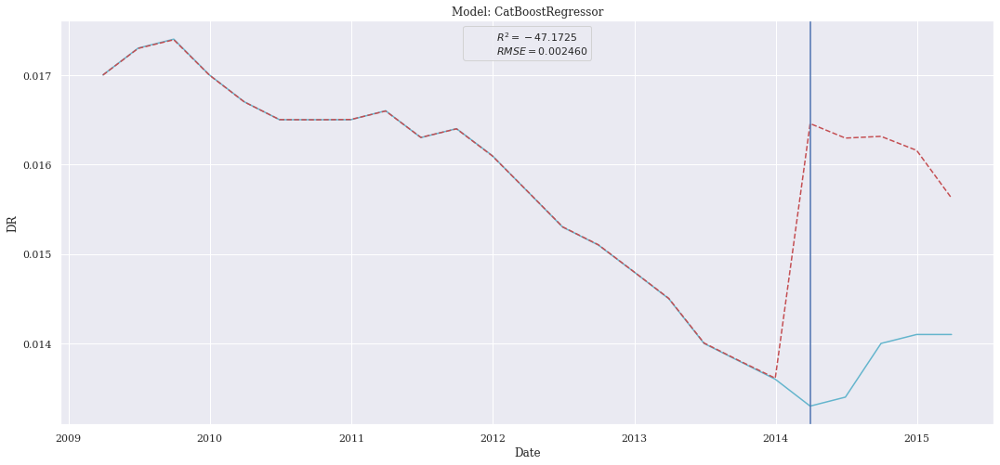

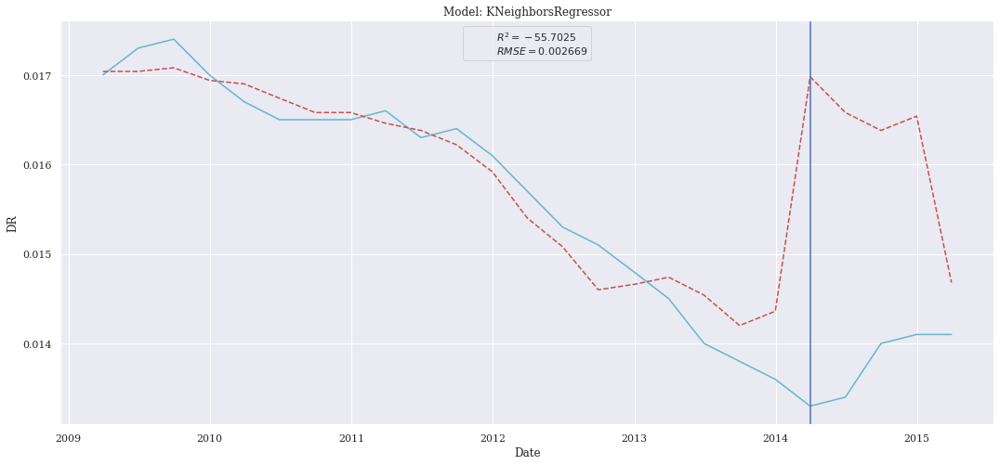

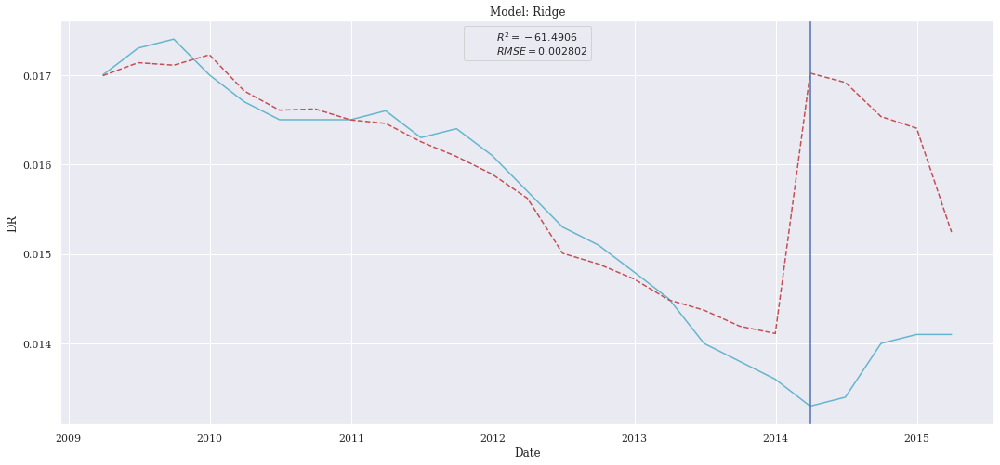

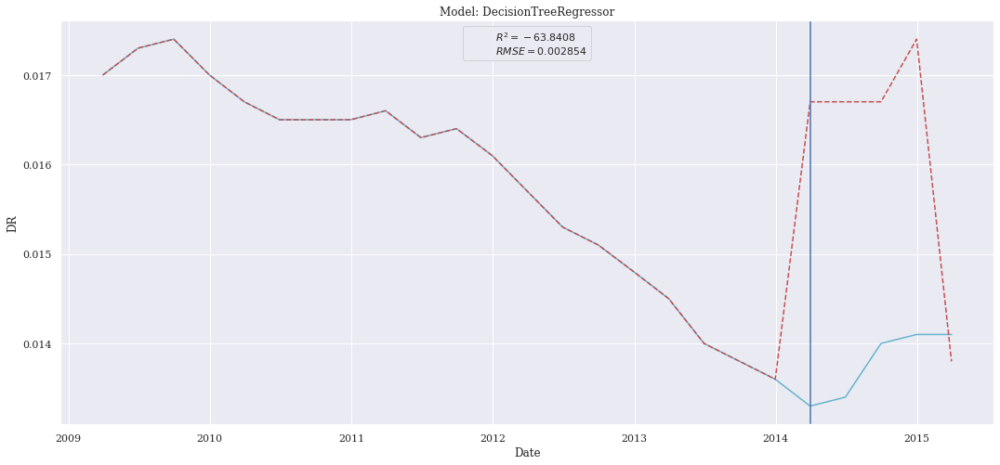

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


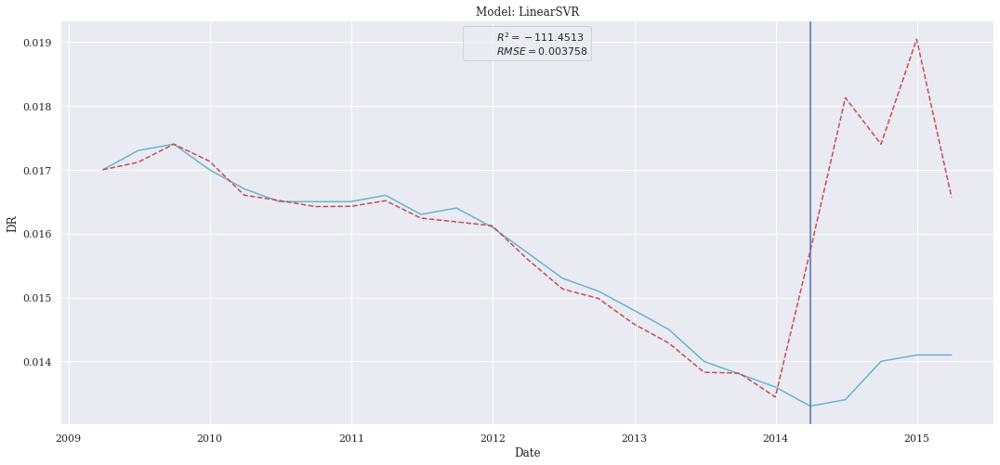

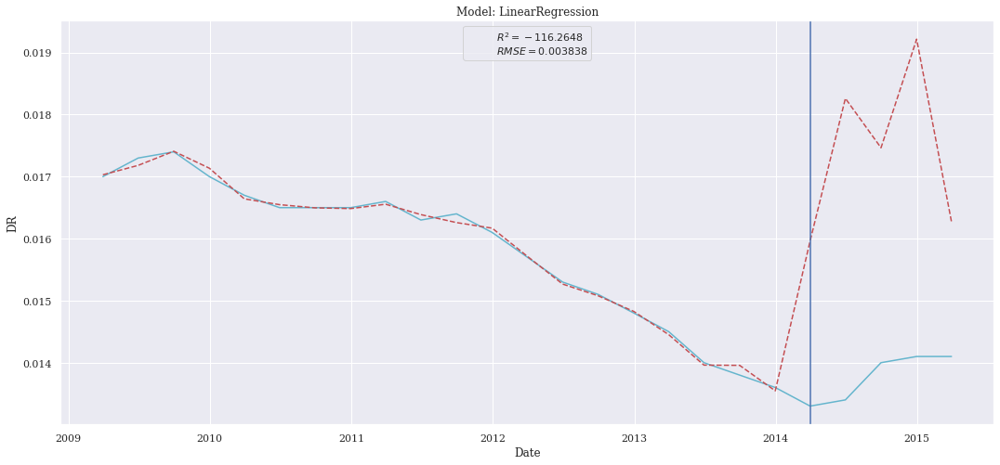

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [ ]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_totale_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001577,0.000002,0.001400,-18.808917
CatBoostRegressor,0.002230,0.000005,0.002089,-38.604832
XGBRegressor,0.002370,0.000006,0.002006,-43.705155
KNeighborsRegressor,0.002553,0.000007,0.002132,-50.879618
Ridge,0.002583,0.000007,0.002153,-52.121662
LinearSVR,0.002776,0.000008,0.002273,-60.369023
LinearRegression,0.003380,0.000011,0.003035,-89.973097


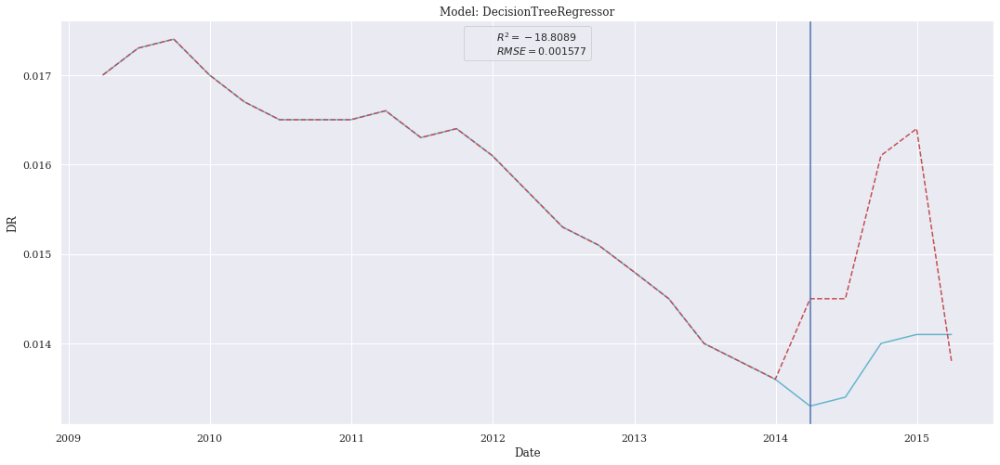

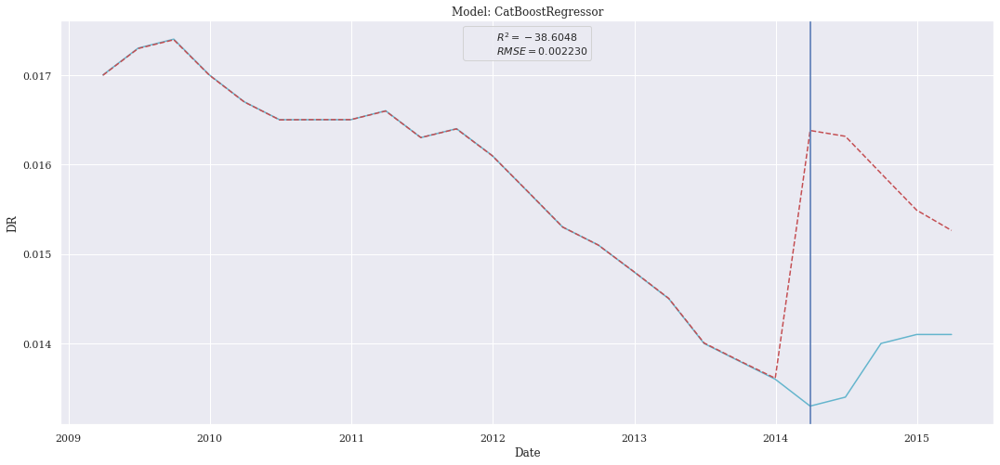

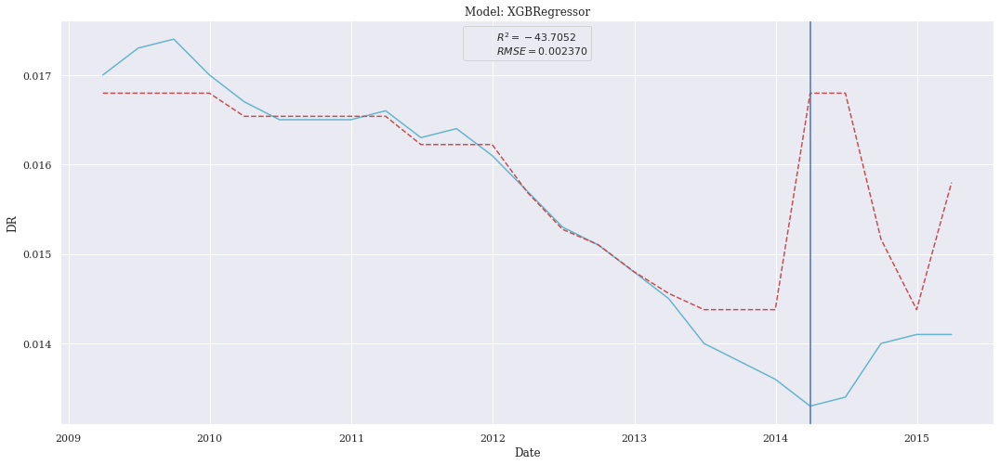

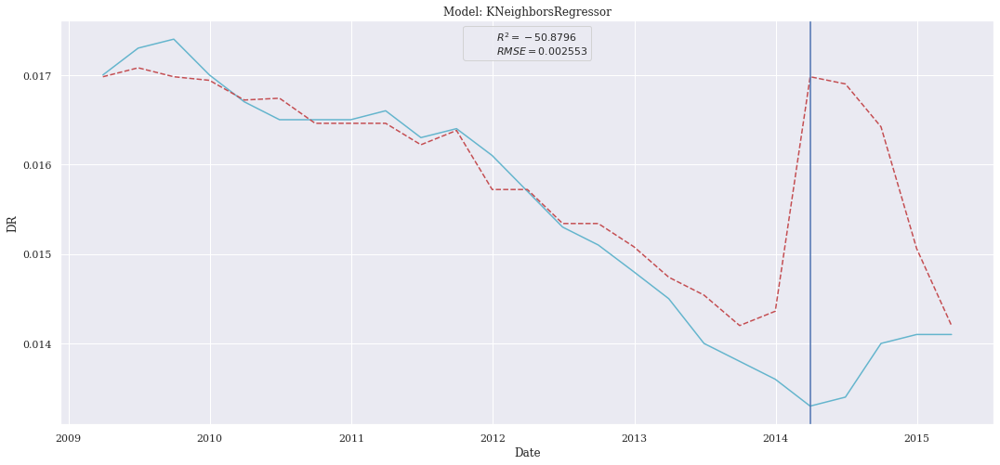

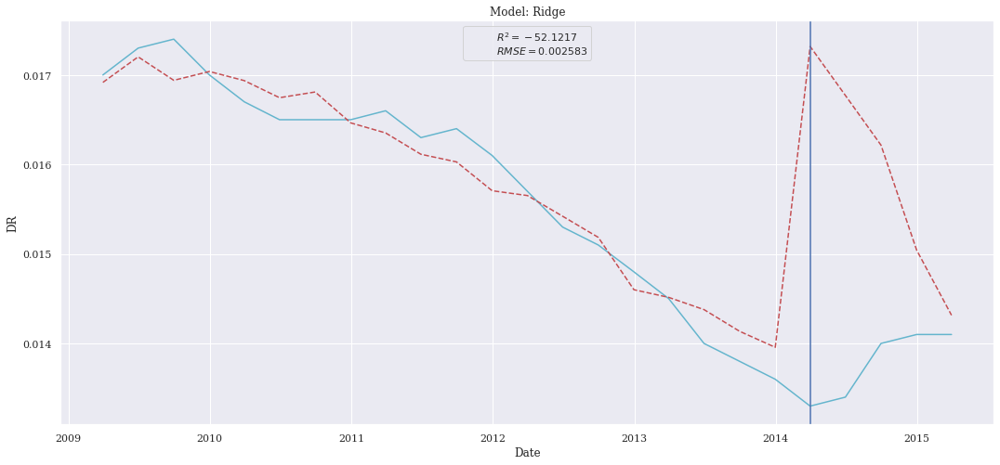

/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/opt/anaconda3/envs/cvxpy_env/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


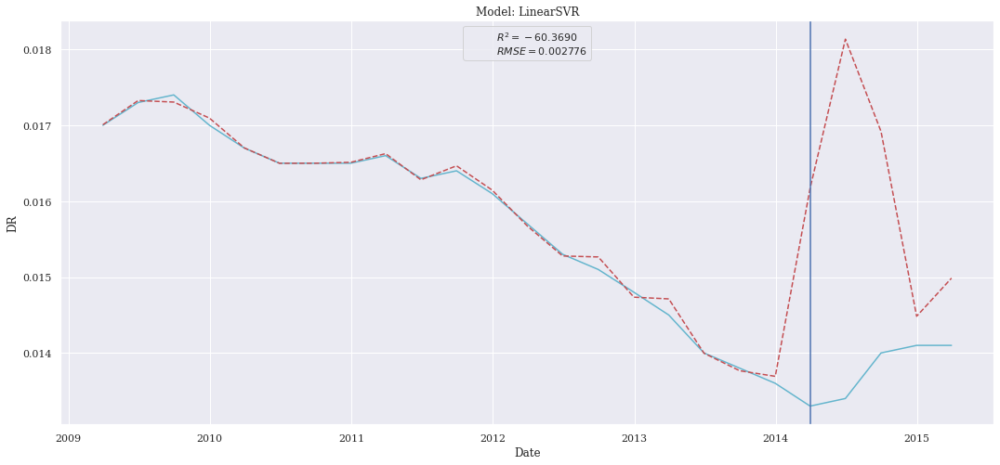

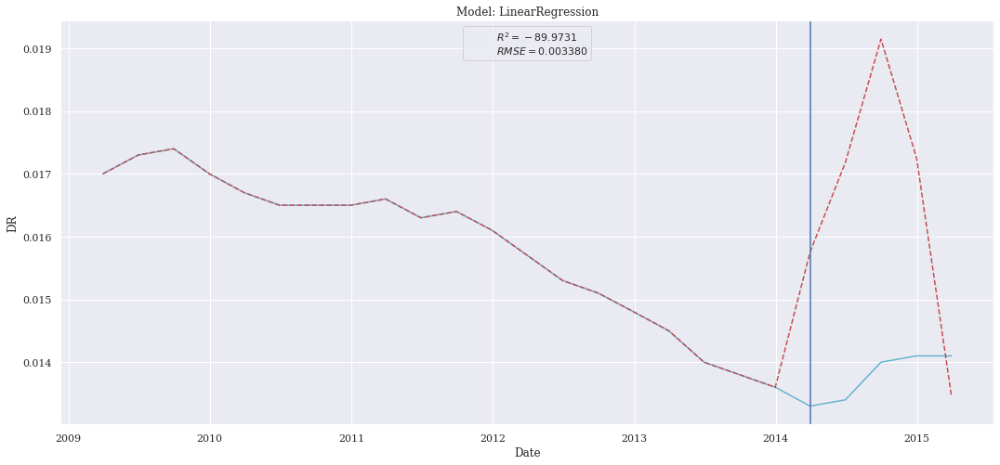

In [ ]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
The SelectFromModel features and Recursive Features seems to give the most promising results. We will use the Knn, LinearSVR, and DecisionTree in order to design our solution.

### GridSearch on KNeighborsRegressor

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_sfm,split=split,norm=norm)
params_knr = {"n_neighbors":[1,2,3,4,5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[1,2,3,4,5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr,metric="r2")
print(params,score)

Fitting 2 folds for each of 800 candidates, totalling 1600 fits
{'algorithm': 'auto', 'leaf_size': 1, 'n_neighbors': 1, 'p': 2, 'weights': 'uniform'} -21.075471698113088


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.001935,0.000004,0.00188,-21.075472


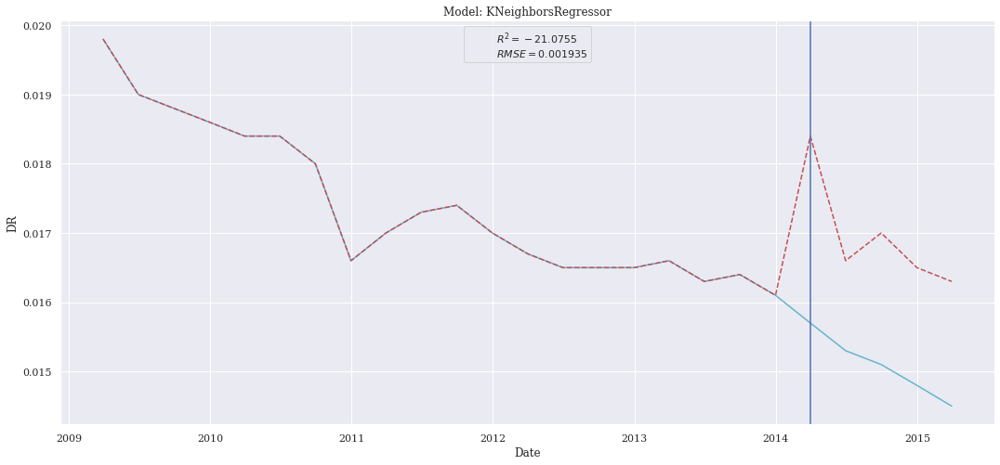

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on LinearSVR

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_sfm,split=split,norm=norm)
params_svr = {"epsilon":[0,0.1,0.2],"C":[1,0.7,0.3,0.1],"loss":["epsilon_insensitive","squared_epsilon_insensitive"],"intercept_scaling":[1,5,10,15]}
params,score = params_grid(X_train,y_train,X_test,y_test,"svr",params_svr,metric="r2")
print(params,score)

Fitting 2 folds for each of 96 candidates, totalling 192 fits


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number

{'C': 0.1, 'epsilon': 0, 'intercept_scaling': 15, 'loss': 'epsilon_insensitive'} -16.266772787877898


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["svr"],parameters={"p_svr":params})
summary

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001944,0.000004,0.001878,-21.279233


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


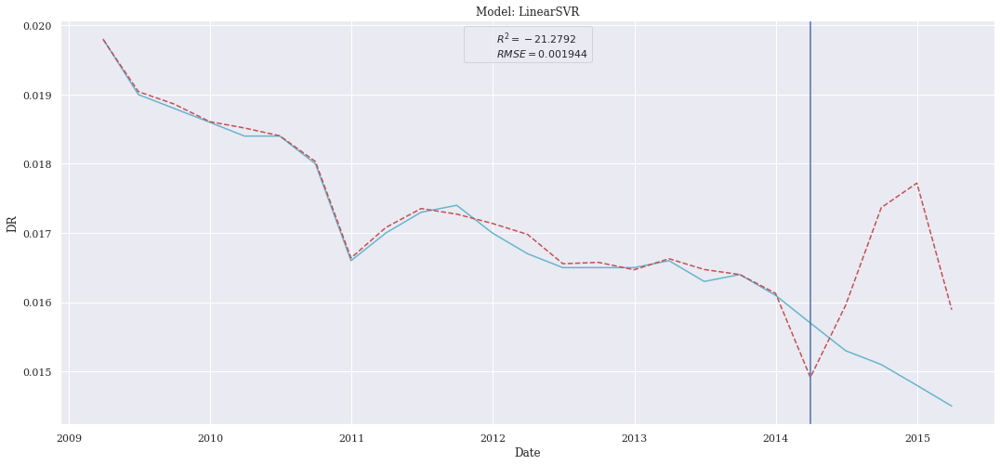

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

### GridSearch on DecisionTree

In [ ]:
X_train, X_test, y_train, y_test = clean_data(data,start,b"Totale",col_used=cl.col_totale_recur,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='r2')
print(params,score)

Fitting 2 folds for each of 12 candidates, totalling 24 fits
{'criterion': 'poisson', 'max_features': 'auto', 'splitter': 'best'} -12.573113207547093


In [ ]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001517,0.000002,0.00146,-12.573113


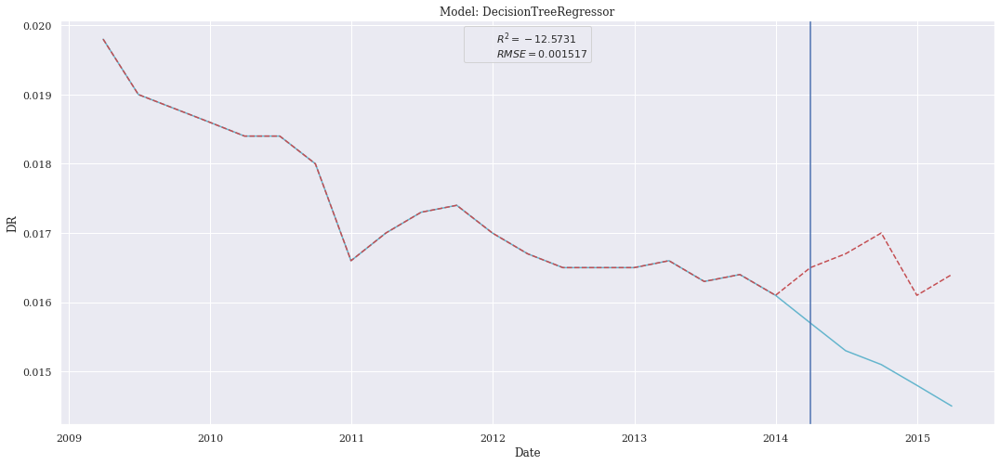

In [ ]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index[start:],name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the others. With the Grid we obtain a r2 equals to -12.57 against 15.38 before GridSearch. Concerning the rmse is now 0.001517 against 0.001667.

# Model to keep

## CHR2

In [5]:
chronique=b'CHR2'
start = 1
period = 12
norm = "MinMax"
split = 0.2

In [6]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,chronique=chronique,period=period,col_used=cl.col_2_tree,split=split,norm=norm)
index = pd.concat([X_train, X_test,X_validation], axis=1).index
summary = summary_ml(X_train,y_train,X_test,y_test,models=['rid'])
summary

,rmse,mse,mae,r2
Index,,,,
Ridge,0.000217,4.724633e-08,0.000199,-0.505193


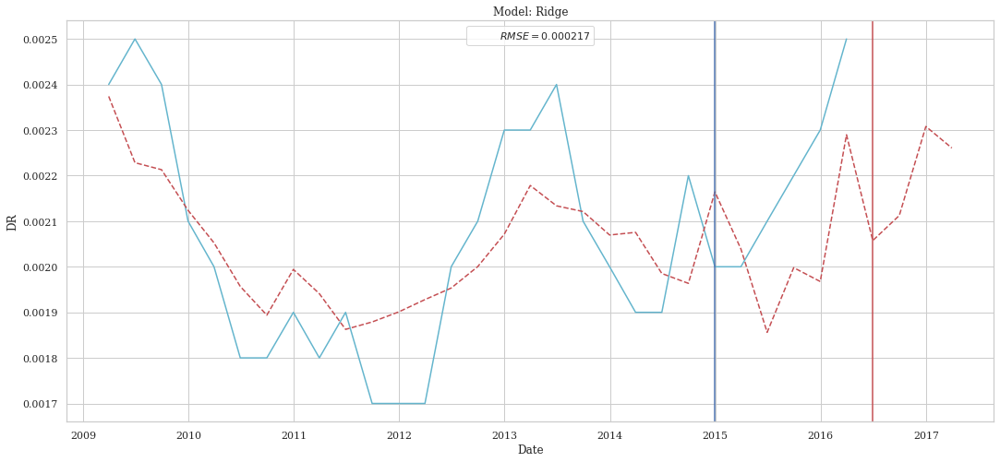

In [7]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  y_validation_pred = y_pred(X_train,y_train,X_validation,y_test=False,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],y_validation=y_validation_pred,period=period,df_score=summary)